<!-- <img src="https://intranet.cnpem.br/arquivo/editor/file/000_LOGOTIPOS/Ilum_sem%20assinatura.png" alt="Descrição da imagem" style="width: 1000px; height: auto; "> -->

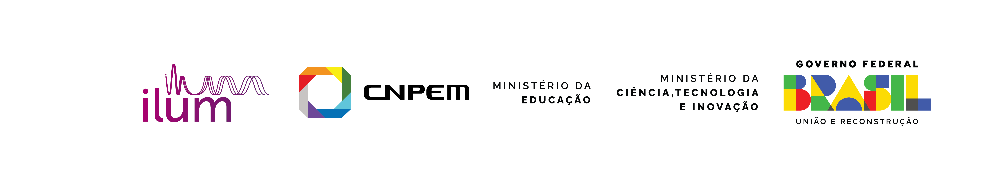
 
<div style=" padding: 10px; font-size: 70px; text-align: center;">
<strong>Tarrasque 🧌:</strong>
<div style=" padding: 10px; font-size: 28px; text-align: center;">
<strong>Previsão de severidade de enfisema</strong>
 
<div style=" padding: 10px; font-size: 16px; text-align: center;">
<strong>Autores:</strong> Júlia Guedes, Lorena Ribeiro e Emily Gomes
<div style=" padding: 10px; font-size: 17px; text-align: center;">
<strong>Professor:</strong> Daniel R. Cassar

<div style="background-color: lightblue; font-size: 16px; padding: 10px;">
<div style="text-align: justify"><strong>Objetivo:</strong> Identifique e otimize os hiperparâmetros de uma rede neural do tipo MLP para resolver um problema de regressão ou de classificação de interesse científico. Espera-se o uso de boas práticas em ciências de dados assim como os discutidos nesta disciplina e os já apresentados em disciplinas anteriores. Teste ao menos 100 diferentes arquiteturas de rede durante sua otimização de hiperparâmetros. Os dados para treinar o modelo devem ser dados tabulados (isto é, não podem ser imagens, textos, áudios ou vídeos) e não podem ser dados sequenciais (como, por exemplo, séries temporais). Evite o uso de datasets didáticos como o dos pinguins ou o do titanic. É necessário apresentar o problema escolhido ao professor para aprovação (pode enviar uma mensagem no teams se preferir).
 <em>MNIST</em>.</div>

## 💡**Introdução** 

#### **Otimização de hiperparâmetros**
<p style="text-align:justify;">
De forma geral, é possível definir otimização como abordagem matemática voltada para a busca da melhor solução possível dentro de um conjunto de alternativas. Sendo que, para isso, é preciso respeitar os objetivos e restrições impostos pelo problema. Atualmente, diversas estratégias de otimização estão disponíveis, sendo sua aplicação dependente da natureza e complexidade do cenário analisado. [1]
</p> 

<p style="text-align:justify;">
No contexto de aprendizado de máquina, o principal desafio de otimização consiste na busca dos hiperparâmetros dos modelos treinados. Esses, por sua vez, podem ser conceituados como as variáveis de um modelo que não são aprendidas durante o processo de treinamento, mas sim são definidas pelo usuário para buscar a melhor performance possível do modelo. Nesse sentido, existe alguns algoritmos que podem ser utilizados para essa finalidade, tais como, busca em grade, busca aleatória, algoritmos genéticos e, na linguagem Python, a biblioteca Optuna.
</p>

<p style="text-align:justify;">
A <strong>busca em grade</strong> é uma metodologia para o ajuste de hiperparâmetros que consiste em explorar exaustivamente o espaço com todos os conjuntos possíveis de hiperparâmetros. Com isso, o objetivo é encontrar o melhor conjunto dessas variáveis para o modelo. Contudo, ao gerar todas as configurações possíveis de valores discretos, há um alto consumo de recursos computacionais e, desse modo, essa abordagem mostra-se ineficiente para lidar com a maioria dos problemas. [2]
</p>

<p style="text-align:justify;">
A <strong>busca aleatória</strong>, por sua vez, utiliza distribuições estatísticas em vez de valores discretos para os parâmetros. Ao longo das iterações, os modelos são comparados com o objetivo de encontrar a melhor configuração. Nessa metodologia, não há garantia de que o melhor modelo será encontrado, mas, geralmente, ela retorna resultados comparáveis aos da busca em grade, com menor tempo de execução. [2]
</p>

<p style="text-align:justify;">
Em relação ao <strong>Optuna</strong>, esse algoritmo utiliza o princípio do Teorema de Bayes para encontrar os hiperparâmetros. Ou seja, o processo é iterativo, sendo que o próximo palpite para a combinação de variáveis depende da anterior. O Optuna, assim como os demais algoritmos Bayesianos seleciona probabilisticamente um novo conjunto de valores de hiperparâmetros com maior probabilidade de gerar melhores resultados.
</p>

#### **Dataset**
<p style="text-align:justify;">
Para testar os diferentes métodos de otimização, utilizaremos o dataset "CD4/CD8 Ratio: T helper cells", do módulo Kaggle, o qual trata sobre severidade de enfisemas pulmonares.
</p>

<p style="text-align:justify;">
Em pessoas infectadas com HIV (HIV+)  de doenças crônicas pulmonares e enfisema são maiores que em pessoas não infectadas.  Apesar do uso de tabaco aumentar o risco de COPD(doenças pulmonares obstrutivas crônicas), a infecção por HIV se mostra como um fator de risco independente, principalmente em subtipos como enfisemas. Uma das possibilidades de conexões entre a maior recorrencia dessas doenças em pessoas HIV+ são disfunções imune, ativações imunológicas relacionadas ao HIV e comprometimento imunológico.
</p>

<p style="text-align:justify;">
Uma possível forma de se analisar essa relação é pela análise da razão entre a quantidade de CD4+ e CD8+ que são subtipos de linfócitos T, sendo o primeiro tipo auxiliar e o segundo os citotóxicos. Um baixo indíce dessa razão no sangue indica processos de ativação imune em pacientes HIV+ e a marcadores inflamatórios e de senescência. Isso aumenta a incidencia de mortalidade por doenças crônicas, como enfisemas, nesses pacientes.
</p>

<p style="text-align:justify;">
Além disso, no dataset estão presentes alguns marcadores relacionados a essas doenças presentes no sangue e plasma, como CD14 solúvel(sCD14), FEV1 (Volume Expiratório Forçado ), e DLCO (capacidade de difusão) e outros marcadores de COPD. Também foram adiconados outros dados dos pacientes, como idade, sexo, as relações deles com o uso de tabaco, entre algumas outras informações.
Dentre esses dados, estão informações em dados numéricos, mas também dados categóricos. Desse modo, será utilizado métodos de encoders para transformar esses dados categóricos em numéricos. Para os encoders será utilizado os encondings one-hot (transforma os dados categóricos em binários, como 0 e 1, sendo 1 para os casos afirmativos e 0 para os negativos) e ordinal (é utilizado para dados categóricos em que há uma ordem inerente).
</p>

## 📈**Hiperparâmetros**
Em relação ao modelo em si, temos que, como o dataset apresenta um <em>target</em> categórico (grau de severidade), e a rede neural treinada será uma classificadora. Como hiperparâmetros, serão considerados função de ativação, camadas, neurônios, arquitetura e taxa de aprendizado. Como demonstração, podemos definir alguns parâmetros que podem ser utilizados na busca em grade - única que não será feita a partir do módulo Optuna: 

In [1]:
from itertools import combinations

FUNCAO_DE_ATIVACAO = ["Relu", "Sigmoide"]

CAMADAS = [1, 3, 10]
NEURONIOS = [10, 9, 8, 7, 6, 5, 4, 3, 2]
ARQUITETURA = [list(i) for i in combinations(NEURONIOS, 3)] 
ARQUITETURA += [list(i) for i in combinations(NEURONIOS, 1)] 
ARQUITETURA.append(NEURONIOS)

TAXA_APRENDIZADO = [10**(-5), 10**(-3)]

Aqui, por exemplo, podemos ver exemplos das arquiteturas criadas:

In [2]:
ARQUITETURA

[[10, 9, 8],
 [10, 9, 7],
 [10, 9, 6],
 [10, 9, 5],
 [10, 9, 4],
 [10, 9, 3],
 [10, 9, 2],
 [10, 8, 7],
 [10, 8, 6],
 [10, 8, 5],
 [10, 8, 4],
 [10, 8, 3],
 [10, 8, 2],
 [10, 7, 6],
 [10, 7, 5],
 [10, 7, 4],
 [10, 7, 3],
 [10, 7, 2],
 [10, 6, 5],
 [10, 6, 4],
 [10, 6, 3],
 [10, 6, 2],
 [10, 5, 4],
 [10, 5, 3],
 [10, 5, 2],
 [10, 4, 3],
 [10, 4, 2],
 [10, 3, 2],
 [9, 8, 7],
 [9, 8, 6],
 [9, 8, 5],
 [9, 8, 4],
 [9, 8, 3],
 [9, 8, 2],
 [9, 7, 6],
 [9, 7, 5],
 [9, 7, 4],
 [9, 7, 3],
 [9, 7, 2],
 [9, 6, 5],
 [9, 6, 4],
 [9, 6, 3],
 [9, 6, 2],
 [9, 5, 4],
 [9, 5, 3],
 [9, 5, 2],
 [9, 4, 3],
 [9, 4, 2],
 [9, 3, 2],
 [8, 7, 6],
 [8, 7, 5],
 [8, 7, 4],
 [8, 7, 3],
 [8, 7, 2],
 [8, 6, 5],
 [8, 6, 4],
 [8, 6, 3],
 [8, 6, 2],
 [8, 5, 4],
 [8, 5, 3],
 [8, 5, 2],
 [8, 4, 3],
 [8, 4, 2],
 [8, 3, 2],
 [7, 6, 5],
 [7, 6, 4],
 [7, 6, 3],
 [7, 6, 2],
 [7, 5, 4],
 [7, 5, 3],
 [7, 5, 2],
 [7, 4, 3],
 [7, 4, 2],
 [7, 3, 2],
 [6, 5, 4],
 [6, 5, 3],
 [6, 5, 2],
 [6, 4, 3],
 [6, 4, 2],
 [6, 3, 2],
 [5, 4, 3],


## 📚**Importação das bibliotecas & do dataset** 

Em primeiro lugar, precisamos importar as bibliotecas necessárias para a resolução do problema. Como principais módulos, iremos utilizar o Scikit-learn para tratamento dos dados.

In [3]:
# importação do dataset
import zipfile
import os

# Importação e tratamento dos dados
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import root_mean_squared_error
from sklearn.impute import KNNImputer
from skorch import NeuralNetClassifier
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np

# Definição dos hiperparâmetros
from itertools import combinations
import optuna

# Definição da rede neural
import torch 
import torch.nn as nn 
import torch.optim as optim
import copy

#Análise dos resultados
from sklearn.metrics import accuracy_score, confusion_matrix


C:\Users\julia24002\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


Após importar as bibliotecas será importado o Dataset:

In [4]:
#!kaggle datasets download -d mpwolke/cusersmarildownloadstcellcsv


In [5]:
# Unizip do arquivo para obtenção do Dataset
with zipfile.ZipFile("cusersmarildownloadstcellcsv.zip", "r") as zip_ref:  
    zip_ref.extractall("TCell")
os.listdir("TCell")

['TCell.csv']

Vale ressaltar que a leitura precisará ser realizada pelo formato de string, para que seja possível mudar notação de decimais de vírgulas para pontos.

In [6]:
df = pd.read_csv("TCell/TCell.csv", sep=";", dtype=str)
df = df.applymap(lambda x: x.replace(',', '.') if isinstance(x, str) else x)
df 

C:\Users\julia24002\AppData\Local\Temp\ipykernel_53592\3540719667.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: x.replace(',', '.') if isinstance(x, str) else x)


,study_id,age_at_enrollment,sex,race_ethnicity,BMI,smoking_status,pack_years,inhalational_drugs,ivdu,hivrna,...,pcp,pneu,cd4_cd8_ratio,ART_use,post_FEV1,FEV1_percent_pred,post_FVC,FVC_percent_pred,dlco_percent_pred,emphysema_severity
0,1,52,1,White,31.08838463,current smoker,12.75,1,0,48,...,0,0,0.539454818,1,4.120999813,98.07405853,5.234000206,95.8157196,56.68161392,0
1,2,54,0,Black,26.70339775,former smoker,15,1,0,166,...,0,0,0.640530765,1,1.835000038,79.41847992,2.441999912,83.96646881,70.34482574,0
2,3,49,1,Black,28.09877777,never smoker,0,1,0,48,...,0,0,0.100649349,1,2.957000017,81.4342041,3.683000088,81.26852417,38.7721138,0
3,4,46,0,Black,35.94466019,current smoker,12,1,0,199,...,0,0,1.282485843,2,1.996999979,89.97170258,2.309999943,84.46355438,86.62697601,1
4,5,47,1,Black,24.1571846,current smoker,12.5,0,0,268,...,0,0,0.877697825,1,3.773000002,102.8942871,4.59499979,100.7662354,50.12286758,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,186,55,1,Black,24.03265381,never smoker,0,0,0,48,...,0,0,0.748120308,1,2.263000011,73.05570984,3.553999901,90.37534332,62.305233,0
186,187,55,1,Black,33.91673279,current smoker,12.60000038,1,0,414,...,0,1,0.495790452,2,NaN,87.62913513,NaN,93.9289856,43.86047363,2
187,188,62,1,Black,22.09317017,former smoker,69,1,1,641,...,0,1,0.356818169,2,NaN,45.31075287,NaN,113.178093,25.39070511,NaN
188,189,47,1,Black,26.38555908,current smoker,16.5,1,1,48,...,0,1,0.412499994,1,3.65199995,106.3885193,4.211999893,98.80844116,52.58827591,0


## 💊**Tratamento dos dados** 

Antes de iniciar, podemos retirar a coluna referente ao número do estudo, a qual não será relevante para realização das previsões.

In [7]:
df = df.drop(columns=["study_id"]) #Removendo o número do estudo

Após isso, precisamos realizar o split de treino e teste, a fim de evitar o vazamento de dados. No entanto, é válido destacar que é necessário investigar, por ser um problema de classificação, se as classes estão balanceadas.

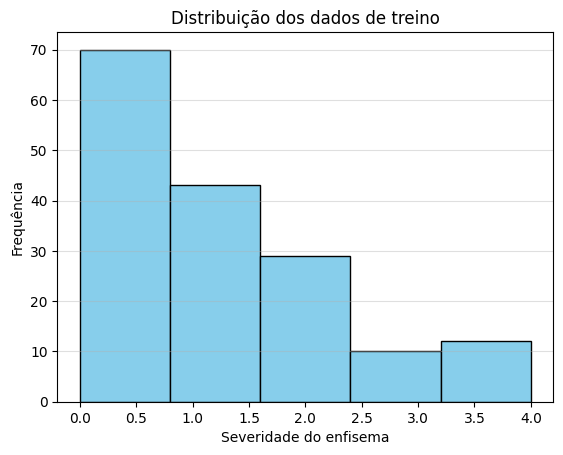

In [8]:
df["emphysema_severity"] = pd.to_numeric(df["emphysema_severity"]) # precisamos transformar para númerros para plotar o histograma

data = df["emphysema_severity"].dropna()

# Plotar o histograma
plt.hist(data, bins=5, edgecolor='black', color='skyblue')
plt.title("Distribuição dos dados de treino")
plt.grid(axis='y', alpha=0.4)
plt.xlabel("Severidade do enfisema")
plt.ylabel("Frequência")
plt.show()

Como é possível observar, as classes não estão balanceadas, ou seja, algumas classes são muito mais frequentes do que outras. Nesse sentido, isso pode ser uma possível causa para obtenção de resultados não satisfatórios. A fim de mitigar esse problema, podemos utilizar a estratégia ``StratifiedKFold``, a qual realiza um split estratificado no conjunto de dados, a fim de que todos os contenham aproximadamente a mesma porcentagem de amostras de cada classe que o conjunto completo.

Vale ressaltar que estratégias serão realizadas para remover os dados faltantes no dataframe. No entanto, essas não podem ser aplicadas no *target* e, portanto, podemos utilizar estratégias para remover apenas os dados referentes a essa coluna, pois a separação entre dados de treino e teste apenas podem ser realizados sem dados faltantes

In [9]:
indices_validos = df["emphysema_severity"].dropna().index

In [10]:
TAMANHO_TESTE = 0.1


# Split treino e teste
indices_treino, indices_teste = train_test_split(
    indices_validos, test_size=TAMANHO_TESTE, random_state=51012, shuffle=True, stratify=df["emphysema_severity"].dropna()
)

indices_treino, indices_validacao = train_test_split(
    indices_validos, test_size=TAMANHO_TESTE, random_state=51012, shuffle=True, stratify=df["emphysema_severity"].dropna()
)

df_treino = df.loc[indices_treino]
df_validacao = df.loc[indices_validacao]
df_teste = df.loc[indices_teste]

Após isso, precisamos realizar um tratamento dos dados, a fim de retirar as colunas que não serão utilizadas para a previsão ("study_id"), realizar a conversão de dados categóricos para numéricos (estratégias de Ordinal Enconder e OneHot Enconder)

#### **Ordinal Enconder**

Para transformar a coluna de "smoking_status" (realtiva ao uso de cigarros) com dados categóricos em dados numéricos utilizou-se o Ordinal Enconder, convertendo os dados respeitando sua ordem inerente.

In [11]:
df_treino = df_treino.dropna(subset=["smoking_status"])
df_teste = df_teste.dropna(subset=["smoking_status"])
df_validacao = df_validacao.dropna(subset=["smoking_status"])

In [12]:
# Passo 1: transformar os dados em um array 2D
coluna_fumantes_treino = df_treino["smoking_status"].values.reshape(-1, 1)
coluna_fumantes_validacao = df_validacao["smoking_status"].values.reshape(-1, 1)
coluna_fumantes_teste = df_teste["smoking_status"].values.reshape(-1, 1)


# Passo 2: criar uma instância do encoder
ordem = [['never smoker', 'former smoker', 'current smoker']]

encoder = OrdinalEncoder(categories=ordem)


# Passo 3: ajustar o  aos dados
encoder.fit(coluna_fumantes_treino)


# Passo 4: aplicar o encoder usando o método `transform`
df_treino["smoking_status"] = encoder.transform(coluna_fumantes_treino)
df_validacao["smoking_status"] = encoder.transform(coluna_fumantes_validacao)
df_teste["smoking_status"] = encoder.transform(coluna_fumantes_teste)

Assim, converteu-se os valores em um interva-lo numérico de 0 a 2, correspondentes a informação categorica.

#### **One Hot Encoder**

Para a conversão dos dados "race_ethnicity" se usou o método de encoder One-hot, visto que são dados multicategóricos.

In [13]:
# Instanciando o encoder
encoder = OneHotEncoder(sparse_output=False)

# Fitando (apenas com os dados de treino)
encoder.fit(df_treino[["race_ethnicity"]])

# Transformando todos os dados com esse encoder
encoder_treino = encoder.transform(df_treino[["race_ethnicity"]])
encoder_validacao = encoder.transform(df_validacao[["race_ethnicity"]])
encoder_teste = encoder.transform(df_teste[["race_ethnicity"]])

# Criando dataframes com as novas colunas geradas
colunas_encoder = encoder.get_feature_names_out(["race_ethnicity"])
df_encoded_treino = pd.DataFrame(encoder_treino, columns=colunas_encoder, index=df_treino.index)
df_encoded_validacao = pd.DataFrame(encoder_validacao, columns=colunas_encoder, index=df_validacao.index)
df_encoded_teste = pd.DataFrame(encoder_teste, columns=colunas_encoder, index=df_teste.index)

# Concatenando essas colunas no dataframe original
df_treino = pd.concat([df_treino, df_encoded_treino], axis=1)
df_validacao = pd.concat([df_validacao, df_encoded_validacao], axis=1)
df_teste = pd.concat([df_teste, df_encoded_teste], axis=1)

# Retirando a coluna original (sem o encoder)
df_treino = df_treino.drop(columns=["race_ethnicity"])
df_validacao = df_validacao.drop(columns=["race_ethnicity"])
df_teste = df_teste.drop(columns=["race_ethnicity"])

Agora, podemos trabalhar no dataframe considerando todos os valores como floats.

In [14]:
df_treino = df_treino.astype(float)
df_validacao = df_validacao.astype(float)
df_teste = df_teste.astype(float)

Em relação a remoção de dados faltantes, com o método usual de remoção de linhas (dropna), seriam perdidas 80 instâncias. Por ser um Dataset pequeno e visando evitar problemas futuros, foi aplicado um k-NN imputer, o qual preenche dados faltantes a partir do resultado de um k-NN com os k vizinhos mais próximos dessa instância. 

Primeiro será identificado quais colunasainda  apresenta dados faltantes:

In [15]:
for coluna in df:
    faltantes = df[coluna].isna().sum()
    print(f"A coluna {coluna} apresenta {faltantes} dados faltantes")

A coluna age_at_enrollment apresenta 0 dados faltantes
A coluna sex apresenta 0 dados faltantes
A coluna race_ethnicity apresenta 0 dados faltantes
A coluna BMI apresenta 7 dados faltantes
A coluna smoking_status apresenta 1 dados faltantes
A coluna pack_years apresenta 4 dados faltantes
A coluna inhalational_drugs apresenta 3 dados faltantes
A coluna ivdu apresenta 4 dados faltantes
A coluna hivrna apresenta 1 dados faltantes
A coluna cd4 apresenta 1 dados faltantes
A coluna s_cd14 apresenta 9 dados faltantes
A coluna nadir_cd4 apresenta 24 dados faltantes
A coluna dm apresenta 0 dados faltantes
A coluna htn apresenta 0 dados faltantes
A coluna anemia apresenta 0 dados faltantes
A coluna chronic_heart_disease apresenta 0 dados faltantes
A coluna tb apresenta 0 dados faltantes
A coluna pcp apresenta 0 dados faltantes
A coluna pneu apresenta 0 dados faltantes
A coluna cd4_cd8_ratio apresenta 0 dados faltantes
A coluna ART_use apresenta 0 dados faltantes
A coluna post_FEV1 apresenta 60 d

Aplicando o K-NN imputer

In [16]:
colunas_fixas = ["emphysema_severity", "smoking_status", 
                 'race_ethnicity_Black', 'race_ethnicity_Hispanic', 'race_ethnicity_Other', 'race_ethnicity_White']

colunas_imputer = list(df.columns)
for coluna in df.columns:
    if coluna in colunas_fixas:
        colunas_imputer.remove(coluna)
print(colunas_imputer)
colunas_imputer.remove('race_ethnicity')
print(colunas_imputer)

['age_at_enrollment', 'sex', 'race_ethnicity', 'BMI', 'pack_years', 'inhalational_drugs', 'ivdu', 'hivrna', 'cd4', 's_cd14', 'nadir_cd4', 'dm', 'htn', 'anemia', 'chronic_heart_disease', 'tb', 'pcp', 'pneu', 'cd4_cd8_ratio', 'ART_use', 'post_FEV1', 'FEV1_percent_pred', 'post_FVC', 'FVC_percent_pred', 'dlco_percent_pred']
['age_at_enrollment', 'sex', 'BMI', 'pack_years', 'inhalational_drugs', 'ivdu', 'hivrna', 'cd4', 's_cd14', 'nadir_cd4', 'dm', 'htn', 'anemia', 'chronic_heart_disease', 'tb', 'pcp', 'pneu', 'cd4_cd8_ratio', 'ART_use', 'post_FEV1', 'FEV1_percent_pred', 'post_FVC', 'FVC_percent_pred', 'dlco_percent_pred']


In [17]:
imputer = KNNImputer()

df_treino_imputado = imputer.fit_transform(df_treino[colunas_imputer])
df_validacao_imputado = imputer.transform(df_validacao[colunas_imputer])
df_teste_imputado = imputer.transform(df_teste[colunas_imputer])

X_imputado_treino = pd.DataFrame(df_treino_imputado, columns=colunas_imputer, index=df_treino.index)
X_imputado_validacao = pd.DataFrame(df_validacao_imputado, columns=colunas_imputer, index=df_validacao.index)
X_imputado_teste = pd.DataFrame(df_teste_imputado, columns=colunas_imputer, index=df_teste.index)

df_treino = pd.concat([X_imputado_treino, df_treino[colunas_fixas]], axis=1)
df_validacao = pd.concat([X_imputado_validacao, df_validacao[colunas_fixas]], axis=1)
df_teste = pd.concat([X_imputado_teste, df_teste[colunas_fixas]], axis=1)


#### **Transfromando em array e normalizando**

A partir do split realizado, podemos dividr os dados em *features* e *target*.

In [18]:
X_treino = df_treino.drop(columns=['emphysema_severity']).values.astype(np.float32)
X_validacao = df_validacao.drop(columns=['emphysema_severity']).values.astype(np.float32)
X_teste = df_teste.drop(columns=['emphysema_severity']).values.astype(np.float32)

y_treino = df_treino['emphysema_severity'].astype(np.int64).values
y_validacao  = df_validacao['emphysema_severity'].astype(np.int64).values
y_teste  = df_teste['emphysema_severity'].astype(np.int64).values

Após isso, a fim de aprimorar o desempenho dos modelos treinados, será aplicado o StandardScaler para normalizar os dados.

In [19]:
normalizador_x = StandardScaler()
X_treino = normalizador_x.fit_transform(X_treino)
X_teste = normalizador_x.transform(X_teste)  
X_validacao = normalizador_x.transform(X_validacao)

Agora, é válido verificar a quantidade de classes presentes no dataset:

In [20]:
#Verificando quantas classes classificadoras temos
print(np.unique(y_treino))
QUANTIDADE_TARGET = len(np.unique(y_treino))
print("Número de classes:", QUANTIDADE_TARGET)

[0 1 2 3 4]
Número de classes: 5


Finalmente, é possível avaliar a distribuição dos dados de treino, validação e teste, para identificar se o método de estratificação foi efetivo.

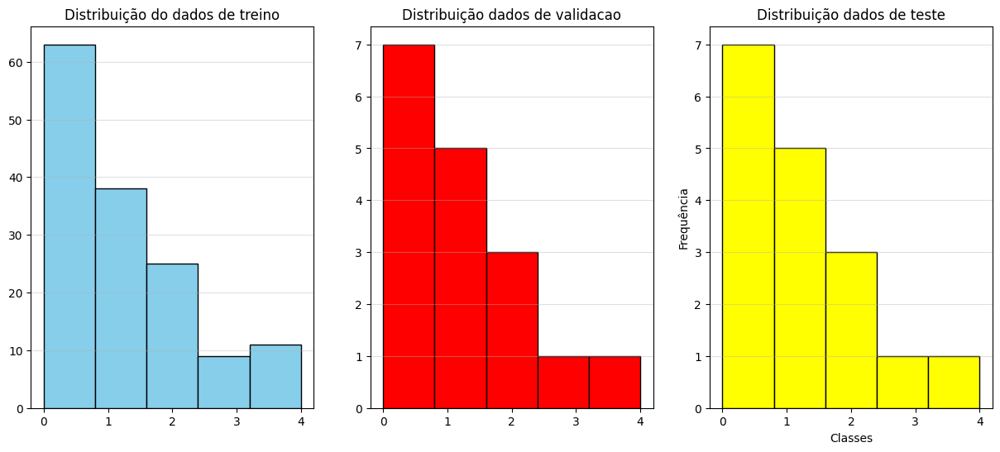

In [21]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 6))

ax1.hist(y_treino, bins=5, edgecolor='black', color='skyblue')
ax1.set_title("Distribuição do dados de treino")

ax2.hist(y_validacao, bins=5, edgecolor='black', color='red')
ax2.set_title("Distribuição dados de validacao")

ax3.hist(y_teste, bins=5, edgecolor='black', color='yellow')
ax3.set_title("Distribuição dados de teste")

ax1.grid(axis='y', alpha=0.4)
ax2.grid(axis='y', alpha=0.4)
ax3.grid(axis='y', alpha=0.4)

plt.xlabel("Classes")
plt.ylabel("Frequência")
    
plt.show()

## 🎲**Busca Aleatória**

Para implementação desse otimizador utilizou-se a biblicoteca do Optuna e executou-o durante 100 épocas. Como principal diferença para o módulo Optuna convencional, adicionou-se a variável `sampler=optuna.samplers.RandomSampler(seed=51012)` para alterar o modo de funcionamento para uma busca aleatória. Para a arquitetura da rede se utilizou valores das camadas entre 1 e 10, funções de ativação Sigmoide ou ReLu, número de neurônios ente 2 e 15, taxa de aprendizado de $10^{-5}$ e $10^{-2}$. Além disso, foi aplicado dropout com valores progressivos de 20% até 50%. O critério da performance foi calculado por CrossEntropyLoss e otimizado por meio do método Adam.

In [22]:
#Criando a instância com os parâmetros necessários
def cria_instancia_mlp(trial):
     """Cria uma instância do modelo desejado (MLP)"""
     n_camadas = trial.suggest_int('n_layers', 1, 10)
     num_features = 29
     camadas = [num_features]
     for i in range(n_camadas):
        camadas.append(trial.suggest_int(f'n_units_{i}', 2, 15))
     camadas.append(5)
     nome_ativacao = trial.suggest_categorical("funcao_de_ativacao", ["Relu", "Sigmoide"])
     funcao_de_ativacao = nn.ReLU() if nome_ativacao == "Relu" else nn.Sigmoid()
     camadas_rede = []
     for i in range(len(camadas) - 2):
        camadas_rede.append(nn.Linear(camadas[i], camadas[i+1]))
        camadas_rede.append(funcao_de_ativacao)
        p = trial.suggest_float("dropout_l{}".format(i), 0.2, 0.5)
        camadas_rede.append(nn.Dropout(p))
     camadas_rede.append(nn.Linear(camadas[-2], camadas[-1]))
     camadas_rede.append(nn.LogSoftmax(dim=1))

# Classe para construção da MLP com os parâmetros sorteados em cada época
     
     class MLP(nn.Module):   
        def __init__(self):
            super().__init__()
            camadas_rede = []
            for i in range(len(camadas) - 2):
                camadas_rede.append(nn.Linear(camadas[i], camadas[i+1]))
                camadas_rede.append(funcao_de_ativacao)
            camadas_rede.append(nn.Linear(camadas[-2], camadas[-1]))
            self.rede_neural = nn.Sequential(*camadas_rede)
        def forward(self, X):
            return self.rede_neural(X)

     return NeuralNetClassifier(
        MLP,
        max_epochs=100,
        lr=trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True),
        criterion=torch.nn.CrossEntropyLoss(),
        optimizer=torch.optim.Adam,
    )         

#Função objetivo para análise do desempenho da rede gerada, com aplicação da validação cruzada 
def funcao_objetivo(trial, X, y, num_folds):
    """Computa a Acurácia - com a utilização de validação cruzada - para teste a eficiência das instâncias geradas """
    modelo = cria_instancia_mlp(trial)
 
    metricas = cross_val_score(
            modelo,
            X,
            y,
            scoring="accuracy",
            cv=num_folds,
        )
    return -metricas.mean()
 
def funcao_objetivo_parcial(trial):
    "Função objetivo que apenas possui como argumento o objeto trial"
    return funcao_objetivo(trial, X_treino, y_treino, 3)
 
    
estudo_mlp= optuna.create_study(
    sampler=optuna.samplers.RandomSampler(seed=51012),
    direction="minimize",
    study_name="otimizacao_optuna_busca_aleatoria_optuna",
    storage=f"sqlite:///otimizacao_optuna_busca_aleatoria_optuna.db",
    load_if_exists=True,
    
    )
 
estudo_mlp.optimize(funcao_objetivo_parcial, n_trials=100)
 
melhor_trial_mlp = estudo_mlp.best_trial
 
    
parametros_melhor_trial_mlp_aleatorio = melhor_trial_mlp.params
print(f"Parâmetros do melhor trial: {parametros_melhor_trial_mlp_aleatorio}")

[I 2025-06-10 13:41:30,269] A new study created in RDB with name: otimizacao_optuna_busca_aleatoria_optuna


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6484       0.3000        1.5755  0.0000
      2        1.6215       0.3000        1.5634  0.0180
      3        1.5965       0.3000        1.5518  0.0000
      4        1.5735       0.3000        1.5416  0.0156
      5        1.5521       0.3000        1.5326  0.0031
      6        1.5323       0.3500        1.5245  0.0030
      7        1.5142       0.4000        1.5171  0.0000
      8        1.4974       0.4000        1.5103  0.0000
      9        1.4815       0.4000        1.5039  0.0156
     10        1.4665       0.4000        1.4979  0.0000
     11        1.4527       0.4000        1.4916  0.0000
     12        1.4393       0.4500        1.4852  0.0012
     13        1.4262       0.4500        1.4790  0.0000
     14        1.4131       0.5000        1.4735  0.0168
     15        1.4000       0.5000        1.4678  0.0030
     16        1.3869       0.5

[I 2025-06-10 13:41:37,903] Trial 0 finished with value: -0.3696145124716553 and parameters: {'n_layers': 1, 'n_units_0': 4, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.38837105697130714, 'learning_rate': 0.007908800000634425}. Best is trial 0 with value: -0.3696145124716553.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6098       0.2500        1.6073  0.0110
      2        1.6066       0.2500        1.6049  0.0000
      3        1.6035       0.2500        1.6026  0.0000
      4        1.6004       0.2500        1.6002  0.0222
      5        1.5973       0.2500        1.5979  0.0092
      6        1.5942       0.2500        1.5956  0.0158
      7        1.5912       0.2500        1.5934  0.0108
      8        1.5882       0.2500        1.5911  0.0000
      9        1.5852       0.2500        1.5889  0.0000
     10        1.5822       0.2500        1.5867  0.0151
     11        1.5793       0.2500        1.5845  0.0000
     12        1.5764       0.2500        1.5824  0.0194
     13        1.5735       0.2500        1.5803  0.0000
     14        1.5706       0.2500        1.5782  0.0160
     15        1.5678       0.2500        1.5762  0.0040
     16        1.5650       0.2

[I 2025-06-10 13:41:41,468] Trial 1 finished with value: -0.46570294784580496 and parameters: {'n_layers': 9, 'n_units_0': 5, 'n_units_1': 6, 'n_units_2': 13, 'n_units_3': 7, 'n_units_4': 6, 'n_units_5': 9, 'n_units_6': 12, 'n_units_7': 4, 'n_units_8': 2, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.41244625887908304, 'dropout_l1': 0.2102837329665363, 'dropout_l2': 0.2524552391035243, 'dropout_l3': 0.45320261151514607, 'dropout_l4': 0.3391380310237894, 'dropout_l5': 0.3601663400155011, 'dropout_l6': 0.26883799309974976, 'dropout_l7': 0.4966455842059569, 'dropout_l8': 0.26560635418230666, 'learning_rate': 0.005147791144480428}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5087       0.4000        1.5648  0.0000
      2        1.4904       0.4000        1.5515  0.0150
      3        1.4736       0.4000        1.5395  0.0005
      4        1.4582       0.4000        1.5289  0.0025
      5        1.4442       0.4000        1.5196  0.0125
      6        1.4314       0.4000        1.5115  0.0000
      7        1.4199       0.4000        1.5046  0.0157
      8        1.4097       0.4000        1.4987  0.0000
      9        1.4005       0.4000        1.4939  0.0157
     10        1.3925       0.4000        1.4900  0.0000
     11        1.3854       0.4000        1.4870  0.0156
     12        1.3792       0.4000        1.4847  0.0000
     13        1.3739       0.4000        1.4831  0.0205
     14        1.3693       0.4000        1.4821  0.0000
     15        1.3654       0.4000        1.4815  0.0198
     16        1.3622       0.4

[I 2025-06-10 13:41:45,188] Trial 2 finished with value: -0.43154761904761907 and parameters: {'n_layers': 9, 'n_units_0': 13, 'n_units_1': 7, 'n_units_2': 10, 'n_units_3': 6, 'n_units_4': 10, 'n_units_5': 14, 'n_units_6': 11, 'n_units_7': 15, 'n_units_8': 5, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.41402998836432503, 'dropout_l1': 0.20444875449614047, 'dropout_l2': 0.3393885231679859, 'dropout_l3': 0.2090470344232657, 'dropout_l4': 0.4533739152254932, 'dropout_l5': 0.28935066520389596, 'dropout_l6': 0.42332971753574244, 'dropout_l7': 0.40716574332118927, 'dropout_l8': 0.37905903088817794, 'learning_rate': 0.007926723602081203}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6994       0.1000        1.6885  0.0043
      2        1.6992       0.1000        1.6884  0.0042
      3        1.6990       0.1000        1.6882  0.0000
      4        1.6989       0.1000        1.6881  0.0165
      5        1.6987       0.1000        1.6879  0.0000
      6        1.6985       0.1000        1.6877  0.0003
      7        1.6983       0.1000        1.6876  0.0000
      8        1.6982       0.1000        1.6874  0.0006
      9        1.6980       0.1000        1.6873  0.0143
     10        1.6978       0.1000        1.6871  0.0060
     11        1.6976       0.1000        1.6870  0.0062
     12        1.6975       0.1000        1.6868  0.0000
     13        1.6973       0.1000        1.6867  0.0208
     14        1.6971       0.1000        1.6865  0.0051
     15        1.6969       0.1000        1.6863  0.0014
     16        1.6967       0.1

[I 2025-06-10 13:41:48,401] Trial 3 finished with value: -0.23426870748299322 and parameters: {'n_layers': 5, 'n_units_0': 14, 'n_units_1': 13, 'n_units_2': 14, 'n_units_3': 10, 'n_units_4': 5, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.27743869604057714, 'dropout_l1': 0.2822750157539535, 'dropout_l2': 0.48899850589452803, 'dropout_l3': 0.32757065614807623, 'dropout_l4': 0.24147580960901238, 'learning_rate': 6.332281398822237e-05}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7985       0.1500        1.7845  0.0104
      2        1.7889       0.1500        1.7767  0.0000
      3        1.7795       0.1500        1.7691  0.0135
      4        1.7705       0.1500        1.7620  0.0019
      5        1.7618       0.1500        1.7553  0.0159
      6        1.7534       0.1500        1.7498  0.0050
      7        1.7453       0.1500        1.7443  0.0054
      8        1.7379       0.1500        1.7401  0.0002
      9        1.7312       0.1500        1.7367  0.0159
     10        1.7257       0.1500        1.7333  0.0000
     11        1.7212       0.1500        1.7303  0.0061
     12        1.7172       0.1500        1.7272  0.0055
     13        1.7136       0.1500        1.7239  0.0064
     14        1.7100       0.1500        1.7207  0.0090
     15        1.7064       0.1500        1.7174  0.0033
     16        1.7028       0.1

[I 2025-06-10 13:41:51,286] Trial 4 finished with value: -0.39597505668934235 and parameters: {'n_layers': 4, 'n_units_0': 8, 'n_units_1': 7, 'n_units_2': 12, 'n_units_3': 2, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.4175367785148987, 'dropout_l1': 0.3511840008151993, 'dropout_l2': 0.21433836573719042, 'dropout_l3': 0.497189978873598, 'learning_rate': 0.004641250972320367}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7106       0.3000        1.6623  0.0130
      2        1.7091       0.3000        1.6616  0.0092
      3        1.7077       0.3000        1.6608  0.0031
      4        1.7062       0.3000        1.6601  0.0034
      5        1.7048       0.3000        1.6593  0.0041
      6        1.7034       0.3000        1.6585  0.0113
      7        1.7020       0.3000        1.6577  0.0000
      8        1.7007       0.3000        1.6569  0.0081
      9        1.6993       0.3000        1.6561  0.0098
     10        1.6980       0.3000        1.6553  0.0025
     11        1.6966       0.3000        1.6544  0.0112
     12        1.6953       0.3000        1.6536  0.0060
     13        1.6939       0.3000        1.6528  0.0050
     14        1.6926       0.3000        1.6519  0.0000
     15        1.6913       0.3000        1.6511  0.0127
     16        1.6900       0.3

[I 2025-06-10 13:41:53,888] Trial 5 finished with value: -0.25311791383219956 and parameters: {'n_layers': 2, 'n_units_0': 5, 'n_units_1': 6, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.4082486544598054, 'dropout_l1': 0.2860517985801237, 'learning_rate': 0.0005389615135389625}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6226       0.1500        1.6035  0.0000
      2        1.5847       0.1500        1.5742  0.0148
      3        1.5503       0.4000        1.5486  0.0000
      4        1.5194       0.4000        1.5265  0.0000
      5        1.4921       0.4000        1.5081  0.0091
      6        1.4683       0.4000        1.4931  0.0000
      7        1.4479       0.4000        1.4814  0.0020
      8        1.4307       0.4000        1.4728  0.0131
      9        1.4164       0.4000        1.4668  0.0075
     10        1.4046       0.4000        1.4633  0.0051
     11        1.3950       0.4000        1.4618  0.0000
     12        1.3873       0.4000        1.4619  0.0000
     13        1.3812       0.4000        1.4634  0.0000
     14        1.3763       0.4000        1.4658  0.0000
     15        1.3724       0.4000        1.4690  0.0026
     16        1.3692       0.4

[I 2025-06-10 13:41:56,772] Trial 6 finished with value: -0.4111394557823129 and parameters: {'n_layers': 5, 'n_units_0': 11, 'n_units_1': 3, 'n_units_2': 13, 'n_units_3': 9, 'n_units_4': 12, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.20972780471858965, 'dropout_l1': 0.48413845207202405, 'dropout_l2': 0.2961651281196573, 'dropout_l3': 0.4208824397592465, 'dropout_l4': 0.4505854182962091, 'learning_rate': 0.007240508272660258}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8022       0.2500        1.7872  0.0049
      2        1.8016       0.2500        1.7867  0.0084
      3        1.8010       0.2500        1.7862  0.0000
      4        1.8005       0.2500        1.7857  0.0082
      5        1.7999       0.2500        1.7852  0.0069
      6        1.7993       0.2500        1.7847  0.0000
      7        1.7988       0.2500        1.7841  0.0139
      8        1.7982       0.2500        1.7836  0.0000
      9        1.7977       0.2500        1.7831  0.0000
     10        1.7971       0.2500        1.7826  0.0012
     11        1.7965       0.2500        1.7821  0.0000
     12        1.7960       0.2500        1.7816  0.0178
     13        1.7954       0.2500        1.7811  0.0164
     14        1.7949       0.2500        1.7806  0.0136
     15        1.7943       0.2500        1.7801  0.0034
     16        1.7938       0.2

[I 2025-06-10 13:42:00,255] Trial 7 finished with value: -0.1991213151927438 and parameters: {'n_layers': 8, 'n_units_0': 6, 'n_units_1': 4, 'n_units_2': 10, 'n_units_3': 4, 'n_units_4': 8, 'n_units_5': 7, 'n_units_6': 12, 'n_units_7': 2, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.26375608451126964, 'dropout_l1': 0.32361510359748746, 'dropout_l2': 0.48474188009963787, 'dropout_l3': 0.2609004695561191, 'dropout_l4': 0.4236499335915862, 'dropout_l5': 0.2618381754946721, 'dropout_l6': 0.4579555631520872, 'dropout_l7': 0.4751742749392849, 'learning_rate': 0.00027128716954220866}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5488       0.2500        1.5674  0.0014
      2        1.5486       0.2500        1.5672  0.0124
      3        1.5484       0.2500        1.5670  0.0050
      4        1.5481       0.2500        1.5669  0.0052
      5        1.5479       0.2500        1.5667  0.0013
      6        1.5477       0.2500        1.5665  0.0108
      7        1.5475       0.2500        1.5663  0.0027
      8        1.5472       0.2500        1.5661  0.0000
      9        1.5470       0.2500        1.5660  0.0005
     10        1.5468       0.2500        1.5658  0.0000
     11        1.5466       0.2500        1.5656  0.0049
     12        1.5463       0.2500        1.5654  0.0000
     13        1.5461       0.2500        1.5653  0.0081
     14        1.5459       0.2500        1.5651  0.0050
     15        1.5457       0.2500        1.5649  0.0066
     16        1.5455       0.2

[I 2025-06-10 13:42:02,924] Trial 8 finished with value: -0.17049319727891157 and parameters: {'n_layers': 3, 'n_units_0': 12, 'n_units_1': 8, 'n_units_2': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.27098792078588785, 'dropout_l1': 0.38104478404513675, 'dropout_l2': 0.40790161617439025, 'learning_rate': 7.810234281957726e-05}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6156       0.2000        1.5739  0.0000
      2        1.6122       0.2500        1.5716  0.0097
      3        1.6088       0.2500        1.5695  0.0052
      4        1.6054       0.3000        1.5674  0.0067
      5        1.6021       0.3500        1.5654  0.0026
      6        1.5988       0.3500        1.5634  0.0117
      7        1.5955       0.4000        1.5613  0.0019
      8        1.5923       0.4000        1.5592  0.0104
      9        1.5891       0.4000        1.5572  0.0055
     10        1.5860       0.4000        1.5553  0.0046
     11        1.5829       0.4000        1.5535  0.0060
     12        1.5797       0.4500        1.5516  0.0041
     13        1.5765       0.4500        1.5499  0.0045
     14        1.5733       0.4500        1.5482  0.0031
     15        1.5701       0.4500        1.5465  0.0060
     16        1.5668       0.4

[I 2025-06-10 13:42:05,629] Trial 9 finished with value: -0.4179421768707483 and parameters: {'n_layers': 2, 'n_units_0': 6, 'n_units_1': 5, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.2114367629396362, 'dropout_l1': 0.21045417315486614, 'learning_rate': 0.0013527804338066358}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7467       0.1000        1.7231  0.0050
      2        1.7453       0.1000        1.7219  0.0068
      3        1.7439       0.1000        1.7207  0.0027
      4        1.7426       0.1000        1.7196  0.0070
      5        1.7412       0.1000        1.7184  0.0083
      6        1.7399       0.1000        1.7172  0.0074
      7        1.7385       0.1000        1.7161  0.0063
      8        1.7371       0.1000        1.7149  0.0086
      9        1.7358       0.1000        1.7137  0.0070
     10        1.7344       0.1000        1.7126  0.0090
     11        1.7330       0.1000        1.7114  0.0074
     12        1.7316       0.1000        1.7102  0.0079
     13        1.7302       0.1000        1.7090  0.0040
     14        1.7288       0.1000        1.7078  0.0057
     15        1.7274       0.1000        1.7066  0.0098
     16        1.7260       0.1

[I 2025-06-10 13:42:08,875] Trial 10 finished with value: -0.34311224489795916 and parameters: {'n_layers': 6, 'n_units_0': 12, 'n_units_1': 11, 'n_units_2': 14, 'n_units_3': 14, 'n_units_4': 12, 'n_units_5': 12, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.37030869025639046, 'dropout_l1': 0.2697764913320242, 'dropout_l2': 0.44055435010600963, 'dropout_l3': 0.2447549644391792, 'dropout_l4': 0.41652593761036827, 'dropout_l5': 0.37882506328638366, 'learning_rate': 0.0007762403857784967}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5232       0.4000        1.5483  0.0000
      2        1.5231       0.4000        1.5482  0.0099
      3        1.5230       0.4000        1.5481  0.0027
      4        1.5228       0.4000        1.5480  0.0000
      5        1.5227       0.4000        1.5480  0.0058
      6        1.5226       0.4000        1.5479  0.0000
      7        1.5224       0.4000        1.5478  0.0049
      8        1.5223       0.4000        1.5477  0.0024
      9        1.5222       0.4000        1.5476  0.0050
     10        1.5220       0.4000        1.5475  0.0036
     11        1.5219       0.4000        1.5474  0.0064
     12        1.5218       0.4000        1.5473  0.0000
     13        1.5216       0.4000        1.5472  0.0121
     14        1.5215       0.4000        1.5471  0.0046
     15        1.5214       0.4000        1.5471  0.0064
     16        1.5212       0.4

[I 2025-06-10 13:42:11,460] Trial 11 finished with value: -0.29435941043083896 and parameters: {'n_layers': 2, 'n_units_0': 4, 'n_units_1': 14, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.262540452739997, 'dropout_l1': 0.3033983161447595, 'learning_rate': 3.216428520994279e-05}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7024       0.2500        1.7106  0.0051
      2        1.7024       0.2500        1.7106  0.0036
      3        1.7024       0.2500        1.7106  0.0000
      4        1.7023       0.2500        1.7105  0.0060
      5        1.7023       0.2500        1.7105  0.0040
      6        1.7023       0.2500        1.7105  0.0070
      7        1.7023       0.2500        1.7105  0.0125
      8        1.7022       0.2500        1.7104  0.0064
      9        1.7022       0.2500        1.7104  0.0080
     10        1.7022       0.2500        1.7104  0.0050
     11        1.7021       0.2500        1.7104  0.0074
     12        1.7021       0.2500        1.7104  0.0089
     13        1.7021       0.2500        1.7103  0.0015
     14        1.7021       0.2500        1.7103  0.0124
     15        1.7020       0.2500        1.7103  0.0053
     16        1.7020       0.2

[I 2025-06-10 13:42:14,852] Trial 12 finished with value: -0.377125850340136 and parameters: {'n_layers': 9, 'n_units_0': 7, 'n_units_1': 4, 'n_units_2': 3, 'n_units_3': 9, 'n_units_4': 4, 'n_units_5': 4, 'n_units_6': 10, 'n_units_7': 4, 'n_units_8': 4, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3317548373213538, 'dropout_l1': 0.2593740292245507, 'dropout_l2': 0.2488318114724012, 'dropout_l3': 0.376835897179264, 'dropout_l4': 0.2893250074685209, 'dropout_l5': 0.44228561403856465, 'dropout_l6': 0.22721226298280742, 'dropout_l7': 0.3047528685717947, 'dropout_l8': 0.2714110737874313, 'learning_rate': 1.2201684663036786e-05}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5619       0.2500        1.5686  0.0112
      2        1.5617       0.2500        1.5685  0.0050
      3        1.5616       0.2500        1.5684  0.0061
      4        1.5615       0.2500        1.5683  0.0000
      5        1.5613       0.2500        1.5682  0.0182
      6        1.5612       0.2500        1.5681  0.0000
      7        1.5610       0.2500        1.5680  0.0000
      8        1.5609       0.2500        1.5679  0.0000
      9        1.5608       0.2500        1.5678  0.0192
     10        1.5606       0.2500        1.5677  0.0049
     11        1.5605       0.2500        1.5676  0.0040
     12        1.5604       0.2500        1.5675  0.0000
     13        1.5602       0.2500        1.5674  0.0185
     14        1.5601       0.2500        1.5673  0.0141
     15        1.5599       0.2500        1.5672  0.0060
     16        1.5598       0.2

[I 2025-06-10 13:42:18,451] Trial 13 finished with value: -0.2614795918367347 and parameters: {'n_layers': 10, 'n_units_0': 11, 'n_units_1': 9, 'n_units_2': 3, 'n_units_3': 5, 'n_units_4': 5, 'n_units_5': 6, 'n_units_6': 5, 'n_units_7': 4, 'n_units_8': 4, 'n_units_9': 14, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.4216544768544614, 'dropout_l1': 0.4865873084870467, 'dropout_l2': 0.24969007086086786, 'dropout_l3': 0.4443698637161138, 'dropout_l4': 0.24773293931211554, 'dropout_l5': 0.43094002767380024, 'dropout_l6': 0.3695921789918345, 'dropout_l7': 0.36310796682427265, 'dropout_l8': 0.22698787718526894, 'dropout_l9': 0.4460856317051187, 'learning_rate': 3.2755173890020615e-05}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5784       0.4000        1.5812  0.0000
      2        1.5784       0.4000        1.5811  0.0000
      3        1.5784       0.4000        1.5811  0.0000
      4        1.5783       0.4000        1.5811  0.0157
      5        1.5783       0.4000        1.5811  0.0173
      6        1.5783       0.4000        1.5810  0.0000
      7        1.5783       0.4000        1.5810  0.0000
      8        1.5782       0.4000        1.5810  0.0045
      9        1.5782       0.4000        1.5810  0.0123
     10        1.5782       0.4000        1.5810  0.0050
     11        1.5782       0.4000        1.5809  0.0048
     12        1.5781       0.4000        1.5809  0.0000
     13        1.5781       0.4000        1.5809  0.0195
     14        1.5781       0.4000        1.5809  0.0060
     15        1.5780       0.4000        1.5808  0.0032
     16        1.5780       0.4

[I 2025-06-10 13:42:21,602] Trial 14 finished with value: -0.21882086167800452 and parameters: {'n_layers': 9, 'n_units_0': 15, 'n_units_1': 9, 'n_units_2': 14, 'n_units_3': 6, 'n_units_4': 4, 'n_units_5': 15, 'n_units_6': 9, 'n_units_7': 4, 'n_units_8': 13, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.2614134689011167, 'dropout_l1': 0.37792351487530085, 'dropout_l2': 0.36157110487635014, 'dropout_l3': 0.30220528397905694, 'dropout_l4': 0.29679589966519543, 'dropout_l5': 0.32443864777844506, 'dropout_l6': 0.20978302361627327, 'dropout_l7': 0.22883261066808408, 'dropout_l8': 0.4369349116132217, 'learning_rate': 1.5738237603585205e-05}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7597       0.1000        1.7097  0.0177
      2        1.7592       0.1000        1.7093  0.0000
      3        1.7587       0.1000        1.7090  0.0061
      4        1.7582       0.1000        1.7087  0.0050
      5        1.7577       0.1000        1.7084  0.0000
      6        1.7572       0.1000        1.7081  0.0164
      7        1.7567       0.1000        1.7078  0.0000
      8        1.7562       0.1000        1.7075  0.0000
      9        1.7557       0.1000        1.7072  0.0040
     10        1.7552       0.1000        1.7069  0.0041
     11        1.7547       0.1000        1.7066  0.0022
     12        1.7542       0.1000        1.7063  0.0000
     13        1.7537       0.1000        1.7060  0.0000
     14        1.7532       0.1000        1.7057  0.0076
     15        1.7527       0.1000        1.7054  0.0000
     16        1.7522       0.1

[I 2025-06-10 13:42:23,835] Trial 15 finished with value: -0.21386054421768708 and parameters: {'n_layers': 1, 'n_units_0': 4, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.24301983808256045, 'learning_rate': 0.00013912654343007746}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6217       0.1500        1.6308  0.0171
      2        1.6216       0.1500        1.6307  0.0049
      3        1.6215       0.1500        1.6306  0.0084
      4        1.6214       0.1500        1.6305  0.0000
      5        1.6213       0.1500        1.6304  0.0065
      6        1.6212       0.1500        1.6303  0.0039
      7        1.6211       0.1500        1.6302  0.0025
      8        1.6210       0.1500        1.6301  0.0000
      9        1.6209       0.1500        1.6301  0.0155
     10        1.6208       0.1500        1.6300  0.0050
     11        1.6207       0.1500        1.6299  0.0111
     12        1.6206       0.1500        1.6298  0.0000
     13        1.6205       0.1500        1.6297  0.0000
     14        1.6204       0.1500        1.6296  0.0221
     15        1.6202       0.1500        1.6295  0.0046
     16        1.6201       0.1

[I 2025-06-10 13:42:26,551] Trial 16 finished with value: -0.2614795918367347 and parameters: {'n_layers': 5, 'n_units_0': 6, 'n_units_1': 9, 'n_units_2': 2, 'n_units_3': 12, 'n_units_4': 6, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.36545367802013007, 'dropout_l1': 0.2574569020793571, 'dropout_l2': 0.4620360132311551, 'dropout_l3': 0.4018219856154228, 'dropout_l4': 0.4494494794629844, 'learning_rate': 2.7682567046263054e-05}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6045       0.1000        1.6128  0.0000
      2        1.6044       0.1000        1.6127  0.0170
      3        1.6043       0.1000        1.6126  0.0225
      4        1.6042       0.1000        1.6125  0.0071
      5        1.6041       0.1000        1.6124  0.0000
      6        1.6040       0.1000        1.6124  0.0160
      7        1.6039       0.1000        1.6123  0.0000
      8        1.6037       0.1000        1.6122  0.0000
      9        1.6036       0.1000        1.6121  0.0051
     10        1.6035       0.1000        1.6120  0.0040
     11        1.6034       0.1000        1.6119  0.0029
     12        1.6033       0.1000        1.6118  0.0000
     13        1.6032       0.1000        1.6117  0.0156
     14        1.6030       0.1000        1.6116  0.0000
     15        1.6029       0.1000        1.6115  0.0000
     16        1.6028       0.1

[I 2025-06-10 13:42:29,294] Trial 17 finished with value: -0.07525510204081633 and parameters: {'n_layers': 5, 'n_units_0': 12, 'n_units_1': 8, 'n_units_2': 5, 'n_units_3': 9, 'n_units_4': 10, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.22383851713989225, 'dropout_l1': 0.4548356190572914, 'dropout_l2': 0.2532838797978181, 'dropout_l3': 0.2803178266420482, 'dropout_l4': 0.4347722420508592, 'learning_rate': 7.778009374297709e-05}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6010       0.4500        1.5547  0.0000
      2        1.5705       0.4000        1.5406  0.0000
      3        1.5422       0.4500        1.5275  0.0052
      4        1.5160       0.5000        1.5134  0.0040
      5        1.4914       0.5000        1.4999  0.0041
      6        1.4671       0.5000        1.4876  0.0000
      7        1.4435       0.5000        1.4757  0.0086
      8        1.4200       0.5000        1.4656  0.0074
      9        1.3966       0.4500        1.4575  0.0000
     10        1.3734       0.4500        1.4506  0.0000
     11        1.3502       0.4500        1.4451  0.0000
     12        1.3274       0.4500        1.4404  0.0000
     13        1.3047       0.4500        1.4365  0.0000
     14        1.2823       0.4000        1.4334  0.0015
     15        1.2602       0.4500        1.4314  0.0000
     16        1.2382       0.4

[I 2025-06-10 13:42:31,332] Trial 18 finished with value: -0.41808390022675734 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3149400107308691, 'learning_rate': 0.00724237061741305}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5457       0.4000        1.5854  0.0000
      2        1.5389       0.4000        1.5799  0.0040
      3        1.5323       0.4000        1.5746  0.0186
      4        1.5259       0.4000        1.5694  0.0000
      5        1.5196       0.4000        1.5644  0.0155
      6        1.5134       0.4000        1.5596  0.0000
      7        1.5074       0.4000        1.5549  0.0167
      8        1.5015       0.4000        1.5504  0.0000
      9        1.4958       0.4000        1.5460  0.0011
     10        1.4903       0.4000        1.5418  0.0145
     11        1.4848       0.4000        1.5377  0.0000
     12        1.4796       0.4000        1.5338  0.0112
     13        1.4745       0.4000        1.5301  0.0080
     14        1.4695       0.4000        1.5265  0.0074
     15        1.4647       0.4000        1.5230  0.0000
     16        1.4601       0.4

[I 2025-06-10 13:42:34,200] Trial 19 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 13, 'n_units_1': 12, 'n_units_2': 7, 'n_units_3': 10, 'n_units_4': 12, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.23326860171231437, 'dropout_l1': 0.4715554788049847, 'dropout_l2': 0.3880181633608013, 'dropout_l3': 0.43911439800156726, 'dropout_l4': 0.4472682634643084, 'learning_rate': 0.0014446857630550764}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7352       0.1500        1.7728  0.0000
      2        1.7328       0.1500        1.7710  0.0182
      3        1.7305       0.1500        1.7692  0.0059
      4        1.7281       0.1500        1.7674  0.0021
      5        1.7258       0.1500        1.7656  0.0000
      6        1.7234       0.1500        1.7638  0.0172
      7        1.7211       0.1500        1.7620  0.0000
      8        1.7188       0.1500        1.7602  0.0000
      9        1.7164       0.1500        1.7584  0.0025
     10        1.7141       0.1500        1.7566  0.0157
     11        1.7118       0.1500        1.7549  0.0173
     12        1.7096       0.1500        1.7531  0.0000
     13        1.7073       0.1500        1.7514  0.0000
     14        1.7050       0.1500        1.7497  0.0000
     15        1.7028       0.1500        1.7480  0.0009
     16        1.7005       0.1

[I 2025-06-10 13:42:36,334] Trial 20 finished with value: -0.28188775510204084 and parameters: {'n_layers': 1, 'n_units_0': 4, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.2704854388369044, 'learning_rate': 0.000724548624482537}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6986       0.1500        1.6722  0.0000
      2        1.6721       0.2500        1.6516  0.0000
      3        1.6471       0.2500        1.6324  0.0056
      4        1.6235       0.2500        1.6145  0.0000
      5        1.6013       0.2500        1.5979  0.0028
      6        1.5804       0.2500        1.5825  0.0000
      7        1.5607       0.2500        1.5680  0.0000
      8        1.5421       0.2500        1.5544  0.0157
      9        1.5244       0.2500        1.5416  0.0000
     10        1.5076       0.2500        1.5297  0.0156
     11        1.4918       0.2500        1.5187  0.0000
     12        1.4769       0.2500        1.5086  0.0000
     13        1.4630       0.2500        1.4995  0.0062
     14        1.4500       0.4000        1.4913  0.0000
     15        1.4381       0.4000        1.4842  0.0000
     16        1.4272       0.4

[I 2025-06-10 13:42:38,937] Trial 21 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 4, 'n_units_1': 14, 'n_units_2': 6, 'n_units_3': 9, 'n_units_4': 12, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.4087281732327216, 'dropout_l1': 0.37142341970218834, 'dropout_l2': 0.35919431156422965, 'dropout_l3': 0.4185896063943111, 'dropout_l4': 0.48099678670299656, 'learning_rate': 0.004735987704380152}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6002       0.2500        1.5789  0.0050
      2        1.5824       0.2500        1.5685  0.0000
      3        1.5673       0.2500        1.5590  0.0000
      4        1.5538       0.2500        1.5505  0.0163
      5        1.5412       0.2500        1.5426  0.0000
      6        1.5289       0.2500        1.5352  0.0175
      7        1.5170       0.2500        1.5281  0.0156
      8        1.5052       0.2500        1.5208  0.0156
      9        1.4935       0.2500        1.5132  0.0104
     10        1.4814       0.2500        1.5053  0.0031
     11        1.4684       0.2500        1.4976  0.0000
     12        1.4544       0.2500        1.4897  0.0043
     13        1.4395       0.3000        1.4818  0.0000
     14        1.4235       0.3500        1.4740  0.0053
     15        1.4065       0.4500        1.4667  0.0070
     16        1.3888       0.4

[I 2025-06-10 13:42:41,747] Trial 22 finished with value: -0.3910147392290249 and parameters: {'n_layers': 5, 'n_units_0': 15, 'n_units_1': 5, 'n_units_2': 12, 'n_units_3': 14, 'n_units_4': 12, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3408881506792045, 'dropout_l1': 0.35357594094584355, 'dropout_l2': 0.2935639402126434, 'dropout_l3': 0.4929636023271258, 'dropout_l4': 0.3927701757266512, 'learning_rate': 0.0062823031971704565}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5499       0.4000        1.5539  0.0064
      2        1.5498       0.4000        1.5538  0.0000
      3        1.5496       0.4000        1.5537  0.0157
      4        1.5495       0.4000        1.5536  0.0000
      5        1.5494       0.4000        1.5536  0.0019
      6        1.5492       0.4000        1.5535  0.0000
      7        1.5491       0.4000        1.5534  0.0000
      8        1.5490       0.4000        1.5533  0.0157
      9        1.5488       0.4000        1.5532  0.0030
     10        1.5487       0.4000        1.5531  0.0186
     11        1.5486       0.4000        1.5530  0.0000
     12        1.5484       0.4000        1.5529  0.0081
     13        1.5483       0.4000        1.5528  0.0042
     14        1.5482       0.4000        1.5527  0.0000
     15        1.5480       0.4000        1.5526  0.0163
     16        1.5479       0.4

[I 2025-06-10 13:42:45,257] Trial 23 finished with value: -0.34991496598639454 and parameters: {'n_layers': 9, 'n_units_0': 9, 'n_units_1': 3, 'n_units_2': 14, 'n_units_3': 8, 'n_units_4': 12, 'n_units_5': 6, 'n_units_6': 7, 'n_units_7': 6, 'n_units_8': 4, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.31638333023853976, 'dropout_l1': 0.32097239378258235, 'dropout_l2': 0.3892710001768955, 'dropout_l3': 0.4984387981193279, 'dropout_l4': 0.4558279846282437, 'dropout_l5': 0.45993097996589116, 'dropout_l6': 0.2797317708108253, 'dropout_l7': 0.29805739307327395, 'dropout_l8': 0.25587925408176765, 'learning_rate': 0.00011577369822643104}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7177       0.1000        1.7157  0.0100
      2        1.7173       0.1000        1.7153  0.0068
      3        1.7169       0.1000        1.7150  0.0177
      4        1.7165       0.1000        1.7146  0.0198
      5        1.7161       0.1000        1.7143  0.0050
      6        1.7157       0.1000        1.7139  0.0109
      7        1.7152       0.1000        1.7136  0.0064
      8        1.7148       0.1000        1.7132  0.0060
      9        1.7144       0.1000        1.7128  0.0038
     10        1.7140       0.1000        1.7125  0.0139
     11        1.7136       0.1000        1.7121  0.0110
     12        1.7132       0.1000        1.7118  0.0086
     13        1.7128       0.1000        1.7114  0.0040
     14        1.7123       0.1000        1.7111  0.0010
     15        1.7119       0.1000        1.7107  0.0068
     16        1.7115       0.1

[I 2025-06-10 13:42:48,701] Trial 24 finished with value: -0.22746598639455784 and parameters: {'n_layers': 9, 'n_units_0': 13, 'n_units_1': 6, 'n_units_2': 10, 'n_units_3': 12, 'n_units_4': 6, 'n_units_5': 5, 'n_units_6': 6, 'n_units_7': 14, 'n_units_8': 3, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.20802828466245749, 'dropout_l1': 0.2786687275645122, 'dropout_l2': 0.2079941409717258, 'dropout_l3': 0.23171538571274083, 'dropout_l4': 0.37215199307349534, 'dropout_l5': 0.20298850719698003, 'dropout_l6': 0.4321090681077019, 'dropout_l7': 0.21095205645667678, 'dropout_l8': 0.43093350193689073, 'learning_rate': 0.0005582571791260658}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5169       0.2500        1.5514  0.0166
      2        1.5160       0.2500        1.5508  0.0000
      3        1.5151       0.2500        1.5502  0.0168
      4        1.5142       0.2500        1.5496  0.0000
      5        1.5133       0.2500        1.5490  0.0188
      6        1.5124       0.2500        1.5484  0.0076
      7        1.5115       0.2500        1.5478  0.0000
      8        1.5106       0.2500        1.5472  0.0163
      9        1.5097       0.2500        1.5466  0.0000
     10        1.5089       0.2500        1.5461  0.0169
     11        1.5081       0.2500        1.5455  0.0072
     12        1.5073       0.2500        1.5449  0.0000
     13        1.5065       0.2500        1.5443  0.0194
     14        1.5056       0.2500        1.5438  0.0000
     15        1.5048       0.2500        1.5432  0.0208
     16        1.5040       0.2

[I 2025-06-10 13:42:52,084] Trial 25 finished with value: -0.43154761904761907 and parameters: {'n_layers': 9, 'n_units_0': 7, 'n_units_1': 4, 'n_units_2': 7, 'n_units_3': 14, 'n_units_4': 7, 'n_units_5': 6, 'n_units_6': 9, 'n_units_7': 3, 'n_units_8': 11, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.42861216821683173, 'dropout_l1': 0.47394250151547285, 'dropout_l2': 0.24086566435740742, 'dropout_l3': 0.4263644252725769, 'dropout_l4': 0.40557911082025144, 'dropout_l5': 0.20129312961165283, 'dropout_l6': 0.4382704539592904, 'dropout_l7': 0.4858990787848612, 'dropout_l8': 0.4542526876598663, 'learning_rate': 0.000595646280532472}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5651       0.2500        1.5825  0.0000
      2        1.5637       0.2500        1.5813  0.0000
      3        1.5622       0.2500        1.5802  0.0021
      4        1.5608       0.2500        1.5790  0.0000
      5        1.5593       0.2500        1.5778  0.0051
      6        1.5579       0.2500        1.5767  0.0153
      7        1.5565       0.2500        1.5755  0.0060
      8        1.5550       0.2500        1.5743  0.0038
      9        1.5536       0.2500        1.5732  0.0055
     10        1.5522       0.2500        1.5720  0.0116
     11        1.5508       0.2500        1.5709  0.0060
     12        1.5493       0.2500        1.5697  0.0077
     13        1.5479       0.2500        1.5686  0.0103
     14        1.5465       0.2500        1.5674  0.0000
     15        1.5451       0.2500        1.5663  0.0143
     16        1.5437       0.2

[I 2025-06-10 13:42:54,987] Trial 26 finished with value: -0.43154761904761907 and parameters: {'n_layers': 6, 'n_units_0': 2, 'n_units_1': 12, 'n_units_2': 11, 'n_units_3': 11, 'n_units_4': 2, 'n_units_5': 13, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.32687121330862545, 'dropout_l1': 0.24873376737528574, 'dropout_l2': 0.28188622255850027, 'dropout_l3': 0.44177007425526654, 'dropout_l4': 0.4691444930407886, 'dropout_l5': 0.20328854368250535, 'learning_rate': 0.0009705410077758717}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6796       0.1000        1.6493  0.0000
      2        1.6582       0.1000        1.6321  0.0149
      3        1.6376       0.1000        1.6159  0.0000
      4        1.6180       0.1000        1.6006  0.0070
      5        1.5993       0.2500        1.5865  0.0095
      6        1.5815       0.2500        1.5733  0.0000
      7        1.5645       0.2500        1.5611  0.0053
      8        1.5483       0.2500        1.5498  0.0098
      9        1.5329       0.2500        1.5394  0.0060
     10        1.5181       0.2500        1.5297  0.0045
     11        1.5041       0.2500        1.5208  0.0000
     12        1.4907       0.2500        1.5126  0.0169
     13        1.4780       0.4000        1.5051  0.0000
     14        1.4660       0.4000        1.4982  0.0156
     15        1.4546       0.4000        1.4920  0.0050
     16        1.4439       0.4

[I 2025-06-10 13:42:57,761] Trial 27 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 4, 'n_units_1': 7, 'n_units_2': 9, 'n_units_3': 10, 'n_units_4': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.4522725486304005, 'dropout_l1': 0.42571978829686125, 'dropout_l2': 0.4960003239497277, 'dropout_l3': 0.39979668031656557, 'dropout_l4': 0.3999920337323531, 'learning_rate': 0.005432014518621987}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4861       0.4000        1.5148  0.0057
      2        1.4847       0.4000        1.5140  0.0092
      3        1.4833       0.4000        1.5131  0.0060
      4        1.4820       0.4000        1.5123  0.0070
      5        1.4806       0.4000        1.5115  0.0060
      6        1.4792       0.4000        1.5108  0.0060
      7        1.4779       0.4000        1.5100  0.0039
      8        1.4765       0.4000        1.5092  0.0050
      9        1.4752       0.4000        1.5085  0.0050
     10        1.4739       0.4000        1.5077  0.0042
     11        1.4726       0.4000        1.5070  0.0041
     12        1.4713       0.4000        1.5063  0.0050
     13        1.4700       0.4000        1.5056  0.0043
     14        1.4687       0.4000        1.5049  0.0056
     15        1.4674       0.4000        1.5042  0.0047
     16        1.4662       0.4

[I 2025-06-10 13:43:00,537] Trial 28 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 8, 'n_units_1': 8, 'n_units_2': 11, 'n_units_3': 13, 'n_units_4': 10, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.21740919696218547, 'dropout_l1': 0.3493537434395009, 'dropout_l2': 0.2988846571380448, 'dropout_l3': 0.2105457777155576, 'dropout_l4': 0.37640929947050794, 'learning_rate': 0.0004269691410939742}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8443       0.1000        1.7906  0.0000
      2        1.8317       0.1000        1.7797  0.0163
      3        1.8194       0.1000        1.7691  0.0033
      4        1.8073       0.1000        1.7587  0.0050
      5        1.7955       0.1000        1.7485  0.0083
      6        1.7838       0.1000        1.7386  0.0096
      7        1.7725       0.1000        1.7289  0.0064
      8        1.7613       0.1000        1.7195  0.0087
      9        1.7504       0.1000        1.7102  0.0073
     10        1.7396       0.1000        1.7012  0.0070
     11        1.7291       0.1000        1.6925  0.0056
     12        1.7188       0.1000        1.6840  0.0049
     13        1.7087       0.1000        1.6756  0.0073
     14        1.6988       0.1000        1.6676  0.0040
     15        1.6890       0.1000        1.6597  0.0060
     16        1.6795       0.1

[I 2025-06-10 13:43:03,442] Trial 29 finished with value: -0.43154761904761907 and parameters: {'n_layers': 6, 'n_units_0': 8, 'n_units_1': 2, 'n_units_2': 7, 'n_units_3': 10, 'n_units_4': 10, 'n_units_5': 5, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3216875099446514, 'dropout_l1': 0.3790103508148031, 'dropout_l2': 0.31369529837746823, 'dropout_l3': 0.44216953729210073, 'dropout_l4': 0.2938681537436795, 'dropout_l5': 0.24174596474098242, 'learning_rate': 0.0034025765698284657}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6680       0.1500        1.6688  0.0050
      2        1.6679       0.1500        1.6687  0.0050
      3        1.6678       0.1500        1.6686  0.0088
      4        1.6677       0.1500        1.6685  0.0081
      5        1.6676       0.1500        1.6684  0.0085
      6        1.6675       0.1500        1.6683  0.0114
      7        1.6674       0.1500        1.6682  0.0063
      8        1.6673       0.1500        1.6682  0.0068
      9        1.6672       0.1500        1.6681  0.0095
     10        1.6671       0.1500        1.6680  0.0026
     11        1.6670       0.1500        1.6679  0.0174
     12        1.6669       0.1500        1.6678  0.0100
     13        1.6668       0.1500        1.6677  0.0080
     14        1.6667       0.1500        1.6676  0.0091
     15        1.6666       0.1500        1.6675  0.0069
     16        1.6665       0.1

[I 2025-06-10 13:43:06,908] Trial 30 finished with value: -0.22066326530612246 and parameters: {'n_layers': 10, 'n_units_0': 3, 'n_units_1': 2, 'n_units_2': 13, 'n_units_3': 9, 'n_units_4': 13, 'n_units_5': 10, 'n_units_6': 8, 'n_units_7': 8, 'n_units_8': 6, 'n_units_9': 15, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.35219738848648474, 'dropout_l1': 0.4203314733234842, 'dropout_l2': 0.3603409660275575, 'dropout_l3': 0.487850432555599, 'dropout_l4': 0.3075763573175902, 'dropout_l5': 0.36999176935506906, 'dropout_l6': 0.31318773843486664, 'dropout_l7': 0.49738710118271506, 'dropout_l8': 0.2991381246935366, 'dropout_l9': 0.41736117061353395, 'learning_rate': 3.93149741686888e-05}. Best is trial 1 with value: -0.46570294784580496.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7087       0.1000        1.6848  0.0040
      2        1.6996       0.1000        1.6775  0.0071
      3        1.6909       0.1000        1.6706  0.0081
      4        1.6824       0.1000        1.6638  0.0046
      5        1.6743       0.1000        1.6573  0.0039
      6        1.6663       0.1000        1.6508  0.0040
      7        1.6584       0.1500        1.6443  0.0080
      8        1.6505       0.1500        1.6380  0.0059
      9        1.6428       0.1500        1.6319  0.0056
     10        1.6352       0.1500        1.6260  0.0050
     11        1.6276       0.1500        1.6203  0.0050
     12        1.6202       0.1500        1.6147  0.0058
     13        1.6130       0.1500        1.6094  0.0040
     14        1.6062       0.1500        1.6038  0.0061
     15        1.5992       0.4000        1.5980  0.0066
     16        1.5917       0.4

[I 2025-06-10 13:43:10,092] Trial 31 finished with value: -0.47293083900226757 and parameters: {'n_layers': 7, 'n_units_0': 12, 'n_units_1': 11, 'n_units_2': 12, 'n_units_3': 8, 'n_units_4': 8, 'n_units_5': 8, 'n_units_6': 14, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.30953172809567475, 'dropout_l1': 0.28957827798840874, 'dropout_l2': 0.41010269598047355, 'dropout_l3': 0.3107020441448256, 'dropout_l4': 0.4692160599607508, 'dropout_l5': 0.22841207885792864, 'dropout_l6': 0.2617432400453807, 'learning_rate': 0.004075608885019064}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6220       0.1500        1.6637  0.0031
      2        1.6181       0.1500        1.6609  0.0073
      3        1.6143       0.1500        1.6582  0.0027
      4        1.6106       0.1500        1.6556  0.0000
      5        1.6068       0.1500        1.6529  0.0044
      6        1.6031       0.1500        1.6502  0.0000
      7        1.5994       0.1500        1.6476  0.0040
      8        1.5957       0.1500        1.6450  0.0000
      9        1.5920       0.1500        1.6424  0.0120
     10        1.5883       0.1500        1.6398  0.0063
     11        1.5847       0.1500        1.6373  0.0030
     12        1.5811       0.1500        1.6348  0.0050
     13        1.5775       0.1500        1.6323  0.0000
     14        1.5739       0.1500        1.6298  0.0127
     15        1.5704       0.1500        1.6273  0.0050
     16        1.5669       0.1

[I 2025-06-10 13:43:12,336] Trial 32 finished with value: -0.3843537414965987 and parameters: {'n_layers': 1, 'n_units_0': 15, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.44364326427135714, 'learning_rate': 0.000495769009504447}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8075       0.1500        1.8115  0.0000
      2        1.8066       0.1500        1.8108  0.0204
      3        1.8057       0.1500        1.8100  0.0098
      4        1.8048       0.1500        1.8093  0.0070
      5        1.8039       0.1500        1.8086  0.0060
      6        1.8030       0.1500        1.8079  0.0050
      7        1.8020       0.1500        1.8071  0.0044
      8        1.8011       0.1500        1.8064  0.0063
      9        1.8002       0.1500        1.8057  0.0042
     10        1.7993       0.1500        1.8049  0.0046
     11        1.7984       0.1500        1.8042  0.0065
     12        1.7974       0.1500        1.8034  0.0060
     13        1.7965       0.1500        1.8027  0.0039
     14        1.7956       0.1500        1.8020  0.0070
     15        1.7946       0.1500        1.8012  0.0054
     16        1.7937       0.1

[I 2025-06-10 13:43:15,312] Trial 33 finished with value: -0.34311224489795916 and parameters: {'n_layers': 6, 'n_units_0': 5, 'n_units_1': 4, 'n_units_2': 6, 'n_units_3': 5, 'n_units_4': 2, 'n_units_5': 3, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.4108901486592057, 'dropout_l1': 0.20296014826520783, 'dropout_l2': 0.2540489175017297, 'dropout_l3': 0.48316784980105587, 'dropout_l4': 0.3838677515026755, 'dropout_l5': 0.3699341029901092, 'learning_rate': 0.0008821477334735934}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6755       0.1000        1.6647  0.0038
      2        1.6754       0.1000        1.6647  0.0000
      3        1.6754       0.1000        1.6646  0.0157
      4        1.6753       0.1000        1.6646  0.0000
      5        1.6753       0.1000        1.6646  0.0067
      6        1.6753       0.1000        1.6645  0.0099
      7        1.6752       0.1000        1.6645  0.0060
      8        1.6752       0.1000        1.6645  0.0060
      9        1.6751       0.1000        1.6644  0.0022
     10        1.6751       0.1000        1.6644  0.0157
     11        1.6750       0.1000        1.6644  0.0084
     12        1.6750       0.1000        1.6643  0.0060
     13        1.6749       0.1000        1.6643  0.0075
     14        1.6749       0.1000        1.6643  0.0000
     15        1.6749       0.1000        1.6642  0.0066
     16        1.6748       0.1

[I 2025-06-10 13:43:18,103] Trial 34 finished with value: -0.13038548752834467 and parameters: {'n_layers': 4, 'n_units_0': 13, 'n_units_1': 6, 'n_units_2': 10, 'n_units_3': 14, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.4717882298780869, 'dropout_l1': 0.37180384486207235, 'dropout_l2': 0.4442983511607606, 'dropout_l3': 0.20017134053161798, 'learning_rate': 1.9271279574821795e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7624       0.1000        1.7195  0.0000
      2        1.7617       0.1000        1.7189  0.0094
      3        1.7609       0.1000        1.7183  0.0197
      4        1.7601       0.1000        1.7177  0.0035
      5        1.7594       0.1000        1.7172  0.0090
      6        1.7586       0.1000        1.7166  0.0060
      7        1.7579       0.1000        1.7160  0.0058
      8        1.7571       0.1000        1.7154  0.0103
      9        1.7563       0.1000        1.7148  0.0070
     10        1.7556       0.1000        1.7142  0.0060
     11        1.7548       0.1000        1.7136  0.0175
     12        1.7541       0.1000        1.7130  0.0076
     13        1.7533       0.1000        1.7125  0.0060
     14        1.7526       0.1000        1.7119  0.0117
     15        1.7518       0.1000        1.7113  0.0070
     16        1.7511       0.1

[I 2025-06-10 13:43:21,329] Trial 35 finished with value: -0.2954931972789116 and parameters: {'n_layers': 7, 'n_units_0': 6, 'n_units_1': 8, 'n_units_2': 8, 'n_units_3': 2, 'n_units_4': 7, 'n_units_5': 9, 'n_units_6': 8, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.293077593382873, 'dropout_l1': 0.272250934715684, 'dropout_l2': 0.30932373104230104, 'dropout_l3': 0.41109119435157837, 'dropout_l4': 0.34620942292464607, 'dropout_l5': 0.45039876130548534, 'dropout_l6': 0.22278054025217242, 'learning_rate': 0.00038220588551993683}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6560       0.2500        1.6465  0.1880
      2        1.6559       0.2500        1.6464  0.0040
      3        1.6558       0.2500        1.6463  0.0008
      4        1.6556       0.2500        1.6462  0.0125
      5        1.6555       0.2500        1.6461  0.0060
      6        1.6554       0.2500        1.6460  0.0000
      7        1.6553       0.2500        1.6459  0.0050
      8        1.6551       0.2500        1.6458  0.0080
      9        1.6550       0.2500        1.6457  0.0000
     10        1.6549       0.2500        1.6456  0.0170
     11        1.6548       0.2500        1.6455  0.0000
     12        1.6546       0.2500        1.6454  0.0166
     13        1.6545       0.2500        1.6454  0.0050
     14        1.6544       0.2500        1.6453  0.0050
     15        1.6543       0.2500        1.6452  0.0105
     16        1.6541       0.2

[I 2025-06-10 13:43:24,819] Trial 36 finished with value: -0.2954931972789116 and parameters: {'n_layers': 8, 'n_units_0': 8, 'n_units_1': 10, 'n_units_2': 9, 'n_units_3': 15, 'n_units_4': 11, 'n_units_5': 10, 'n_units_6': 7, 'n_units_7': 5, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.4904494120314159, 'dropout_l1': 0.3400832116456559, 'dropout_l2': 0.20409727019670132, 'dropout_l3': 0.4836133358151499, 'dropout_l4': 0.20450277263319536, 'dropout_l5': 0.4097510850651187, 'dropout_l6': 0.46311791876853375, 'dropout_l7': 0.4392825257533588, 'learning_rate': 0.00010093137250286879}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5988       0.1000        1.5962  0.0063
      2        1.5938       0.1000        1.5926  0.0067
      3        1.5889       0.1000        1.5891  0.0000
      4        1.5840       0.1000        1.5856  0.0156
      5        1.5792       0.1000        1.5822  0.0259
      6        1.5744       0.1000        1.5789  0.0109
      7        1.5697       0.1000        1.5756  0.0070
      8        1.5651       0.1000        1.5724  0.0033
      9        1.5605       0.4000        1.5692  0.0190
     10        1.5561       0.4000        1.5661  0.0060
     11        1.5516       0.4000        1.5631  0.0057
     12        1.5473       0.4000        1.5601  0.0000
     13        1.5430       0.4000        1.5572  0.0039
     14        1.5387       0.4000        1.5544  0.0000
     15        1.5346       0.4000        1.5516  0.0156
     16        1.5305       0.4

[I 2025-06-10 13:43:28,001] Trial 37 finished with value: -0.43154761904761907 and parameters: {'n_layers': 7, 'n_units_0': 12, 'n_units_1': 4, 'n_units_2': 11, 'n_units_3': 3, 'n_units_4': 14, 'n_units_5': 6, 'n_units_6': 14, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.21851241854139125, 'dropout_l1': 0.3586758068107214, 'dropout_l2': 0.352471887873525, 'dropout_l3': 0.4194604583416605, 'dropout_l4': 0.46943521843264835, 'dropout_l5': 0.2161087154606747, 'dropout_l6': 0.2080324946599, 'learning_rate': 0.0008346364777464483}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7927       0.1000        1.7491  0.0050
      2        1.7853       0.1000        1.7428  0.0060
      3        1.7780       0.1000        1.7366  0.0114
      4        1.7708       0.1000        1.7305  0.0020
      5        1.7637       0.1000        1.7246  0.0172
      6        1.7566       0.1000        1.7188  0.0040
      7        1.7496       0.1000        1.7130  0.0047
      8        1.7426       0.1000        1.7074  0.0000
      9        1.7358       0.1000        1.7018  0.0046
     10        1.7290       0.1000        1.6963  0.0143
     11        1.7223       0.1000        1.6908  0.0081
     12        1.7157       0.1000        1.6854  0.0041
     13        1.7091       0.1000        1.6800  0.0144
     14        1.7027       0.1000        1.6748  0.0000
     15        1.6963       0.1000        1.6696  0.0157
     16        1.6900       0.1

[I 2025-06-10 13:43:31,520] Trial 38 finished with value: -0.43154761904761907 and parameters: {'n_layers': 10, 'n_units_0': 11, 'n_units_1': 3, 'n_units_2': 9, 'n_units_3': 10, 'n_units_4': 3, 'n_units_5': 4, 'n_units_6': 2, 'n_units_7': 4, 'n_units_8': 4, 'n_units_9': 12, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3995526022568865, 'dropout_l1': 0.3844932842703491, 'dropout_l2': 0.30481497025240506, 'dropout_l3': 0.3845287905722564, 'dropout_l4': 0.45510745980880135, 'dropout_l5': 0.2549637646133903, 'dropout_l6': 0.48673827446779805, 'dropout_l7': 0.38658976043151316, 'dropout_l8': 0.21598927642823473, 'dropout_l9': 0.40497033422437334, 'learning_rate': 0.0011490361214679097}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6226       0.1500        1.6188  0.0156
      2        1.6174       0.2500        1.6146  0.0065
      3        1.6122       0.2500        1.6104  0.0000
      4        1.6071       0.2500        1.6063  0.0048
      5        1.6021       0.2500        1.6023  0.0000
      6        1.5972       0.2500        1.5984  0.0051
      7        1.5923       0.2500        1.5945  0.0075
      8        1.5875       0.2500        1.5907  0.0096
      9        1.5828       0.2500        1.5870  0.0040
     10        1.5781       0.2500        1.5834  0.0052
     11        1.5736       0.2500        1.5798  0.0000
     12        1.5691       0.2500        1.5763  0.0000
     13        1.5647       0.2500        1.5729  0.0080
     14        1.5604       0.2500        1.5696  0.0041
     15        1.5561       0.2500        1.5664  0.0000
     16        1.5520       0.2

[I 2025-06-10 13:43:34,305] Trial 39 finished with value: -0.43154761904761907 and parameters: {'n_layers': 3, 'n_units_0': 12, 'n_units_1': 2, 'n_units_2': 15, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.42112905370174514, 'dropout_l1': 0.20714304943748502, 'dropout_l2': 0.33211022479399194, 'learning_rate': 0.000981905101239311}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5540       0.2500        1.5948  0.0089
      2        1.5536       0.2500        1.5945  0.0067
      3        1.5533       0.2500        1.5942  0.0032
      4        1.5529       0.2500        1.5939  0.0179
      5        1.5526       0.2500        1.5936  0.0070
      6        1.5522       0.2500        1.5933  0.0061
      7        1.5518       0.2500        1.5930  0.0000
      8        1.5515       0.2500        1.5927  0.0149
      9        1.5511       0.2500        1.5924  0.0000
     10        1.5507       0.2500        1.5921  0.0173
     11        1.5504       0.2500        1.5918  0.0000
     12        1.5500       0.2500        1.5915  0.0104
     13        1.5497       0.2500        1.5912  0.0000
     14        1.5493       0.2500        1.5909  0.0025
     15        1.5490       0.2500        1.5906  0.0000
     16        1.5486       0.2

[I 2025-06-10 13:43:37,287] Trial 40 finished with value: -0.25212585034013607 and parameters: {'n_layers': 5, 'n_units_0': 4, 'n_units_1': 15, 'n_units_2': 2, 'n_units_3': 7, 'n_units_4': 12, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3621384841565708, 'dropout_l1': 0.2219452126808334, 'dropout_l2': 0.4379742582316559, 'dropout_l3': 0.258967486217007, 'dropout_l4': 0.3699780216983122, 'learning_rate': 0.0001316932488682607}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5391       0.4000        1.5713  0.0022
      2        1.5390       0.4000        1.5712  0.0141
      3        1.5388       0.4000        1.5710  0.0061
      4        1.5386       0.4000        1.5709  0.0023
      5        1.5384       0.4000        1.5708  0.0187
      6        1.5383       0.4000        1.5706  0.0128
      7        1.5381       0.4000        1.5705  0.0110
      8        1.5379       0.4000        1.5703  0.0000
      9        1.5377       0.4000        1.5702  0.0011
     10        1.5375       0.4000        1.5701  0.0176
     11        1.5374       0.4000        1.5699  0.0096
     12        1.5372       0.4000        1.5698  0.0060
     13        1.5370       0.4000        1.5696  0.0032
     14        1.5368       0.4000        1.5695  0.0000
     15        1.5367       0.4000        1.5694  0.0183
     16        1.5365       0.4

[I 2025-06-10 13:43:40,953] Trial 41 finished with value: -0.306547619047619 and parameters: {'n_layers': 10, 'n_units_0': 13, 'n_units_1': 6, 'n_units_2': 12, 'n_units_3': 15, 'n_units_4': 11, 'n_units_5': 13, 'n_units_6': 10, 'n_units_7': 9, 'n_units_8': 6, 'n_units_9': 15, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.4726057834739969, 'dropout_l1': 0.34186794023988243, 'dropout_l2': 0.46011279577692094, 'dropout_l3': 0.27656821671821297, 'dropout_l4': 0.4925718195801088, 'dropout_l5': 0.459686297563919, 'dropout_l6': 0.2756510558283608, 'dropout_l7': 0.27943691842912033, 'dropout_l8': 0.2881854866606588, 'dropout_l9': 0.3867015639308461, 'learning_rate': 3.687045642816628e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8474       0.1000        1.8093  0.0134
      2        1.8473       0.1000        1.8093  0.0000
      3        1.8472       0.1000        1.8092  0.0157
      4        1.8471       0.1000        1.8091  0.0043
      5        1.8471       0.1000        1.8090  0.0143
      6        1.8470       0.1000        1.8090  0.0093
      7        1.8469       0.1000        1.8089  0.0070
      8        1.8468       0.1000        1.8088  0.0086
      9        1.8467       0.1000        1.8088  0.0000
     10        1.8466       0.1000        1.8087  0.0028
     11        1.8465       0.1000        1.8086  0.0136
     12        1.8464       0.1000        1.8086  0.0000
     13        1.8464       0.1000        1.8085  0.0168
     14        1.8463       0.1000        1.8084  0.0050
     15        1.8462       0.1000        1.8084  0.0093
     16        1.8461       0.1

[I 2025-06-10 13:43:44,353] Trial 42 finished with value: -0.0963718820861678 and parameters: {'n_layers': 8, 'n_units_0': 5, 'n_units_1': 4, 'n_units_2': 12, 'n_units_3': 6, 'n_units_4': 5, 'n_units_5': 8, 'n_units_6': 4, 'n_units_7': 12, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.2351773518732635, 'dropout_l1': 0.21207006787641833, 'dropout_l2': 0.2310687207679851, 'dropout_l3': 0.4564682036938733, 'dropout_l4': 0.2654828552505335, 'dropout_l5': 0.29938499789414097, 'dropout_l6': 0.30304091298264835, 'dropout_l7': 0.28046901155662146, 'learning_rate': 1.3360170837162394e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8463       0.1000        1.7421  0.0000
      2        1.7957       0.1000        1.7046  0.0095
      3        1.7488       0.1000        1.6702  0.0111
      4        1.7053       0.1000        1.6390  0.0062
      5        1.6650       0.1000        1.6108  0.0082
      6        1.6279       0.4000        1.5856  0.0000
      7        1.5939       0.4000        1.5632  0.0187
      8        1.5629       0.4000        1.5436  0.0000
      9        1.5347       0.4000        1.5267  0.0187
     10        1.5094       0.4000        1.5121  0.0054
     11        1.4866       0.4000        1.4998  0.0063
     12        1.4663       0.4000        1.4896  0.0000
     13        1.4483       0.4000        1.4814  0.0147
     14        1.4324       0.4000        1.4749  0.0050
     15        1.4184       0.4000        1.4699  0.0092
     16        1.4063       0.4

[I 2025-06-10 13:43:47,404] Trial 43 finished with value: -0.43154761904761907 and parameters: {'n_layers': 7, 'n_units_0': 14, 'n_units_1': 8, 'n_units_2': 3, 'n_units_3': 11, 'n_units_4': 9, 'n_units_5': 9, 'n_units_6': 7, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.22423647772777378, 'dropout_l1': 0.3894461100812646, 'dropout_l2': 0.30517974668206993, 'dropout_l3': 0.49883354516828204, 'dropout_l4': 0.26504131441860873, 'dropout_l5': 0.2060468219861444, 'dropout_l6': 0.2566970834390228, 'learning_rate': 0.0090248068948634}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6308       0.1000        1.6270  0.0000
      2        1.6304       0.1000        1.6267  0.0050
      3        1.6299       0.1000        1.6264  0.0060
      4        1.6295       0.1000        1.6261  0.0090
      5        1.6290       0.1000        1.6259  0.0071
      6        1.6286       0.1000        1.6256  0.0056
      7        1.6281       0.1000        1.6253  0.0049
      8        1.6277       0.1000        1.6250  0.0101
      9        1.6272       0.1000        1.6247  0.0000
     10        1.6268       0.1000        1.6244  0.0168
     11        1.6263       0.1000        1.6241  0.0000
     12        1.6259       0.1000        1.6238  0.0000
     13        1.6254       0.1000        1.6235  0.0060
     14        1.6250       0.1000        1.6233  0.0049
     15        1.6245       0.1000        1.6230  0.0016
     16        1.6241       0.1

[I 2025-06-10 13:43:50,132] Trial 44 finished with value: -0.3215702947845805 and parameters: {'n_layers': 4, 'n_units_0': 8, 'n_units_1': 4, 'n_units_2': 5, 'n_units_3': 9, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3587048515641553, 'dropout_l1': 0.4870870279662511, 'dropout_l2': 0.3909778989210054, 'dropout_l3': 0.2537905778365007, 'learning_rate': 0.0003119393674661556}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6872       0.1500        1.7062  0.0000
      2        1.6835       0.1500        1.7031  0.0060
      3        1.6799       0.1500        1.7000  0.0040
      4        1.6763       0.1500        1.6970  0.0054
      5        1.6728       0.1500        1.6939  0.0073
      6        1.6692       0.1500        1.6909  0.0044
      7        1.6657       0.1500        1.6879  0.0068
      8        1.6622       0.1500        1.6850  0.0064
      9        1.6587       0.1500        1.6820  0.0039
     10        1.6553       0.1500        1.6791  0.0000
     11        1.6519       0.1500        1.6762  0.0129
     12        1.6485       0.1500        1.6733  0.0006
     13        1.6451       0.1500        1.6705  0.0000
     14        1.6417       0.1500        1.6677  0.0033
     15        1.6384       0.1500        1.6649  0.0000
     16        1.6351       0.1

[I 2025-06-10 13:43:52,918] Trial 45 finished with value: -0.3703231292517007 and parameters: {'n_layers': 4, 'n_units_0': 5, 'n_units_1': 4, 'n_units_2': 15, 'n_units_3': 7, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.4251583492958519, 'dropout_l1': 0.47584471241084725, 'dropout_l2': 0.45541578550105793, 'dropout_l3': 0.24633232320602746, 'learning_rate': 0.0007768471037210794}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5337       0.2500        1.5623  0.0000
      2        1.5336       0.2500        1.5622  0.0156
      3        1.5336       0.2500        1.5622  0.0000
      4        1.5336       0.2500        1.5622  0.0189
      5        1.5335       0.2500        1.5622  0.0071
      6        1.5335       0.2500        1.5621  0.0046
      7        1.5334       0.2500        1.5621  0.0137
      8        1.5334       0.2500        1.5621  0.0050
      9        1.5334       0.2500        1.5620  0.0058
     10        1.5333       0.2500        1.5620  0.0000
     11        1.5333       0.2500        1.5620  0.0158
     12        1.5333       0.2500        1.5619  0.0000
     13        1.5332       0.2500        1.5619  0.0150
     14        1.5332       0.2500        1.5619  0.0000
     15        1.5332       0.2500        1.5619  0.0172
     16        1.5331       0.2

[I 2025-06-10 13:43:56,318] Trial 46 finished with value: -0.2546768707482993 and parameters: {'n_layers': 7, 'n_units_0': 13, 'n_units_1': 14, 'n_units_2': 6, 'n_units_3': 5, 'n_units_4': 5, 'n_units_5': 7, 'n_units_6': 12, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.43437984348951225, 'dropout_l1': 0.45246326933992553, 'dropout_l2': 0.370067172778867, 'dropout_l3': 0.393391697761726, 'dropout_l4': 0.31832171399296716, 'dropout_l5': 0.22780899978038488, 'dropout_l6': 0.4217734248259325, 'learning_rate': 1.3316471939115531e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7003       0.2500        1.6820  0.0010
      2        1.7002       0.2500        1.6819  0.0141
      3        1.7002       0.2500        1.6819  0.0071
      4        1.7001       0.2500        1.6819  0.0037
      5        1.7000       0.2500        1.6818  0.0167
      6        1.6999       0.2500        1.6818  0.0000
      7        1.6998       0.2500        1.6817  0.0125
      8        1.6998       0.2500        1.6817  0.0000
      9        1.6997       0.2500        1.6816  0.0000
     10        1.6996       0.2500        1.6816  0.0009
     11        1.6995       0.2500        1.6815  0.0000
     12        1.6995       0.2500        1.6815  0.0157
     13        1.6994       0.2500        1.6814  0.0000
     14        1.6993       0.2500        1.6814  0.0000
     15        1.6992       0.2500        1.6813  0.0013
     16        1.6992       0.2

[I 2025-06-10 13:43:58,984] Trial 47 finished with value: -0.19954648526077098 and parameters: {'n_layers': 3, 'n_units_0': 2, 'n_units_1': 5, 'n_units_2': 9, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.27046002787448, 'dropout_l1': 0.44063394389931754, 'dropout_l2': 0.38233904048316325, 'learning_rate': 3.107622364538028e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5277       0.4000        1.5453  0.0000
      2        1.5250       0.4000        1.5436  0.0000
      3        1.5224       0.4000        1.5418  0.0008
      4        1.5197       0.4000        1.5401  0.0117
      5        1.5171       0.4000        1.5384  0.0037
      6        1.5145       0.4000        1.5368  0.0101
      7        1.5120       0.4000        1.5351  0.0051
      8        1.5095       0.4000        1.5335  0.0095
      9        1.5070       0.4000        1.5320  0.0061
     10        1.5045       0.4000        1.5304  0.0074
     11        1.5020       0.4000        1.5289  0.0000
     12        1.4996       0.4000        1.5274  0.0036
     13        1.4972       0.4000        1.5259  0.0131
     14        1.4949       0.4000        1.5244  0.0070
     15        1.4926       0.4000        1.5230  0.0070
     16        1.4903       0.4

[I 2025-06-10 13:44:01,719] Trial 48 finished with value: -0.43154761904761907 and parameters: {'n_layers': 4, 'n_units_0': 13, 'n_units_1': 4, 'n_units_2': 10, 'n_units_3': 14, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.37704149870540615, 'dropout_l1': 0.4634115918092642, 'dropout_l2': 0.48676157932795655, 'dropout_l3': 0.3924193806821272, 'learning_rate': 0.0006103185591022544}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6004       0.2500        1.5932  0.0049
      2        1.5935       0.2500        1.5874  0.0000
      3        1.5862       0.2500        1.5810  0.0000
      4        1.5784       0.2500        1.5752  0.0056
      5        1.5702       0.2500        1.5690  0.0041
      6        1.5618       0.2500        1.5628  0.0027
      7        1.5533       0.2500        1.5568  0.0096
      8        1.5447       0.3000        1.5508  0.0031
      9        1.5361       0.3500        1.5448  0.0081
     10        1.5274       0.4500        1.5388  0.0026
     11        1.5187       0.4500        1.5327  0.0180
     12        1.5098       0.4000        1.5265  0.0074
     13        1.5011       0.4000        1.5200  0.0022
     14        1.4925       0.4000        1.5135  0.0134
     15        1.4839       0.4000        1.5074  0.0000
     16        1.4752       0.4

[I 2025-06-10 13:44:04,495] Trial 49 finished with value: -0.4655612244897959 and parameters: {'n_layers': 4, 'n_units_0': 4, 'n_units_1': 14, 'n_units_2': 4, 'n_units_3': 6, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.48222884225775087, 'dropout_l1': 0.39582578556773196, 'dropout_l2': 0.41308319156781537, 'dropout_l3': 0.39273689308094906, 'learning_rate': 0.003867418606121708}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5819       0.2500        1.5506  0.0048
      2        1.5699       0.3500        1.5436  0.0033
      3        1.5583       0.3500        1.5368  0.0101
      4        1.5469       0.4000        1.5303  0.0022
      5        1.5358       0.4000        1.5240  0.0137
      6        1.5250       0.4000        1.5179  0.0000
      7        1.5145       0.3500        1.5121  0.0119
      8        1.5044       0.3500        1.5066  0.0009
      9        1.4945       0.3500        1.5012  0.0000
     10        1.4848       0.3500        1.4961  0.0052
     11        1.4755       0.3500        1.4912  0.0045
     12        1.4664       0.4000        1.4865  0.0050
     13        1.4576       0.4000        1.4820  0.0000
     14        1.4490       0.3500        1.4777  0.0000
     15        1.4406       0.4000        1.4736  0.0029
     16        1.4324       0.4

[I 2025-06-10 13:44:06,879] Trial 50 finished with value: -0.4662698412698412 and parameters: {'n_layers': 1, 'n_units_0': 10, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.36788040755393026, 'learning_rate': 0.0026938000258435245}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7805       0.1000        1.8025  0.0146
      2        1.7804       0.1000        1.8024  0.0000
      3        1.7803       0.1000        1.8023  0.0073
      4        1.7802       0.1000        1.8023  0.0063
      5        1.7801       0.1000        1.8022  0.0058
      6        1.7800       0.1000        1.8021  0.0000
      7        1.7799       0.1000        1.8020  0.0053
      8        1.7798       0.1000        1.8019  0.0050
      9        1.7797       0.1000        1.8018  0.0042
     10        1.7796       0.1000        1.8018  0.0000
     11        1.7795       0.1000        1.8017  0.0156
     12        1.7794       0.1000        1.8016  0.0000
     13        1.7793       0.1000        1.8015  0.0000
     14        1.7792       0.1000        1.8014  0.0180
     15        1.7791       0.1000        1.8013  0.0000
     16        1.7790       0.1

[I 2025-06-10 13:44:09,658] Trial 51 finished with value: -0.1364795918367347 and parameters: {'n_layers': 4, 'n_units_0': 8, 'n_units_1': 8, 'n_units_2': 7, 'n_units_3': 3, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.2429532603883668, 'dropout_l1': 0.43520827801393247, 'dropout_l2': 0.45273617134408645, 'dropout_l3': 0.3556252821573983, 'learning_rate': 4.050808010908166e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6428       0.1500        1.6583  0.0065
      2        1.6323       0.1500        1.6498  0.0066
      3        1.6219       0.1500        1.6418  0.0098
      4        1.6117       0.1500        1.6339  0.0061
      5        1.6016       0.1500        1.6262  0.0062
      6        1.5915       0.1500        1.6184  0.0054
      7        1.5814       0.1500        1.6105  0.0101
      8        1.5710       0.1500        1.6025  0.0058
      9        1.5603       0.1500        1.5944  0.0066
     10        1.5493       0.1500        1.5862  0.0040
     11        1.5379       0.1500        1.5779  0.0034
     12        1.5263       0.1500        1.5695  0.0074
     13        1.5144       0.1500        1.5610  0.0044
     14        1.5021       0.1500        1.5526  0.0062
     15        1.4895       0.1500        1.5442  0.0085
     16        1.4764       0.1

[I 2025-06-10 13:44:12,719] Trial 52 finished with value: -0.47293083900226757 and parameters: {'n_layers': 4, 'n_units_0': 12, 'n_units_1': 2, 'n_units_2': 7, 'n_units_3': 6, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.31453588562374596, 'dropout_l1': 0.32442614328260583, 'dropout_l2': 0.4698947638189846, 'dropout_l3': 0.3919076888504437, 'learning_rate': 0.00565593072757148}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6284       0.2500        1.6176  0.0000
      2        1.6284       0.2500        1.6176  0.0000
      3        1.6283       0.2500        1.6175  0.0050
      4        1.6283       0.2500        1.6175  0.0190
      5        1.6282       0.2500        1.6174  0.0143
      6        1.6281       0.2500        1.6174  0.0110
      7        1.6281       0.2500        1.6173  0.0085
      8        1.6280       0.2500        1.6173  0.0085
      9        1.6280       0.2500        1.6172  0.0000
     10        1.6279       0.2500        1.6172  0.0222
     11        1.6279       0.2500        1.6171  0.0054
     12        1.6278       0.2500        1.6171  0.0000
     13        1.6277       0.2500        1.6170  0.0204
     14        1.6277       0.2500        1.6170  0.0000
     15        1.6276       0.2500        1.6169  0.0174
     16        1.6276       0.2

[I 2025-06-10 13:44:15,923] Trial 53 finished with value: -0.1364795918367347 and parameters: {'n_layers': 7, 'n_units_0': 13, 'n_units_1': 12, 'n_units_2': 12, 'n_units_3': 3, 'n_units_4': 9, 'n_units_5': 9, 'n_units_6': 12, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.2536300561410151, 'dropout_l1': 0.449891041016929, 'dropout_l2': 0.3297407007213393, 'dropout_l3': 0.2787354053351767, 'dropout_l4': 0.4435829261623978, 'dropout_l5': 0.31508170802445346, 'dropout_l6': 0.3450658138439451, 'learning_rate': 1.1292228105028132e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6492       0.1000        1.6931  0.0026
      2        1.6492       0.1000        1.6931  0.0000
      3        1.6491       0.1000        1.6930  0.0166
      4        1.6490       0.1000        1.6930  0.0155
      5        1.6490       0.1000        1.6929  0.0107
      6        1.6489       0.1000        1.6929  0.0054
      7        1.6488       0.1000        1.6928  0.0055
      8        1.6488       0.1000        1.6928  0.0143
      9        1.6487       0.1000        1.6927  0.0000
     10        1.6486       0.1000        1.6927  0.0000
     11        1.6486       0.1000        1.6926  0.0032
     12        1.6485       0.1000        1.6926  0.0108
     13        1.6485       0.1000        1.6925  0.0052
     14        1.6484       0.1000        1.6925  0.0000
     15        1.6483       0.1000        1.6924  0.0060
     16        1.6483       0.1

[I 2025-06-10 13:44:18,856] Trial 54 finished with value: -0.13775510204081634 and parameters: {'n_layers': 2, 'n_units_0': 4, 'n_units_1': 10, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3396641080172253, 'dropout_l1': 0.3084993128164128, 'learning_rate': 2.035039570804393e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4304       0.4000        1.4869  0.0000
      2        1.4295       0.4000        1.4865  0.0188
      3        1.4285       0.4000        1.4860  0.0100
      4        1.4276       0.4000        1.4856  0.0050
      5        1.4267       0.4000        1.4852  0.0089
      6        1.4258       0.4000        1.4848  0.0000
      7        1.4249       0.4000        1.4844  0.0169
      8        1.4239       0.4000        1.4840  0.0040
      9        1.4231       0.4000        1.4836  0.0047
     10        1.4222       0.4000        1.4832  0.0000
     11        1.4213       0.4000        1.4828  0.0174
     12        1.4204       0.4000        1.4824  0.0000
     13        1.4196       0.4000        1.4821  0.0173
     14        1.4187       0.4000        1.4817  0.0081
     15        1.4179       0.4000        1.4814  0.0112
     16        1.4170       0.4

[I 2025-06-10 13:44:22,191] Trial 55 finished with value: -0.2535430839002268 and parameters: {'n_layers': 6, 'n_units_0': 10, 'n_units_1': 11, 'n_units_2': 10, 'n_units_3': 8, 'n_units_4': 4, 'n_units_5': 5, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.2702517446003365, 'dropout_l1': 0.39350618599564047, 'dropout_l2': 0.48481455133570006, 'dropout_l3': 0.22898441873582023, 'dropout_l4': 0.42335625708031777, 'dropout_l5': 0.24255342100363386, 'learning_rate': 0.0008310182290392318}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6279       0.1000        1.6708  0.0000
      2        1.6276       0.1000        1.6706  0.0089
      3        1.6274       0.1000        1.6704  0.0038
      4        1.6271       0.1000        1.6702  0.0035
      5        1.6269       0.1000        1.6701  0.0060
      6        1.6266       0.1000        1.6699  0.0074
      7        1.6264       0.1000        1.6697  0.0051
      8        1.6261       0.1000        1.6695  0.0050
      9        1.6259       0.1000        1.6694  0.0051
     10        1.6256       0.1000        1.6692  0.0000
     11        1.6254       0.1000        1.6690  0.0066
     12        1.6251       0.1000        1.6688  0.0051
     13        1.6249       0.1000        1.6687  0.0050
     14        1.6246       0.1000        1.6685  0.0050
     15        1.6244       0.1000        1.6683  0.0055
     16        1.6241       0.1

[I 2025-06-10 13:44:24,820] Trial 56 finished with value: -0.27508503401360546 and parameters: {'n_layers': 1, 'n_units_0': 11, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.24801022890439475, 'learning_rate': 4.491281957920981e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5322       0.4000        1.5463  0.0000
      2        1.5277       0.4000        1.5429  0.0192
      3        1.5233       0.4000        1.5395  0.0089
      4        1.5189       0.4000        1.5362  0.0003
      5        1.5146       0.4000        1.5329  0.0157
      6        1.5103       0.4000        1.5298  0.0046
      7        1.5062       0.4000        1.5267  0.0056
      8        1.5021       0.4000        1.5237  0.0000
      9        1.4981       0.4000        1.5208  0.0076
     10        1.4941       0.4000        1.5179  0.0071
     11        1.4903       0.4000        1.5152  0.0050
     12        1.4865       0.4000        1.5125  0.0050
     13        1.4828       0.4000        1.5100  0.0053
     14        1.4791       0.4000        1.5075  0.0029
     15        1.4756       0.4000        1.5051  0.0030
     16        1.4721       0.4

[I 2025-06-10 13:44:27,777] Trial 57 finished with value: -0.43154761904761907 and parameters: {'n_layers': 4, 'n_units_0': 2, 'n_units_1': 15, 'n_units_2': 14, 'n_units_3': 15, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.22525122116828372, 'dropout_l1': 0.4644398213783639, 'dropout_l2': 0.27175046369185885, 'dropout_l3': 0.42384859066479696, 'learning_rate': 0.0008732842778278717}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8512       0.1000        1.7946  0.0072
      2        1.8441       0.1000        1.7897  0.0073
      3        1.8375       0.1000        1.7847  0.0050
      4        1.8310       0.1000        1.7797  0.0070
      5        1.8245       0.1000        1.7747  0.0051
      6        1.8182       0.1000        1.7698  0.0071
      7        1.8120       0.1000        1.7650  0.0050
      8        1.8059       0.1000        1.7603  0.0070
      9        1.7999       0.1000        1.7556  0.0050
     10        1.7939       0.1000        1.7511  0.0050
     11        1.7880       0.1000        1.7466  0.0050
     12        1.7820       0.1000        1.7421  0.0078
     13        1.7761       0.1000        1.7377  0.0053
     14        1.7702       0.1000        1.7334  0.0060
     15        1.7644       0.1000        1.7291  0.0044
     16        1.7586       0.1

[I 2025-06-10 13:44:31,903] Trial 58 finished with value: -0.4248866213151927 and parameters: {'n_layers': 3, 'n_units_0': 15, 'n_units_1': 2, 'n_units_2': 8, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.42865573259170875, 'dropout_l1': 0.2685130655764299, 'dropout_l2': 0.26530620031208, 'learning_rate': 0.001819224325650686}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5369       0.4000        1.5825  0.0030
      2        1.5354       0.4000        1.5817  0.0202
      3        1.5338       0.4000        1.5809  0.0097
      4        1.5323       0.4000        1.5801  0.0059
      5        1.5308       0.4000        1.5793  0.0099
      6        1.5293       0.4000        1.5785  0.0052
      7        1.5278       0.4000        1.5777  0.0036
      8        1.5262       0.4000        1.5768  0.0183
      9        1.5247       0.4000        1.5760  0.0070
     10        1.5232       0.4000        1.5751  0.0066
     11        1.5216       0.4000        1.5743  0.0112
     12        1.5201       0.4000        1.5735  0.0096
     13        1.5185       0.4000        1.5727  0.0109
     14        1.5170       0.4000        1.5719  0.0060
     15        1.5154       0.4000        1.5710  0.0050
     16        1.5139       0.4

[I 2025-06-10 13:44:36,003] Trial 59 finished with value: -0.4109977324263039 and parameters: {'n_layers': 2, 'n_units_0': 10, 'n_units_1': 15, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.42168735545416036, 'dropout_l1': 0.40195715726938874, 'learning_rate': 0.000602830834120733}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6270       0.2500        1.6273  0.0159
      2        1.6269       0.2500        1.6272  0.0056
      3        1.6267       0.2500        1.6271  0.0254
      4        1.6266       0.2500        1.6269  0.0158
      5        1.6265       0.2500        1.6268  0.0156
      6        1.6263       0.2500        1.6267  0.0000
      7        1.6262       0.2500        1.6266  0.0159
      8        1.6260       0.2500        1.6265  0.0157
      9        1.6259       0.2500        1.6263  0.0156
     10        1.6258       0.2500        1.6262  0.0157
     11        1.6256       0.2500        1.6261  0.0157
     12        1.6255       0.2500        1.6260  0.0156
     13        1.6254       0.2500        1.6258  0.0158
     14        1.6252       0.2500        1.6257  0.0116
     15        1.6251       0.2500        1.6256  0.0100
     16        1.6250       0.2

[I 2025-06-10 13:44:40,185] Trial 60 finished with value: -0.20521541950113378 and parameters: {'n_layers': 9, 'n_units_0': 3, 'n_units_1': 11, 'n_units_2': 15, 'n_units_3': 12, 'n_units_4': 3, 'n_units_5': 8, 'n_units_6': 12, 'n_units_7': 4, 'n_units_8': 7, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.334818497928807, 'dropout_l1': 0.29367721822144194, 'dropout_l2': 0.39395810407108833, 'dropout_l3': 0.2973318722619637, 'dropout_l4': 0.3126271867994647, 'dropout_l5': 0.42295646754067995, 'dropout_l6': 0.20963595282356778, 'dropout_l7': 0.33244677594023164, 'dropout_l8': 0.4829091881727275, 'learning_rate': 9.1865560724874e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6592       0.1000        1.6802  0.0163
      2        1.6587       0.1000        1.6798  0.0000
      3        1.6582       0.1000        1.6795  0.0035
      4        1.6578       0.1000        1.6791  0.0162
      5        1.6573       0.1000        1.6787  0.0057
      6        1.6569       0.1000        1.6784  0.0060
      7        1.6564       0.1000        1.6780  0.0000
      8        1.6559       0.1000        1.6776  0.0127
      9        1.6555       0.1000        1.6773  0.0040
     10        1.6550       0.1000        1.6769  0.0040
     11        1.6546       0.1000        1.6766  0.0040
     12        1.6541       0.1000        1.6762  0.0000
     13        1.6536       0.1000        1.6758  0.0144
     14        1.6532       0.1000        1.6755  0.0000
     15        1.6527       0.1000        1.6751  0.0000
     16        1.6523       0.1

[I 2025-06-10 13:44:42,556] Trial 61 finished with value: -0.1909013605442177 and parameters: {'n_layers': 2, 'n_units_0': 10, 'n_units_1': 3, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.45938834000795997, 'dropout_l1': 0.31214461680831196, 'learning_rate': 0.0002597305911722507}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7458       0.1000        1.7069  0.0000
      2        1.7391       0.1000        1.7018  0.0165
      3        1.7324       0.1000        1.6967  0.0183
      4        1.7259       0.1000        1.6917  0.0104
      5        1.7194       0.1000        1.6867  0.0120
      6        1.7130       0.1000        1.6819  0.0088
      7        1.7067       0.1000        1.6771  0.0090
      8        1.7005       0.1000        1.6723  0.0081
      9        1.6944       0.1000        1.6676  0.0070
     10        1.6883       0.1000        1.6630  0.0060
     11        1.6824       0.1000        1.6584  0.0082
     12        1.6765       0.1000        1.6539  0.0076
     13        1.6706       0.1000        1.6494  0.0000
     14        1.6649       0.1000        1.6450  0.0129
     15        1.6592       0.1000        1.6406  0.0032
     16        1.6536       0.1

[I 2025-06-10 13:44:45,717] Trial 62 finished with value: -0.43154761904761907 and parameters: {'n_layers': 8, 'n_units_0': 5, 'n_units_1': 5, 'n_units_2': 5, 'n_units_3': 9, 'n_units_4': 10, 'n_units_5': 10, 'n_units_6': 6, 'n_units_7': 13, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.29202888387952264, 'dropout_l1': 0.46954251415524767, 'dropout_l2': 0.2536903388806315, 'dropout_l3': 0.44523606777975355, 'dropout_l4': 0.2086106699491429, 'dropout_l5': 0.44863904645440444, 'dropout_l6': 0.37893900269201064, 'dropout_l7': 0.3099711576848899, 'learning_rate': 0.0009445523845492864}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4466       0.4000        1.4911  0.0046
      2        1.4461       0.4000        1.4907  0.0060
      3        1.4455       0.4000        1.4904  0.0048
      4        1.4450       0.4000        1.4900  0.0181
      5        1.4445       0.4000        1.4897  0.0065
      6        1.4440       0.4000        1.4893  0.0034
      7        1.4434       0.4000        1.4890  0.0000
      8        1.4429       0.4000        1.4887  0.0000
      9        1.4424       0.4000        1.4884  0.0156
     10        1.4419       0.4000        1.4881  0.0002
     11        1.4414       0.4000        1.4878  0.0139
     12        1.4409       0.4000        1.4875  0.0000
     13        1.4404       0.4000        1.4872  0.0238
     14        1.4399       0.4000        1.4869  0.0073
     15        1.4394       0.4000        1.4867  0.0075
     16        1.4389       0.4

[I 2025-06-10 13:44:48,836] Trial 63 finished with value: -0.306547619047619 and parameters: {'n_layers': 6, 'n_units_0': 5, 'n_units_1': 7, 'n_units_2': 13, 'n_units_3': 10, 'n_units_4': 11, 'n_units_5': 15, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.22595392062468483, 'dropout_l1': 0.20343741323345807, 'dropout_l2': 0.3367357174831852, 'dropout_l3': 0.3252750286860345, 'dropout_l4': 0.2929980755311752, 'dropout_l5': 0.2346496922218424, 'learning_rate': 0.00015677852920973687}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7234       0.1000        1.7014  0.0117
      2        1.7181       0.1000        1.6971  0.0000
      3        1.7130       0.1000        1.6929  0.0181
      4        1.7079       0.1000        1.6888  0.0000
      5        1.7030       0.1000        1.6848  0.0049
      6        1.6981       0.1000        1.6808  0.0076
      7        1.6933       0.1000        1.6769  0.0080
      8        1.6886       0.1000        1.6730  0.0056
      9        1.6839       0.1000        1.6691  0.0000
     10        1.6792       0.1000        1.6653  0.0157
     11        1.6745       0.1000        1.6614  0.0056
     12        1.6699       0.1000        1.6576  0.0057
     13        1.6653       0.1000        1.6538  0.0000
     14        1.6606       0.1000        1.6500  0.0160
     15        1.6560       0.1500        1.6463  0.0000
     16        1.6514       0.1

[I 2025-06-10 13:44:52,103] Trial 64 finished with value: -0.4589002267573696 and parameters: {'n_layers': 8, 'n_units_0': 7, 'n_units_1': 7, 'n_units_2': 10, 'n_units_3': 6, 'n_units_4': 13, 'n_units_5': 13, 'n_units_6': 12, 'n_units_7': 10, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.43496342839566965, 'dropout_l1': 0.33043820129319357, 'dropout_l2': 0.3151151716372896, 'dropout_l3': 0.48572630311802845, 'dropout_l4': 0.42899753930252016, 'dropout_l5': 0.47750976658944694, 'dropout_l6': 0.38621892756813037, 'dropout_l7': 0.4129862526830661, 'learning_rate': 0.001681969883282948}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6205       0.1000        1.6058  0.0072
      2        1.6198       0.1000        1.6053  0.0000
      3        1.6190       0.1000        1.6047  0.0181
      4        1.6183       0.1000        1.6042  0.0070
      5        1.6175       0.1000        1.6036  0.0057
      6        1.6168       0.1000        1.6031  0.0130
      7        1.6160       0.1000        1.6025  0.0000
      8        1.6153       0.1000        1.6020  0.0070
      9        1.6145       0.1000        1.6014  0.0079
     10        1.6138       0.1000        1.6009  0.0000
     11        1.6130       0.1000        1.6003  0.0065
     12        1.6123       0.1000        1.5998  0.0060
     13        1.6115       0.1000        1.5992  0.0000
     14        1.6108       0.1000        1.5987  0.0134
     15        1.6100       0.1000        1.5981  0.0096
     16        1.6093       0.1

[I 2025-06-10 13:44:55,501] Trial 65 finished with value: -0.24532312925170066 and parameters: {'n_layers': 10, 'n_units_0': 11, 'n_units_1': 5, 'n_units_2': 9, 'n_units_3': 9, 'n_units_4': 8, 'n_units_5': 2, 'n_units_6': 10, 'n_units_7': 15, 'n_units_8': 11, 'n_units_9': 5, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.27435543491075687, 'dropout_l1': 0.21685818395642414, 'dropout_l2': 0.33814021514285464, 'dropout_l3': 0.2844177314572116, 'dropout_l4': 0.4434127357805504, 'dropout_l5': 0.4630464352000844, 'dropout_l6': 0.4529111476754523, 'dropout_l7': 0.31880771205544745, 'dropout_l8': 0.37148749143198906, 'dropout_l9': 0.4877029075570046, 'learning_rate': 0.0002998026168529529}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5322       0.4000        1.5382  0.0236
      2        1.5296       0.4000        1.5366  0.0054
      3        1.5272       0.4000        1.5351  0.0000
      4        1.5249       0.4000        1.5336  0.0099
      5        1.5225       0.4000        1.5321  0.0087
      6        1.5202       0.4000        1.5306  0.0090
      7        1.5178       0.4000        1.5291  0.0049
      8        1.5155       0.4000        1.5277  0.0165
      9        1.5131       0.4000        1.5263  0.0127
     10        1.5108       0.4000        1.5249  0.0010
     11        1.5084       0.4000        1.5235  0.0000
     12        1.5061       0.4000        1.5221  0.0065
     13        1.5037       0.4000        1.5208  0.0080
     14        1.5014       0.4000        1.5195  0.0000
     15        1.4991       0.4000        1.5182  0.0156
     16        1.4967       0.4

[I 2025-06-10 13:44:58,685] Trial 66 finished with value: -0.43154761904761907 and parameters: {'n_layers': 9, 'n_units_0': 3, 'n_units_1': 5, 'n_units_2': 15, 'n_units_3': 3, 'n_units_4': 15, 'n_units_5': 6, 'n_units_6': 2, 'n_units_7': 12, 'n_units_8': 3, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.31066346691868585, 'dropout_l1': 0.38925751681739096, 'dropout_l2': 0.3671364618486879, 'dropout_l3': 0.48638687361055466, 'dropout_l4': 0.46408417299123517, 'dropout_l5': 0.24257507468691258, 'dropout_l6': 0.4198777232893649, 'dropout_l7': 0.23900654771931898, 'dropout_l8': 0.38337680794548445, 'learning_rate': 0.0031132158139975706}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        2.0261       0.1000        1.9658  0.0027
      2        2.0037       0.1000        1.9462  0.0049
      3        1.9818       0.1000        1.9271  0.0046
      4        1.9605       0.1000        1.9085  0.0084
      5        1.9396       0.1000        1.8903  0.0012
      6        1.9192       0.1000        1.8726  0.0119
      7        1.8993       0.1000        1.8553  0.0015
      8        1.8799       0.1000        1.8386  0.0000
      9        1.8610       0.1000        1.8224  0.0034
     10        1.8426       0.1000        1.8066  0.0075
     11        1.8247       0.1000        1.7913  0.0087
     12        1.8074       0.1000        1.7765  0.0060
     13        1.7905       0.1000        1.7622  0.0046
     14        1.7741       0.1000        1.7484  0.0000
     15        1.7582       0.1000        1.7350  0.0145
     16        1.7428       0.1

[I 2025-06-10 13:45:01,386] Trial 67 finished with value: -0.43154761904761907 and parameters: {'n_layers': 3, 'n_units_0': 11, 'n_units_1': 5, 'n_units_2': 10, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.4208172775504182, 'dropout_l1': 0.3621381670482051, 'dropout_l2': 0.24173103833814327, 'learning_rate': 0.003146655428721242}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7296       0.1000        1.7115  0.0080
      2        1.7295       0.1000        1.7115  0.0078
      3        1.7295       0.1000        1.7114  0.0000
      4        1.7294       0.1000        1.7114  0.0200
      5        1.7294       0.1000        1.7114  0.0087
      6        1.7293       0.1000        1.7113  0.0050
      7        1.7293       0.1000        1.7113  0.0070
      8        1.7293       0.1000        1.7113  0.0000
      9        1.7292       0.1000        1.7112  0.0160
     10        1.7292       0.1000        1.7112  0.0040
     11        1.7291       0.1000        1.7112  0.0059
     12        1.7291       0.1000        1.7111  0.0008
     13        1.7290       0.1000        1.7111  0.0136
     14        1.7290       0.1000        1.7111  0.0016
     15        1.7290       0.1000        1.7110  0.0135
     16        1.7289       0.1

[I 2025-06-10 13:45:04,985] Trial 68 finished with value: -0.19345238095238093 and parameters: {'n_layers': 10, 'n_units_0': 12, 'n_units_1': 3, 'n_units_2': 2, 'n_units_3': 4, 'n_units_4': 5, 'n_units_5': 5, 'n_units_6': 7, 'n_units_7': 2, 'n_units_8': 11, 'n_units_9': 9, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.49150458833203564, 'dropout_l1': 0.2969322347608447, 'dropout_l2': 0.4961150057404322, 'dropout_l3': 0.3022746034424027, 'dropout_l4': 0.2191110474884365, 'dropout_l5': 0.3879637104806942, 'dropout_l6': 0.29391117022401436, 'dropout_l7': 0.21772859506887182, 'dropout_l8': 0.30056706896814955, 'dropout_l9': 0.40006023333185303, 'learning_rate': 1.7001787128028947e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8636       0.1000        1.7890  0.0066
      2        1.8478       0.1000        1.7769  0.0000
      3        1.8322       0.1000        1.7651  0.0176
      4        1.8169       0.1000        1.7535  0.0000
      5        1.8018       0.1000        1.7421  0.0168
      6        1.7870       0.1000        1.7310  0.0061
      7        1.7724       0.1000        1.7202  0.0043
      8        1.7581       0.1000        1.7095  0.0000
      9        1.7441       0.1000        1.6991  0.0000
     10        1.7302       0.1000        1.6889  0.0034
     11        1.7167       0.1000        1.6790  0.0000
     12        1.7034       0.1000        1.6693  0.0132
     13        1.6903       0.1000        1.6598  0.0030
     14        1.6775       0.1000        1.6506  0.0000
     15        1.6649       0.1000        1.6416  0.0134
     16        1.6526       0.1

[I 2025-06-10 13:45:07,618] Trial 69 finished with value: -0.43140589569161 and parameters: {'n_layers': 1, 'n_units_0': 13, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.298263857471468, 'learning_rate': 0.001969161868956586}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5581       0.1500        1.5902  0.0050
      2        1.5581       0.1500        1.5902  0.0051
      3        1.5581       0.1500        1.5902  0.0000
      4        1.5580       0.1500        1.5902  0.0072
      5        1.5580       0.1500        1.5902  0.0136
      6        1.5580       0.1500        1.5901  0.0060
      7        1.5580       0.1500        1.5901  0.0040
      8        1.5579       0.1500        1.5901  0.0138
      9        1.5579       0.1500        1.5901  0.0023
     10        1.5579       0.1500        1.5900  0.0090
     11        1.5578       0.1500        1.5900  0.0032
     12        1.5578       0.1500        1.5900  0.0179
     13        1.5578       0.1500        1.5900  0.0000
     14        1.5578       0.1500        1.5900  0.0087
     15        1.5577       0.1500        1.5899  0.0108
     16        1.5577       0.1

[I 2025-06-10 13:45:10,948] Trial 70 finished with value: -0.1364795918367347 and parameters: {'n_layers': 9, 'n_units_0': 7, 'n_units_1': 6, 'n_units_2': 10, 'n_units_3': 6, 'n_units_4': 14, 'n_units_5': 13, 'n_units_6': 14, 'n_units_7': 2, 'n_units_8': 8, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.2902041673369846, 'dropout_l1': 0.363733852160835, 'dropout_l2': 0.29642018418513827, 'dropout_l3': 0.34639948304480794, 'dropout_l4': 0.2299501917838225, 'dropout_l5': 0.319752835472201, 'dropout_l6': 0.3629056640245695, 'dropout_l7': 0.47777997792667537, 'dropout_l8': 0.25360494651712806, 'learning_rate': 1.5101206936734321e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6992       0.1500        1.6846  0.0068
      2        1.6981       0.1500        1.6838  0.0110
      3        1.6970       0.1500        1.6830  0.0000
      4        1.6959       0.1500        1.6823  0.0163
      5        1.6948       0.1500        1.6815  0.0079
      6        1.6937       0.1500        1.6808  0.0050
      7        1.6927       0.1500        1.6800  0.0102
      8        1.6916       0.1500        1.6793  0.0020
      9        1.6905       0.1500        1.6786  0.0000
     10        1.6895       0.1500        1.6778  0.0032
     11        1.6885       0.1500        1.6771  0.0076
     12        1.6874       0.1500        1.6764  0.0094
     13        1.6864       0.1500        1.6757  0.0040
     14        1.6854       0.1500        1.6750  0.0063
     15        1.6844       0.1500        1.6743  0.0000
     16        1.6834       0.1

[I 2025-06-10 13:45:13,801] Trial 71 finished with value: -0.10246598639455783 and parameters: {'n_layers': 4, 'n_units_0': 14, 'n_units_1': 9, 'n_units_2': 10, 'n_units_3': 9, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3871702288864533, 'dropout_l1': 0.39322786154794775, 'dropout_l2': 0.2652643586130604, 'dropout_l3': 0.48168731280199373, 'learning_rate': 0.00042618434001885316}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6510       0.2500        1.6480  0.0012
      2        1.6509       0.2500        1.6478  0.0000
      3        1.6507       0.2500        1.6477  0.0181
      4        1.6505       0.2500        1.6476  0.0132
      5        1.6504       0.2500        1.6474  0.0041
      6        1.6502       0.2500        1.6473  0.0129
      7        1.6501       0.2500        1.6472  0.0000
      8        1.6499       0.2500        1.6471  0.0019
      9        1.6497       0.2500        1.6469  0.0138
     10        1.6496       0.2500        1.6468  0.0050
     11        1.6494       0.2500        1.6467  0.0052
     12        1.6493       0.2500        1.6465  0.0008
     13        1.6491       0.2500        1.6464  0.0133
     14        1.6489       0.2500        1.6463  0.0060
     15        1.6488       0.2500        1.6461  0.0069
     16        1.6486       0.2

[I 2025-06-10 13:45:17,017] Trial 72 finished with value: -0.1909013605442177 and parameters: {'n_layers': 8, 'n_units_0': 8, 'n_units_1': 14, 'n_units_2': 13, 'n_units_3': 7, 'n_units_4': 5, 'n_units_5': 12, 'n_units_6': 7, 'n_units_7': 14, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.30686514430379025, 'dropout_l1': 0.3292156946356455, 'dropout_l2': 0.37812248569155826, 'dropout_l3': 0.4542588754313816, 'dropout_l4': 0.2087278970767411, 'dropout_l5': 0.3057018203709116, 'dropout_l6': 0.3268616203810598, 'dropout_l7': 0.310697005370014, 'learning_rate': 5.492822311613288e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5757       0.1500        1.5951  0.0073
      2        1.5755       0.1500        1.5950  0.0000
      3        1.5753       0.1500        1.5948  0.0162
      4        1.5751       0.1500        1.5946  0.0086
      5        1.5749       0.1500        1.5944  0.0153
      6        1.5747       0.1500        1.5943  0.0049
      7        1.5745       0.1500        1.5941  0.0035
      8        1.5743       0.1500        1.5939  0.0079
      9        1.5741       0.1500        1.5937  0.0080
     10        1.5738       0.1500        1.5936  0.0034
     11        1.5736       0.1500        1.5934  0.0066
     12        1.5734       0.1500        1.5932  0.0088
     13        1.5732       0.1500        1.5930  0.0013
     14        1.5730       0.1500        1.5929  0.0081
     15        1.5728       0.1500        1.5927  0.0063
     16        1.5726       0.1

[I 2025-06-10 13:45:20,632] Trial 73 finished with value: -0.43154761904761907 and parameters: {'n_layers': 10, 'n_units_0': 14, 'n_units_1': 7, 'n_units_2': 14, 'n_units_3': 6, 'n_units_4': 13, 'n_units_5': 7, 'n_units_6': 13, 'n_units_7': 13, 'n_units_8': 6, 'n_units_9': 8, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3164933051400181, 'dropout_l1': 0.4029338285312685, 'dropout_l2': 0.31014534611925704, 'dropout_l3': 0.44492752695936466, 'dropout_l4': 0.3745652655194488, 'dropout_l5': 0.3704402517835502, 'dropout_l6': 0.374033602261885, 'dropout_l7': 0.29813135223763043, 'dropout_l8': 0.3675933120912084, 'dropout_l9': 0.4283636201379051, 'learning_rate': 0.00014539807079923456}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7713       0.1000        1.7420  0.0000
      2        1.7713       0.1000        1.7420  0.0195
      3        1.7712       0.1000        1.7419  0.0040
      4        1.7712       0.1000        1.7419  0.0029
      5        1.7711       0.1000        1.7419  0.0000
      6        1.7711       0.1000        1.7418  0.0050
      7        1.7711       0.1000        1.7418  0.0000
      8        1.7710       0.1000        1.7418  0.0145
      9        1.7710       0.1000        1.7417  0.0000
     10        1.7709       0.1000        1.7417  0.0157
     11        1.7709       0.1000        1.7417  0.0045
     12        1.7709       0.1000        1.7416  0.0040
     13        1.7708       0.1000        1.7416  0.0026
     14        1.7708       0.1000        1.7416  0.0000
     15        1.7707       0.1000        1.7415  0.0059
     16        1.7707       0.1

[I 2025-06-10 13:45:23,215] Trial 74 finished with value: -0.19345238095238093 and parameters: {'n_layers': 2, 'n_units_0': 15, 'n_units_1': 6, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3570729115448663, 'dropout_l1': 0.23624909106766948, 'learning_rate': 1.022241923808626e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7663       0.1000        1.7391  0.0051
      2        1.7662       0.1000        1.7390  0.0014
      3        1.7661       0.1000        1.7389  0.0129
      4        1.7660       0.1000        1.7388  0.0000
      5        1.7658       0.1000        1.7387  0.0028
      6        1.7657       0.1000        1.7386  0.0000
      7        1.7656       0.1000        1.7385  0.0020
      8        1.7655       0.1000        1.7384  0.0094
      9        1.7654       0.1000        1.7383  0.0081
     10        1.7652       0.1000        1.7382  0.0000
     11        1.7651       0.1000        1.7381  0.0132
     12        1.7650       0.1000        1.7380  0.0094
     13        1.7649       0.1000        1.7379  0.0069
     14        1.7648       0.1000        1.7378  0.0076
     15        1.7647       0.1000        1.7377  0.0060
     16        1.7645       0.1

[I 2025-06-10 13:45:26,084] Trial 75 finished with value: -0.3159013605442177 and parameters: {'n_layers': 5, 'n_units_0': 4, 'n_units_1': 5, 'n_units_2': 6, 'n_units_3': 14, 'n_units_4': 4, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.2734992596327855, 'dropout_l1': 0.3772140282663744, 'dropout_l2': 0.32074780912142425, 'dropout_l3': 0.4740431403534304, 'dropout_l4': 0.3214834765527069, 'learning_rate': 8.691058818021748e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5923       0.4000        1.5884  0.0224
      2        1.5920       0.4000        1.5881  0.0071
      3        1.5917       0.4000        1.5878  0.0171
      4        1.5914       0.4000        1.5876  0.0060
      5        1.5910       0.4000        1.5873  0.0066
      6        1.5907       0.4000        1.5870  0.0071
      7        1.5904       0.4000        1.5868  0.0054
      8        1.5901       0.4000        1.5865  0.0089
      9        1.5897       0.4000        1.5863  0.0159
     10        1.5894       0.4000        1.5860  0.0106
     11        1.5891       0.4000        1.5857  0.0162
     12        1.5888       0.4000        1.5855  0.0150
     13        1.5885       0.4000        1.5852  0.0106
     14        1.5882       0.4000        1.5850  0.0101
     15        1.5878       0.4000        1.5847  0.0053
     16        1.5875       0.4

[I 2025-06-10 13:45:29,448] Trial 76 finished with value: -0.306547619047619 and parameters: {'n_layers': 9, 'n_units_0': 11, 'n_units_1': 2, 'n_units_2': 2, 'n_units_3': 12, 'n_units_4': 5, 'n_units_5': 8, 'n_units_6': 9, 'n_units_7': 14, 'n_units_8': 4, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3656466673427432, 'dropout_l1': 0.35697785040874697, 'dropout_l2': 0.33329625183196665, 'dropout_l3': 0.4549307569457172, 'dropout_l4': 0.3454523975816999, 'dropout_l5': 0.2097188951998301, 'dropout_l6': 0.27740675282559946, 'dropout_l7': 0.35956762450309504, 'dropout_l8': 0.3379982399431424, 'learning_rate': 0.0002375091799402442}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6269       0.2500        1.5949  0.0043
      2        1.6152       0.2500        1.5891  0.0029
      3        1.6040       0.2500        1.5846  0.0000
      4        1.5935       0.2500        1.5810  0.0000
      5        1.5835       0.2500        1.5773  0.0206
      6        1.5734       0.2500        1.5732  0.0050
      7        1.5629       0.2500        1.5690  0.0041
      8        1.5519       0.2500        1.5647  0.0000
      9        1.5410       0.2500        1.5602  0.0014
     10        1.5298       0.2500        1.5558  0.0000
     11        1.5177       0.3000        1.5515  0.0040
     12        1.5055       0.3000        1.5469  0.0050
     13        1.4934       0.4000        1.5422  0.0058
     14        1.4813       0.3500        1.5373  0.0035
     15        1.4692       0.3500        1.5315  0.0040
     16        1.4571       0.3

[I 2025-06-10 13:45:31,672] Trial 77 finished with value: -0.45195578231292516 and parameters: {'n_layers': 1, 'n_units_0': 2, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.41259657274857375, 'learning_rate': 0.0063419210563009235}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5843       0.3500        1.5770  0.0060
      2        1.5842       0.3500        1.5770  0.0007
      3        1.5842       0.3500        1.5769  0.0000
      4        1.5841       0.3500        1.5769  0.0049
      5        1.5840       0.3500        1.5768  0.0135
      6        1.5839       0.3500        1.5768  0.0050
      7        1.5839       0.3500        1.5767  0.0053
      8        1.5838       0.3500        1.5767  0.0000
      9        1.5837       0.3500        1.5766  0.0000
     10        1.5836       0.3500        1.5766  0.0000
     11        1.5836       0.3500        1.5765  0.0100
     12        1.5835       0.3500        1.5765  0.0117
     13        1.5834       0.3500        1.5764  0.0067
     14        1.5833       0.3500        1.5764  0.0088
     15        1.5833       0.3500        1.5763  0.0059
     16        1.5832       0.3

[I 2025-06-10 13:45:34,106] Trial 78 finished with value: -0.1933106575963719 and parameters: {'n_layers': 2, 'n_units_0': 9, 'n_units_1': 14, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.25020173724368716, 'dropout_l1': 0.2545214572376103, 'learning_rate': 1.5628193803296812e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6814       0.1000        1.6908  0.0039
      2        1.6812       0.1000        1.6907  0.0010
      3        1.6811       0.1000        1.6906  0.0000
      4        1.6809       0.1000        1.6905  0.0156
      5        1.6807       0.1000        1.6904  0.0040
      6        1.6805       0.1000        1.6902  0.0067
      7        1.6804       0.1000        1.6901  0.0013
      8        1.6802       0.1000        1.6900  0.0100
      9        1.6800       0.1000        1.6899  0.0013
     10        1.6799       0.1000        1.6898  0.0000
     11        1.6797       0.1000        1.6896  0.0143
     12        1.6795       0.1000        1.6895  0.0000
     13        1.6793       0.1000        1.6894  0.0000
     14        1.6792       0.1000        1.6893  0.0161
     15        1.6790       0.1000        1.6892  0.0040
     16        1.6788       0.1

[I 2025-06-10 13:45:36,533] Trial 79 finished with value: -0.18551587301587302 and parameters: {'n_layers': 1, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.44478076615808015, 'learning_rate': 4.614493313941109e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5235       0.4000        1.5431  0.0071
      2        1.5224       0.4000        1.5424  0.0063
      3        1.5214       0.4000        1.5418  0.0080
      4        1.5203       0.4000        1.5412  0.0032
      5        1.5193       0.4000        1.5406  0.0126
      6        1.5182       0.4000        1.5399  0.0051
      7        1.5171       0.4000        1.5392  0.0041
      8        1.5159       0.4000        1.5385  0.0029
      9        1.5148       0.4000        1.5378  0.0000
     10        1.5136       0.4000        1.5371  0.0045
     11        1.5124       0.4000        1.5364  0.0000
     12        1.5112       0.4000        1.5356  0.0142
     13        1.5101       0.4000        1.5349  0.0040
     14        1.5089       0.4000        1.5341  0.0040
     15        1.5078       0.4000        1.5334  0.0022
     16        1.5067       0.4

[I 2025-06-10 13:45:39,442] Trial 80 finished with value: -0.43154761904761907 and parameters: {'n_layers': 6, 'n_units_0': 3, 'n_units_1': 10, 'n_units_2': 4, 'n_units_3': 10, 'n_units_4': 13, 'n_units_5': 6, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.42774094520633743, 'dropout_l1': 0.3899263626046764, 'dropout_l2': 0.27304762461802595, 'dropout_l3': 0.47695762666075453, 'dropout_l4': 0.4623783714751205, 'dropout_l5': 0.3116558858178938, 'learning_rate': 0.0010526107515854539}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5979       0.1500        1.6119  0.0045
      2        1.5977       0.1500        1.6117  0.0093
      3        1.5974       0.1500        1.6115  0.0184
      4        1.5972       0.1500        1.6113  0.0140
      5        1.5970       0.1500        1.6111  0.0123
      6        1.5967       0.1500        1.6109  0.0068
      7        1.5965       0.1500        1.6107  0.0018
      8        1.5962       0.1500        1.6105  0.0136
      9        1.5960       0.1500        1.6103  0.0060
     10        1.5957       0.1500        1.6100  0.0054
     11        1.5955       0.1500        1.6098  0.0065
     12        1.5952       0.1500        1.6096  0.0179
     13        1.5950       0.1500        1.6094  0.0100
     14        1.5947       0.1500        1.6092  0.0000
     15        1.5945       0.1500        1.6090  0.0026
     16        1.5943       0.1

[I 2025-06-10 13:45:42,202] Trial 81 finished with value: -0.25283446712018137 and parameters: {'n_layers': 4, 'n_units_0': 8, 'n_units_1': 11, 'n_units_2': 5, 'n_units_3': 14, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.46791424208753807, 'dropout_l1': 0.4070000232628246, 'dropout_l2': 0.30941896171275524, 'dropout_l3': 0.27838119112504967, 'learning_rate': 4.431211198239486e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8229       0.1000        1.7773  0.0000
      2        1.8220       0.1000        1.7766  0.0169
      3        1.8211       0.1000        1.7759  0.0184
      4        1.8203       0.1000        1.7752  0.0080
      5        1.8194       0.1000        1.7745  0.0018
      6        1.8185       0.1000        1.7738  0.0128
      7        1.8177       0.1000        1.7731  0.0000
      8        1.8168       0.1000        1.7724  0.0156
      9        1.8160       0.1000        1.7717  0.0070
     10        1.8151       0.1000        1.7710  0.0055
     11        1.8143       0.1000        1.7703  0.0076
     12        1.8134       0.1000        1.7696  0.0042
     13        1.8126       0.1000        1.7689  0.0000
     14        1.8117       0.1000        1.7682  0.0164
     15        1.8109       0.1000        1.7676  0.0000
     16        1.8100       0.1

[I 2025-06-10 13:45:45,267] Trial 82 finished with value: -0.21882086167800452 and parameters: {'n_layers': 7, 'n_units_0': 2, 'n_units_1': 10, 'n_units_2': 8, 'n_units_3': 15, 'n_units_4': 9, 'n_units_5': 2, 'n_units_6': 3, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.2707697563903021, 'dropout_l1': 0.43417279111433904, 'dropout_l2': 0.3066514193321935, 'dropout_l3': 0.38093676695455286, 'dropout_l4': 0.26755136821630826, 'dropout_l5': 0.4293064340896939, 'dropout_l6': 0.21406341069705634, 'learning_rate': 0.0005221559964220455}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.9457       0.1000        1.9294  0.0047
      2        1.9354       0.1000        1.9233  0.0000
      3        1.9253       0.1000        1.9171  0.0000
      4        1.9153       0.1000        1.9107  0.0040
      5        1.9054       0.1000        1.9044  0.0040
      6        1.8956       0.1000        1.8981  0.0060
      7        1.8860       0.1000        1.8918  0.0000
      8        1.8765       0.1000        1.8855  0.0110
      9        1.8672       0.1000        1.8793  0.0039
     10        1.8580       0.1000        1.8731  0.0043
     11        1.8490       0.1000        1.8669  0.0049
     12        1.8401       0.1000        1.8608  0.0039
     13        1.8313       0.1000        1.8547  0.0041
     14        1.8227       0.1000        1.8487  0.0020
     15        1.8142       0.1000        1.8427  0.0000
     16        1.8059       0.1

[I 2025-06-10 13:45:47,536] Trial 83 finished with value: -0.4384920634920635 and parameters: {'n_layers': 1, 'n_units_0': 2, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.4879983169082027, 'learning_rate': 0.004059177953892656}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5499       0.1500        1.5714  0.0167
      2        1.5489       0.1500        1.5707  0.0095
      3        1.5480       0.1500        1.5700  0.0109
      4        1.5470       0.1500        1.5693  0.0056
      5        1.5461       0.1500        1.5686  0.0167
      6        1.5451       0.1500        1.5679  0.0015
      7        1.5442       0.1500        1.5672  0.0121
      8        1.5432       0.1500        1.5665  0.0050
      9        1.5422       0.1500        1.5658  0.0050
     10        1.5413       0.1500        1.5652  0.0006
     11        1.5404       0.1500        1.5645  0.0130
     12        1.5394       0.1500        1.5638  0.0075
     13        1.5385       0.1500        1.5631  0.0050
     14        1.5376       0.1500        1.5624  0.0000
     15        1.5366       0.1500        1.5618  0.0146
     16        1.5357       0.1

[I 2025-06-10 13:45:50,843] Trial 84 finished with value: -0.377125850340136 and parameters: {'n_layers': 9, 'n_units_0': 2, 'n_units_1': 5, 'n_units_2': 7, 'n_units_3': 7, 'n_units_4': 8, 'n_units_5': 5, 'n_units_6': 13, 'n_units_7': 9, 'n_units_8': 14, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.38840348738009595, 'dropout_l1': 0.41120453845418986, 'dropout_l2': 0.4050116722936602, 'dropout_l3': 0.4035770243661174, 'dropout_l4': 0.42321776163463787, 'dropout_l5': 0.4039296053849365, 'dropout_l6': 0.4182752451811118, 'dropout_l7': 0.2635857307232466, 'dropout_l8': 0.39207114556712896, 'learning_rate': 0.0007936747259463718}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7166       0.1000        1.7155  0.0035
      2        1.7164       0.1000        1.7154  0.0050
      3        1.7162       0.1000        1.7153  0.0038
      4        1.7161       0.1000        1.7152  0.0000
      5        1.7159       0.1000        1.7151  0.0000
      6        1.7158       0.1000        1.7150  0.0083
      7        1.7156       0.1000        1.7149  0.0052
      8        1.7155       0.1000        1.7147  0.0060
      9        1.7153       0.1000        1.7146  0.0071
     10        1.7151       0.1000        1.7145  0.0000
     11        1.7150       0.1000        1.7144  0.0127
     12        1.7148       0.1000        1.7143  0.0074
     13        1.7147       0.1000        1.7142  0.0000
     14        1.7145       0.1000        1.7141  0.0113
     15        1.7144       0.1000        1.7140  0.0046
     16        1.7142       0.1

[I 2025-06-10 13:45:53,297] Trial 85 finished with value: -0.12301587301587301 and parameters: {'n_layers': 2, 'n_units_0': 5, 'n_units_1': 13, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3983646618008762, 'dropout_l1': 0.41858916387876577, 'learning_rate': 5.6919237759115417e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6476       0.2500        1.6568  0.0057
      2        1.6447       0.2500        1.6545  0.0021
      3        1.6418       0.2500        1.6522  0.0156
      4        1.6388       0.2500        1.6500  0.0080
      5        1.6360       0.2500        1.6477  0.0071
      6        1.6331       0.2500        1.6455  0.0000
      7        1.6303       0.2500        1.6433  0.0174
      8        1.6274       0.2500        1.6411  0.0030
      9        1.6246       0.2500        1.6389  0.0101
     10        1.6219       0.2500        1.6368  0.0044
     11        1.6191       0.2500        1.6347  0.0052
     12        1.6164       0.2500        1.6326  0.0075
     13        1.6137       0.2500        1.6305  0.0061
     14        1.6110       0.2500        1.6284  0.0007
     15        1.6084       0.2500        1.6263  0.0000
     16        1.6057       0.2

[I 2025-06-10 13:45:56,303] Trial 86 finished with value: -0.2954931972789116 and parameters: {'n_layers': 7, 'n_units_0': 5, 'n_units_1': 13, 'n_units_2': 11, 'n_units_3': 5, 'n_units_4': 11, 'n_units_5': 6, 'n_units_6': 5, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.4121069794084991, 'dropout_l1': 0.22020458077759053, 'dropout_l2': 0.46196058891544767, 'dropout_l3': 0.4075517843127914, 'dropout_l4': 0.45571055504164487, 'dropout_l5': 0.4632802242087605, 'dropout_l6': 0.38146330187898886, 'learning_rate': 0.0011123787367670766}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5751       0.4000        1.5732  0.0000
      2        1.5747       0.4000        1.5730  0.0000
      3        1.5744       0.4000        1.5727  0.0198
      4        1.5741       0.4000        1.5725  0.0040
      5        1.5738       0.4000        1.5723  0.0060
      6        1.5734       0.4000        1.5720  0.0004
      7        1.5731       0.4000        1.5718  0.0156
      8        1.5728       0.4000        1.5715  0.0062
      9        1.5724       0.4000        1.5713  0.0028
     10        1.5721       0.4000        1.5711  0.0000
     11        1.5718       0.4000        1.5708  0.0050
     12        1.5715       0.4000        1.5706  0.0063
     13        1.5711       0.4000        1.5704  0.0000
     14        1.5708       0.4000        1.5701  0.0155
     15        1.5705       0.4000        1.5699  0.0044
     16        1.5702       0.4

[I 2025-06-10 13:45:59,551] Trial 87 finished with value: -0.24532312925170066 and parameters: {'n_layers': 6, 'n_units_0': 9, 'n_units_1': 3, 'n_units_2': 5, 'n_units_3': 4, 'n_units_4': 14, 'n_units_5': 13, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3459151888065889, 'dropout_l1': 0.410120378484345, 'dropout_l2': 0.3172262954570695, 'dropout_l3': 0.26876530228074935, 'dropout_l4': 0.44857101178290854, 'dropout_l5': 0.3382625826852892, 'learning_rate': 0.00010894687581489565}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6782       0.1500        1.6675  0.0031
      2        1.6719       0.1500        1.6625  0.0047
      3        1.6657       0.1500        1.6577  0.0040
      4        1.6597       0.1500        1.6529  0.0084
      5        1.6538       0.1500        1.6484  0.0140
      6        1.6481       0.1500        1.6440  0.0065
      7        1.6425       0.1500        1.6397  0.0060
      8        1.6370       0.1500        1.6355  0.0102
      9        1.6316       0.1500        1.6314  0.0063
     10        1.6265       0.1500        1.6276  0.0000
     11        1.6214       0.1500        1.6238  0.0102
     12        1.6165       0.1500        1.6202  0.0154
     13        1.6116       0.1500        1.6166  0.0076
     14        1.6067       0.1500        1.6131  0.0119
     15        1.6019       0.1500        1.6096  0.0165
     16        1.5971       0.1

[I 2025-06-10 13:46:03,165] Trial 88 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 4, 'n_units_1': 8, 'n_units_2': 5, 'n_units_3': 6, 'n_units_4': 14, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.2947350742198725, 'dropout_l1': 0.30394400037608815, 'dropout_l2': 0.3035127907463283, 'dropout_l3': 0.32272492770323336, 'dropout_l4': 0.4648078425831838, 'learning_rate': 0.002137425295916426}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5960       0.2500        1.6197  0.0030
      2        1.5687       0.2500        1.6096  0.0063
      3        1.5434       0.2500        1.5961  0.0049
      4        1.5187       0.2500        1.5845  0.0059
      5        1.4947       0.2500        1.5725  0.0042
      6        1.4712       0.3000        1.5617  0.0054
      7        1.4480       0.3000        1.5515  0.0000
      8        1.4243       0.3500        1.5421  0.0141
      9        1.3996       0.3500        1.5334  0.0051
     10        1.3746       0.3500        1.5252  0.0033
     11        1.3495       0.3500        1.5164  0.0049
     12        1.3245       0.3000        1.5070  0.0040
     13        1.2996       0.3000        1.4979  0.0014
     14        1.2749       0.3000        1.4892  0.0000
     15        1.2501       0.3000        1.4806  0.0122
     16        1.2258       0.3

[I 2025-06-10 13:46:07,872] Trial 89 finished with value: -0.3973922902494331 and parameters: {'n_layers': 1, 'n_units_0': 5, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.39906617918958454, 'learning_rate': 0.00907960092866611}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8107       0.1000        1.7774  0.0122
      2        1.8107       0.1000        1.7774  0.0157
      3        1.8107       0.1000        1.7774  0.0058
      4        1.8106       0.1000        1.7773  0.0077
      5        1.8106       0.1000        1.7773  0.0147
      6        1.8105       0.1000        1.7773  0.0157
      7        1.8105       0.1000        1.7772  0.0036
      8        1.8105       0.1000        1.7772  0.0143
      9        1.8104       0.1000        1.7772  0.0130
     10        1.8104       0.1000        1.7771  0.0121
     11        1.8104       0.1000        1.7771  0.0000
     12        1.8103       0.1000        1.7771  0.0179
     13        1.8103       0.1000        1.7770  0.0170
     14        1.8102       0.1000        1.7770  0.0149
     15        1.8102       0.1000        1.7770  0.0170
     16        1.8102       0.1

[I 2025-06-10 13:46:13,072] Trial 90 finished with value: -0.2205215419501134 and parameters: {'n_layers': 2, 'n_units_0': 5, 'n_units_1': 5, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.34760074053016193, 'dropout_l1': 0.2875496151434812, 'learning_rate': 1.3997637529393397e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7212       0.2500        1.7033  0.0167
      2        1.7210       0.2500        1.7032  0.0161
      3        1.7209       0.2500        1.7031  0.0000
      4        1.7208       0.2500        1.7030  0.0017
      5        1.7206       0.2500        1.7029  0.0164
      6        1.7205       0.2500        1.7028  0.0030
      7        1.7204       0.2500        1.7027  0.0163
      8        1.7202       0.2500        1.7026  0.0169
      9        1.7201       0.2500        1.7025  0.0159
     10        1.7200       0.2500        1.7024  0.0159
     11        1.7198       0.2500        1.7023  0.0176
     12        1.7197       0.2500        1.7022  0.0000
     13        1.7196       0.2500        1.7021  0.0154
     14        1.7195       0.2500        1.7019  0.0161
     15        1.7193       0.2500        1.7018  0.0110
     16        1.7192       0.2

[I 2025-06-10 13:46:19,276] Trial 91 finished with value: -0.17120181405895693 and parameters: {'n_layers': 6, 'n_units_0': 7, 'n_units_1': 3, 'n_units_2': 15, 'n_units_3': 8, 'n_units_4': 6, 'n_units_5': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.4230731832204442, 'dropout_l1': 0.4994003680410646, 'dropout_l2': 0.4375664487191126, 'dropout_l3': 0.4003317240409797, 'dropout_l4': 0.28275490278351484, 'dropout_l5': 0.3562509191376566, 'learning_rate': 3.406278966352908e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6687       0.1000        1.6639  0.0157
      2        1.6685       0.1000        1.6637  0.0221
      3        1.6684       0.1000        1.6636  0.0099
      4        1.6682       0.1000        1.6634  0.0241
      5        1.6680       0.1000        1.6633  0.0193
      6        1.6679       0.1000        1.6632  0.0127
      7        1.6677       0.1000        1.6630  0.0142
      8        1.6676       0.1000        1.6629  0.0102
      9        1.6674       0.1000        1.6627  0.0154
     10        1.6672       0.1000        1.6626  0.0246
     11        1.6671       0.1000        1.6625  0.0319
     12        1.6669       0.1000        1.6623  0.0107
     13        1.6667       0.1000        1.6622  0.0132
     14        1.6666       0.1000        1.6620  0.0164
     15        1.6664       0.1000        1.6619  0.0163
     16        1.6662       0.1

[I 2025-06-10 13:46:24,676] Trial 92 finished with value: -0.1296768707482993 and parameters: {'n_layers': 4, 'n_units_0': 5, 'n_units_1': 10, 'n_units_2': 12, 'n_units_3': 14, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.2262107745288992, 'dropout_l1': 0.2893073579942253, 'dropout_l2': 0.27240384787814187, 'dropout_l3': 0.3220369764792739, 'learning_rate': 2.3845570575326766e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7884       0.1000        1.7402  0.0112
      2        1.7884       0.1000        1.7402  0.0125
      3        1.7884       0.1000        1.7402  0.0122
      4        1.7883       0.1000        1.7401  0.0101
      5        1.7883       0.1000        1.7401  0.0106
      6        1.7882       0.1000        1.7401  0.0067
      7        1.7882       0.1000        1.7400  0.0093
      8        1.7881       0.1000        1.7400  0.0079
      9        1.7881       0.1000        1.7400  0.0080
     10        1.7880       0.1000        1.7399  0.0176
     11        1.7880       0.1000        1.7399  0.0092
     12        1.7879       0.1000        1.7398  0.0118
     13        1.7879       0.1000        1.7398  0.0101
     14        1.7879       0.1000        1.7398  0.0107
     15        1.7878       0.1000        1.7397  0.0077
     16        1.7878       0.1

[I 2025-06-10 13:46:30,049] Trial 93 finished with value: -0.0963718820861678 and parameters: {'n_layers': 4, 'n_units_0': 12, 'n_units_1': 5, 'n_units_2': 10, 'n_units_3': 3, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.47054988372561024, 'dropout_l1': 0.28216572682286484, 'dropout_l2': 0.41786772711122944, 'dropout_l3': 0.28186852572758464, 'learning_rate': 1.8257066367273285e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6879       0.1000        1.6468  0.0102
      2        1.6692       0.1000        1.6336  0.0180
      3        1.6518       0.1000        1.6215  0.0203
      4        1.6358       0.1000        1.6104  0.0148
      5        1.6210       0.1000        1.6004  0.0170
      6        1.6074       0.1000        1.5914  0.0190
      7        1.5949       0.1000        1.5831  0.0111
      8        1.5834       0.1000        1.5759  0.0164
      9        1.5732       0.1000        1.5699  0.0117
     10        1.5645       0.1000        1.5643  0.0140
     11        1.5563       0.2500        1.5591  0.0140
     12        1.5486       0.2500        1.5542  0.0130
     13        1.5414       0.2500        1.5497  0.0120
     14        1.5345       0.2500        1.5454  0.0101
     15        1.5280       0.2500        1.5414  0.0110
     16        1.5217       0.2

[I 2025-06-10 13:46:36,044] Trial 94 finished with value: -0.3907312925170068 and parameters: {'n_layers': 8, 'n_units_0': 4, 'n_units_1': 9, 'n_units_2': 10, 'n_units_3': 4, 'n_units_4': 5, 'n_units_5': 8, 'n_units_6': 3, 'n_units_7': 15, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.40402059621547615, 'dropout_l1': 0.4576665632240622, 'dropout_l2': 0.44767755956033983, 'dropout_l3': 0.4062299969190509, 'dropout_l4': 0.45912151816697216, 'dropout_l5': 0.4531329607430125, 'dropout_l6': 0.3269547442465264, 'dropout_l7': 0.4649855631715553, 'learning_rate': 0.007932117830171923}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6482       0.4000        1.6276  0.0131
      2        1.6481       0.4000        1.6275  0.0190
      3        1.6480       0.4000        1.6275  0.0190
      4        1.6480       0.4000        1.6274  0.0201
      5        1.6479       0.4000        1.6274  0.0622
      6        1.6478       0.4000        1.6273  0.0117
      7        1.6477       0.4000        1.6273  0.0219
      8        1.6477       0.4000        1.6272  0.0096
      9        1.6476       0.4000        1.6272  0.0100
     10        1.6475       0.4000        1.6271  0.0111
     11        1.6475       0.4000        1.6271  0.0120
     12        1.6474       0.4000        1.6270  0.0106
     13        1.6473       0.4000        1.6270  0.0098
     14        1.6473       0.4000        1.6269  0.0101
     15        1.6472       0.4000        1.6268  0.0133
     16        1.6471       0.4

[I 2025-06-10 13:46:43,613] Trial 95 finished with value: -0.2535430839002268 and parameters: {'n_layers': 10, 'n_units_0': 2, 'n_units_1': 15, 'n_units_2': 7, 'n_units_3': 6, 'n_units_4': 15, 'n_units_5': 9, 'n_units_6': 2, 'n_units_7': 11, 'n_units_8': 14, 'n_units_9': 5, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.342573196982363, 'dropout_l1': 0.28822287120077034, 'dropout_l2': 0.4290790276039526, 'dropout_l3': 0.22537987389188233, 'dropout_l4': 0.3613323141712631, 'dropout_l5': 0.3713696477144849, 'dropout_l6': 0.3107632542991614, 'dropout_l7': 0.4316334615261126, 'dropout_l8': 0.2902644067989899, 'dropout_l9': 0.33331764621341303, 'learning_rate': 2.4425776873479146e-05}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5722       0.1000        1.5779  0.0184
      2        1.5719       0.1000        1.5777  0.0192
      3        1.5716       0.1000        1.5775  0.0223
      4        1.5714       0.1000        1.5773  0.0205
      5        1.5711       0.1000        1.5771  0.0122
      6        1.5708       0.1000        1.5769  0.0200
      7        1.5705       0.1000        1.5767  0.0125
      8        1.5703       0.1000        1.5765  0.0141
      9        1.5700       0.1000        1.5763  0.0090
     10        1.5697       0.1000        1.5761  0.0097
     11        1.5694       0.1000        1.5760  0.0113
     12        1.5692       0.1000        1.5758  0.0114
     13        1.5689       0.1000        1.5756  0.0109
     14        1.5686       0.1000        1.5754  0.0141
     15        1.5683       0.1000        1.5752  0.0125
     16        1.5681       0.1

[I 2025-06-10 13:46:50,626] Trial 96 finished with value: -0.06845238095238095 and parameters: {'n_layers': 9, 'n_units_0': 6, 'n_units_1': 14, 'n_units_2': 2, 'n_units_3': 11, 'n_units_4': 15, 'n_units_5': 14, 'n_units_6': 12, 'n_units_7': 8, 'n_units_8': 3, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3736042257619704, 'dropout_l1': 0.3647805792654665, 'dropout_l2': 0.4218767868915686, 'dropout_l3': 0.4817116710740805, 'dropout_l4': 0.23034172491280588, 'dropout_l5': 0.3443290626088814, 'dropout_l6': 0.4692046116752615, 'dropout_l7': 0.32333262314303246, 'dropout_l8': 0.43999589694874863, 'learning_rate': 0.00021126080115242276}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6693       0.1000        1.6618  0.0101
      2        1.6615       0.1500        1.6578  0.0113
      3        1.6539       0.1500        1.6541  0.0105
      4        1.6464       0.1500        1.6509  0.0133
      5        1.6390       0.1500        1.6480  0.0160
      6        1.6316       0.1500        1.6450  0.0135
      7        1.6245       0.1500        1.6420  0.0107
      8        1.6175       0.1500        1.6389  0.0101
      9        1.6106       0.1500        1.6358  0.0081
     10        1.6037       0.1500        1.6327  0.0094
     11        1.5971       0.1500        1.6297  0.0065
     12        1.5906       0.1500        1.6267  0.0053
     13        1.5843       0.1500        1.6239  0.0079
     14        1.5781       0.1500        1.6211  0.0064
     15        1.5719       0.1500        1.6185  0.0053
     16        1.5659       0.1

[I 2025-06-10 13:46:54,266] Trial 97 finished with value: -0.43197278911564624 and parameters: {'n_layers': 1, 'n_units_0': 11, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.4912613515404289, 'learning_rate': 0.001321738788739111}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6675       0.1000        1.6529  0.0038
      2        1.6670       0.1000        1.6525  0.0044
      3        1.6666       0.1000        1.6521  0.0040
      4        1.6662       0.1000        1.6518  0.0074
      5        1.6658       0.1000        1.6514  0.0071
      6        1.6653       0.1000        1.6510  0.0049
      7        1.6649       0.1000        1.6507  0.0069
      8        1.6645       0.1000        1.6503  0.0054
      9        1.6641       0.1000        1.6499  0.0047
     10        1.6636       0.1000        1.6496  0.0054
     11        1.6632       0.1000        1.6492  0.0060
     12        1.6628       0.1000        1.6489  0.0042
     13        1.6624       0.1000        1.6485  0.0071
     14        1.6619       0.1000        1.6481  0.0060
     15        1.6615       0.1000        1.6478  0.0064
     16        1.6611       0.1

[I 2025-06-10 13:46:57,186] Trial 98 finished with value: -0.13109410430839 and parameters: {'n_layers': 7, 'n_units_0': 15, 'n_units_1': 8, 'n_units_2': 9, 'n_units_3': 9, 'n_units_4': 10, 'n_units_5': 11, 'n_units_6': 15, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3321786482951894, 'dropout_l1': 0.31485066700729314, 'dropout_l2': 0.3118622066176852, 'dropout_l3': 0.35863627087023087, 'dropout_l4': 0.46653010528008315, 'dropout_l5': 0.33215091275507636, 'dropout_l6': 0.4941296146891718, 'learning_rate': 0.00014170559420708978}. Best is trial 31 with value: -0.47293083900226757.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6350       0.1000        1.6264  0.0097
      2        1.6349       0.1000        1.6264  0.0075
      3        1.6349       0.1000        1.6264  0.0083
      4        1.6349       0.1000        1.6264  0.0069
      5        1.6349       0.1000        1.6264  0.0053
      6        1.6348       0.1000        1.6263  0.0083
      7        1.6348       0.1000        1.6263  0.0071
      8        1.6348       0.1000        1.6263  0.0085
      9        1.6348       0.1000        1.6263  0.0055
     10        1.6347       0.1000        1.6263  0.0061
     11        1.6347       0.1000        1.6263  0.0044
     12        1.6347       0.1000        1.6262  0.0069
     13        1.6347       0.1000        1.6262  0.0047
     14        1.6347       0.1000        1.6262  0.0060
     15        1.6346       0.1000        1.6262  0.0090
     16        1.6346       0.1

[I 2025-06-10 13:47:00,534] Trial 99 finished with value: -0.06845238095238095 and parameters: {'n_layers': 9, 'n_units_0': 4, 'n_units_1': 13, 'n_units_2': 9, 'n_units_3': 9, 'n_units_4': 2, 'n_units_5': 10, 'n_units_6': 8, 'n_units_7': 11, 'n_units_8': 5, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.23271886887540866, 'dropout_l1': 0.30758118918861893, 'dropout_l2': 0.33050382650389876, 'dropout_l3': 0.49273524253080486, 'dropout_l4': 0.2250400387590665, 'dropout_l5': 0.44190600677122566, 'dropout_l6': 0.4117347999363405, 'dropout_l7': 0.4727146014675916, 'dropout_l8': 0.24463344794844458, 'learning_rate': 2.5355389626590598e-05}. Best is trial 31 with value: -0.47293083900226757.


Parâmetros do melhor trial: {'n_layers': 7, 'n_units_0': 12, 'n_units_1': 11, 'n_units_2': 12, 'n_units_3': 8, 'n_units_4': 8, 'n_units_5': 8, 'n_units_6': 14, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.30953172809567475, 'dropout_l1': 0.28957827798840874, 'dropout_l2': 0.41010269598047355, 'dropout_l3': 0.3107020441448256, 'dropout_l4': 0.4692160599607508, 'dropout_l5': 0.22841207885792864, 'dropout_l6': 0.2617432400453807, 'learning_rate': 0.004075608885019064}


In [23]:
parametros_melhor_trial_mlp_aleatorio

{'n_layers': 7,
 'n_units_0': 12,
 'n_units_1': 11,
 'n_units_2': 12,
 'n_units_3': 8,
 'n_units_4': 8,
 'n_units_5': 8,
 'n_units_6': 14,
 'funcao_de_ativacao': 'Relu',
 'dropout_l0': 0.30953172809567475,
 'dropout_l1': 0.28957827798840874,
 'dropout_l2': 0.41010269598047355,
 'dropout_l3': 0.3107020441448256,
 'dropout_l4': 0.4692160599607508,
 'dropout_l5': 0.22841207885792864,
 'dropout_l6': 0.2617432400453807,
 'learning_rate': 0.004075608885019064}

Assim, a melhor arquitetura encontrada pela Busca Aleatória foi um total de 5 camadas ocultas, com 4, 8, 5, 6 e 14 neurônios, respectivamente. A função de ativação determinada foi a ReLu, com valores progressivos de dropout pelas 5 camadas ocultas e uma taxa de aprendizado de cerca de $10^{-3}$.

## 🌐**Busca em Grade**

In [24]:
#redimensionalização necessária para a implementação
print(y_treino.shape)   # deve ser (N,) — um vetor 1D
print(y_treino[:10])    # veja os primeiros valores


(146,)
[3 0 0 4 0 1 0 0 1 1]


Para a implementação da busca em grade foi usada a biblioteca do Scikit-Learn. Para essa arquitetura foi aplicado os valores e intervalos definidos nas variáveis determinadas no início desse Notebook, sendo as mesmas funções de ativação aplicadas na busca aleatória, número de neurônios entre 2 e 10, enquanto as camadas foram definidas na implementação no código. As principais diferenças dessa implementação é que não foi utilizado o Dropout nem o otimizador com Adam. Vale ressaltar que por motivos de custo computacional, foram definidos valores de busca discretos. Além disso, dropout não foi implementado nesse tipo de rede.

In [25]:

from sklearn.model_selection import GridSearchCV

class MyModule(nn.Module):
    def __init__(self, num_units=10, nonlin=nn.ReLU(), num_layers=2):
        super().__init__()
        self.nonlin = nonlin

        layers = []
        input_size = 29  # número de features do X
        for i in range(num_layers):
            layers.append(nn.Linear(input_size, num_units))
            layers.append(nonlin)
            input_size = num_units  # as próximas camadas recebem `num_units`

        self.hidden = nn.Sequential(*layers)
        self.output = nn.Linear(num_units, QUANTIDADE_TARGET)

    def forward(self, X, **kwargs):
        X = self.hidden(X)
        X = self.output(X)
        return X
    
net = NeuralNetClassifier(
    MyModule,
    max_epochs=100,
    criterion=nn.CrossEntropyLoss(),
    lr=0.1,
    # Embaralhar os dados de treinamento a cada época
    iterator_train__shuffle=True,
)
    
params = {
    'lr': TAXA_APRENDIZADO,
    'module__num_units': NEURONIOS,         # por exemplo [10, 20, 50]
    'module__nonlin': [nn.ReLU(), nn.Sigmoid()],
    'module__num_layers': [1, 2, 3, 4]       # testa diferentes profundidades
}
gs = GridSearchCV(net, params, refit=False, cv=3, scoring='accuracy')

X_treino = X_treino.astype(np.float32) #?
y_treino = y_treino.astype(np.int64)
gs.fit(X_treino, y_treino)


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7043       0.0500        1.6941  0.0061
      2        1.7043       0.0500        1.6941  0.0050
      3        1.7043       0.0500        1.6941  0.0052
      4        1.7043       0.0500        1.6941  0.0050
      5        1.7043       0.0500        1.6941  0.0070
      6        1.7042       0.0500        1.6941  0.0053
      7        1.7042       0.0500        1.6941  0.0060
      8        1.7042       0.0500        1.6941  0.0048
      9        1.7042       0.0500        1.6941  0.0065
     10        1.7042       0.0500        1.6941  0.0060
     11        1.7042       0.0500        1.6941  0.0043
     12        1.7042       0.0500        1.6941  0.0034
     13        1.7042       0.0500        1.6941  0.0032
     14        1.7042       0.0500        1.6941  0.0044
     15        1.7042       0.0500        1.6941  0.0036
     16        1.7042       0.0

GridSearchCV(cv=3,
             estimator=NeuralNetClassifier(_params_to_validate={'iterator_train__shuffle'}, batch_size=128, callbacks=None, compile=False, criterion=CrossEntropyLoss(), dataset=<class 'skorch.dataset.Dataset'>, device='cpu', iterator_train=<class 'torch.utils.data.dataloader.DataLoader'>, iterator_train__shuffle=True, iterator_valid=<class 'torch.utils.da...chs=100, module=<class '__main__.MyModule'>, optimizer=<class 'torch.optim.sgd.SGD'>, predict_nonlinearity='auto', torch_load_kwargs=None, use_caching='auto', verbose=1, warm_start=False),
             param_grid={'lr': [1e-05, 0.001],
                         'module__nonlin': [ReLU(), Sigmoid()],
                         'module__num_layers': [1, 2, 3, 4],
                         'module__num_units': [10, 9, 8, 7, 6, 5, 4, 3, 2]},
             refit=False, scoring='accuracy')

In [26]:
print(gs.best_score_, gs.best_params_)

0.377125850340136 {'lr': 0.001, 'module__nonlin': ReLU(), 'module__num_layers': 4, 'module__num_units': 3}


## 🐙**Optuna**

Por fim, implementado a otimização com o método Bayesiano do Optuna. Essa implementação é muito semelhante com a da busca aleatória, que também utilizou o Optuna.

In [27]:
#Criando a instância com os parâmetros necessários
def cria_instancia_mlp(trial):
     """Cria uma instância do modelo desejado (MLP)"""
     n_camadas = trial.suggest_int('n_layers', 1, 10)
     num_features = 29
     camadas = [num_features]
     for i in range(n_camadas):
        camadas.append(trial.suggest_int(f'n_units_{i}', 2, 15))
        camadas.append(5)
        nome_ativacao = trial.suggest_categorical("funcao_de_ativacao", ["Relu", "Sigmoide"])
        funcao_de_ativacao = nn.ReLU() if nome_ativacao == "Relu" else nn.Sigmoid()
        camadas_rede = []
     for i in range(len(camadas) - 2):
        camadas_rede.append(nn.Linear(camadas[i], camadas[i+1]))
        camadas_rede.append(funcao_de_ativacao)
        p = trial.suggest_float("dropout_l{}".format(i), 0.2, 0.5)
        camadas_rede.append(nn.Dropout(p))
        camadas_rede.append(nn.Linear(camadas[-2], camadas[-1]))
        camadas_rede.append(nn.LogSoftmax(dim=1))

    # Classe para construção da MLP com os parâmetros sorteados em cada época
     class MLP(nn.Module):
        def __init__(self):
            super().__init__()
            camadas_rede = []
            for i in range(len(camadas) - 2):
                camadas_rede.append(nn.Linear(camadas[i], camadas[i+1]))
                camadas_rede.append(funcao_de_ativacao)
            camadas_rede.append(nn.Linear(camadas[-2], camadas[-1]))
            self.rede_neural = nn.Sequential(*camadas_rede)
        def forward(self, X):
            return self.rede_neural(X)

     return NeuralNetClassifier(
        MLP,
        max_epochs=100,
        lr=trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True),
        criterion=torch.nn.CrossEntropyLoss,
        optimizer=torch.optim.Adam,
    )         

#Função objetivo para análise do desempenho da rede gerada, com aplicação da validação cruzada  
def funcao_objetivo(trial, X, y, num_folds):
    """Computa o RMSE - com a utilização de validação cruzada - para teste a eficiência das instâncias geradas """
    modelo = cria_instancia_mlp(trial)
 
    metricas = cross_val_score(
            modelo,
            X,
            y,
            scoring="accuracy",
            cv=num_folds,
        )
    return -metricas.mean()
 
def funcao_objetivo_parcial(trial):
    "Função objetivo que apenas possui como argumento o objeto trial"
    return funcao_objetivo(trial, X_treino, y_treino, 3)
 
    
estudo_mlp= optuna.create_study(
    direction="minimize",
    study_name="otimizacao_optuna_busca_bayesiana_optuna",
    storage=f"sqlite:///otimizacao_optuna_busca_bayesiana_optuna.db",
    load_if_exists=True,
    )
 
estudo_mlp.optimize(funcao_objetivo_parcial, n_trials=100)
 
melhor_trial_mlp_bayesiano = estudo_mlp.best_trial
 
    
parametros_melhor_trial_mlp_bayesiano = melhor_trial_mlp_bayesiano.params
print(f"Parâmetros do melhor trial: {parametros_melhor_trial_mlp_bayesiano}")


[I 2025-06-10 13:53:50,512] A new study created in RDB with name: otimizacao_optuna_busca_bayesiana_optuna


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7119       0.1000        1.7014  0.0050
      2        1.7110       0.1000        1.7006  0.0077
      3        1.7101       0.1000        1.6999  0.0083
      4        1.7092       0.1000        1.6991  0.0065
      5        1.7083       0.1000        1.6983  0.0038
      6        1.7074       0.1000        1.6976  0.0067
      7        1.7065       0.1000        1.6968  0.0045
      8        1.7056       0.1000        1.6960  0.0053
      9        1.7047       0.1000        1.6953  0.0074
     10        1.7038       0.1000        1.6945  0.0053
     11        1.7029       0.1000        1.6938  0.0044
     12        1.7021       0.1000        1.6930  0.0087
     13        1.7012       0.1000        1.6923  0.0053
     14        1.7003       0.1000        1.6915  0.0060
     15        1.6994       0.1000        1.6908  0.0068
     16        1.6985       0.1

[I 2025-06-10 13:53:53,459] Trial 0 finished with value: -0.19345238095238093 and parameters: {'n_layers': 4, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 14, 'n_units_2': 10, 'n_units_3': 5, 'dropout_l0': 0.235227137387716, 'dropout_l1': 0.25303976417528534, 'dropout_l2': 0.332717184645675, 'dropout_l3': 0.48624204482627564, 'dropout_l4': 0.25048014247766925, 'dropout_l5': 0.33082315223868597, 'dropout_l6': 0.26610845922802584, 'learning_rate': 0.000266632089755437}. Best is trial 0 with value: -0.19345238095238093.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6106       0.2500        1.6091  0.0080
      2        1.6106       0.2500        1.6090  0.0089
      3        1.6105       0.2500        1.6089  0.0109
      4        1.6104       0.2500        1.6089  0.0088
      5        1.6103       0.2500        1.6088  0.0119
      6        1.6102       0.2500        1.6087  0.0139
      7        1.6101       0.2500        1.6087  0.0101
      8        1.6100       0.2500        1.6086  0.0091
      9        1.6099       0.2500        1.6085  0.0104
     10        1.6099       0.2500        1.6084  0.0074
     11        1.6098       0.2500        1.6084  0.0065
     12        1.6097       0.2500        1.6083  0.0065
     13        1.6096       0.2500        1.6082  0.0073
     14        1.6095       0.2500        1.6082  0.0109
     15        1.6094       0.2500        1.6081  0.0076
     16        1.6094       0.2

[I 2025-06-10 13:53:57,333] Trial 1 finished with value: -0.20521541950113378 and parameters: {'n_layers': 8, 'n_units_0': 3, 'funcao_de_ativacao': 'Relu', 'n_units_1': 2, 'n_units_2': 12, 'n_units_3': 6, 'n_units_4': 8, 'n_units_5': 9, 'n_units_6': 11, 'n_units_7': 15, 'dropout_l0': 0.3533549463459989, 'dropout_l1': 0.29728779980486114, 'dropout_l2': 0.4738165816866596, 'dropout_l3': 0.41071664715089473, 'dropout_l4': 0.3419763412135751, 'dropout_l5': 0.31232030129238586, 'dropout_l6': 0.376814775163403, 'dropout_l7': 0.29853213954481056, 'dropout_l8': 0.42803517296082866, 'dropout_l9': 0.2531367203327952, 'dropout_l10': 0.42780977871396747, 'dropout_l11': 0.39405965814561195, 'dropout_l12': 0.41989345700720715, 'dropout_l13': 0.48518591480981915, 'dropout_l14': 0.3587497226212841, 'learning_rate': 3.571161726222706e-05}. Best is trial 1 with value: -0.20521541950113378.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7328       0.1000        1.6966  0.0032
      2        1.7315       0.1000        1.6956  0.0043
      3        1.7302       0.1000        1.6946  0.0067
      4        1.7289       0.1000        1.6936  0.0046
      5        1.7275       0.1000        1.6925  0.0043
      6        1.7262       0.1000        1.6915  0.0047
      7        1.7249       0.1000        1.6905  0.0040
      8        1.7236       0.1000        1.6895  0.0055
      9        1.7223       0.1000        1.6885  0.0043
     10        1.7210       0.1000        1.6875  0.0043
     11        1.7197       0.1000        1.6865  0.0032
     12        1.7184       0.1000        1.6855  0.0042
     13        1.7171       0.1000        1.6845  0.0046
     14        1.7158       0.1000        1.6835  0.0031
     15        1.7145       0.1000        1.6825  0.0029
     16        1.7132       0.1

[I 2025-06-10 13:53:59,534] Trial 2 finished with value: -0.3090986394557823 and parameters: {'n_layers': 2, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 8, 'dropout_l0': 0.43528906493651076, 'dropout_l1': 0.3211935457864072, 'dropout_l2': 0.3877869791778277, 'learning_rate': 0.00029470697581362656}. Best is trial 2 with value: -0.3090986394557823.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5892       0.4000        1.5806  0.0063
      2        1.5882       0.4000        1.5798  0.0064
      3        1.5872       0.4000        1.5791  0.0081
      4        1.5862       0.4000        1.5784  0.0075
      5        1.5852       0.4000        1.5777  0.0093
      6        1.5842       0.4000        1.5770  0.0070
      7        1.5833       0.4000        1.5763  0.0071
      8        1.5823       0.4000        1.5756  0.0051
      9        1.5813       0.4000        1.5749  0.0064
     10        1.5803       0.4000        1.5742  0.0066
     11        1.5794       0.4000        1.5735  0.0093
     12        1.5784       0.4000        1.5728  0.0076
     13        1.5774       0.4000        1.5721  0.0057
     14        1.5765       0.4000        1.5714  0.0067
     15        1.5755       0.4000        1.5707  0.0071
     16        1.5745       0.4

[I 2025-06-10 13:54:03,235] Trial 3 finished with value: -0.306547619047619 and parameters: {'n_layers': 9, 'n_units_0': 2, 'funcao_de_ativacao': 'Relu', 'n_units_1': 8, 'n_units_2': 7, 'n_units_3': 7, 'n_units_4': 14, 'n_units_5': 15, 'n_units_6': 11, 'n_units_7': 8, 'n_units_8': 7, 'dropout_l0': 0.4408179736990139, 'dropout_l1': 0.31626369130824084, 'dropout_l2': 0.2912983688556281, 'dropout_l3': 0.3320826206475955, 'dropout_l4': 0.39940718154400534, 'dropout_l5': 0.2551034292228837, 'dropout_l6': 0.4263058608714333, 'dropout_l7': 0.27050092953240396, 'dropout_l8': 0.261927709662368, 'dropout_l9': 0.470859796549936, 'dropout_l10': 0.22791716529354433, 'dropout_l11': 0.4077880071870962, 'dropout_l12': 0.4097383573892832, 'dropout_l13': 0.39353328513012437, 'dropout_l14': 0.407969092972276, 'dropout_l15': 0.4733190952737573, 'dropout_l16': 0.46816000605536123, 'learning_rate': 0.00043770609504917323}. Best is trial 2 with value: -0.3090986394557823.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6754       0.1000        1.6511  0.0050
      2        1.6654       0.4000        1.6438  0.0050
      3        1.6557       0.4000        1.6367  0.0060
      4        1.6462       0.4000        1.6299  0.0065
      5        1.6371       0.4000        1.6233  0.0048
      6        1.6281       0.4000        1.6170  0.0042
      7        1.6195       0.4000        1.6109  0.0048
      8        1.6110       0.4000        1.6050  0.0053
      9        1.6029       0.4000        1.5994  0.0055
     10        1.5950       0.4000        1.5940  0.0052
     11        1.5873       0.4000        1.5888  0.0047
     12        1.5799       0.4000        1.5838  0.0060
     13        1.5727       0.4000        1.5790  0.0046
     14        1.5657       0.4000        1.5744  0.0044
     15        1.5590       0.4000        1.5701  0.0050
     16        1.5525       0.4

[I 2025-06-10 13:54:06,817] Trial 4 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 3, 'n_units_2': 11, 'n_units_3': 12, 'n_units_4': 3, 'dropout_l0': 0.4851452727430058, 'dropout_l1': 0.3840661220795923, 'dropout_l2': 0.2046015010599883, 'dropout_l3': 0.20707026407891813, 'dropout_l4': 0.29681539779907434, 'dropout_l5': 0.26773726467929926, 'dropout_l6': 0.3535848003321578, 'dropout_l7': 0.22945621356822274, 'dropout_l8': 0.4635520676705094, 'learning_rate': 0.0048793643814749035}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5552       0.1500        1.6057  0.0080
      2        1.5545       0.1500        1.6051  0.0074
      3        1.5537       0.1500        1.6045  0.0060
      4        1.5530       0.1500        1.6040  0.0087
      5        1.5522       0.1500        1.6034  0.0061
      6        1.5515       0.1500        1.6028  0.0064
      7        1.5508       0.1500        1.6022  0.0073
      8        1.5500       0.1500        1.6016  0.0053
      9        1.5493       0.1500        1.6010  0.0080
     10        1.5486       0.1500        1.6004  0.0063
     11        1.5478       0.1500        1.5998  0.0084
     12        1.5471       0.1500        1.5992  0.0080
     13        1.5464       0.1500        1.5986  0.0052
     14        1.5456       0.1500        1.5980  0.0099
     15        1.5449       0.1500        1.5974  0.0090
     16        1.5442       0.1

[I 2025-06-10 13:54:10,403] Trial 5 finished with value: -0.2614795918367347 and parameters: {'n_layers': 6, 'n_units_0': 10, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 9, 'n_units_2': 13, 'n_units_3': 3, 'n_units_4': 14, 'n_units_5': 14, 'dropout_l0': 0.2620412457284816, 'dropout_l1': 0.3522075295018048, 'dropout_l2': 0.4637617750845776, 'dropout_l3': 0.38900865511660554, 'dropout_l4': 0.3578473384941313, 'dropout_l5': 0.4760498410861807, 'dropout_l6': 0.24798265919583232, 'dropout_l7': 0.3857196417269703, 'dropout_l8': 0.3129149341208488, 'dropout_l9': 0.3534183837984662, 'dropout_l10': 0.3542343165671976, 'learning_rate': 0.00016667673978321615}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.9042       0.1000        1.8461  0.0077
      2        1.8979       0.1000        1.8409  0.0056
      3        1.8917       0.1000        1.8358  0.0063
      4        1.8855       0.1000        1.8307  0.0107
      5        1.8795       0.1000        1.8258  0.0070
      6        1.8736       0.1000        1.8209  0.0074
      7        1.8678       0.1000        1.8162  0.0069
      8        1.8621       0.1000        1.8115  0.0126
      9        1.8565       0.1000        1.8069  0.0101
     10        1.8510       0.1000        1.8025  0.0063
     11        1.8455       0.1000        1.7981  0.0089
     12        1.8402       0.1000        1.7937  0.0062
     13        1.8350       0.1000        1.7895  0.0060
     14        1.8299       0.1000        1.7854  0.0070
     15        1.8248       0.1000        1.7813  0.0093
     16        1.8199       0.1

[I 2025-06-10 13:54:13,832] Trial 6 finished with value: -0.3215702947845805 and parameters: {'n_layers': 7, 'n_units_0': 11, 'funcao_de_ativacao': 'Relu', 'n_units_1': 15, 'n_units_2': 7, 'n_units_3': 4, 'n_units_4': 11, 'n_units_5': 5, 'n_units_6': 4, 'dropout_l0': 0.4756280864882633, 'dropout_l1': 0.3665009290208606, 'dropout_l2': 0.40507086351026045, 'dropout_l3': 0.4518187508238303, 'dropout_l4': 0.37064179797119445, 'dropout_l5': 0.28481538367546366, 'dropout_l6': 0.2425158162159604, 'dropout_l7': 0.37179649593554853, 'dropout_l8': 0.376271163748342, 'dropout_l9': 0.447013746757265, 'dropout_l10': 0.3656478917292797, 'dropout_l11': 0.3905689099188257, 'dropout_l12': 0.23768244341942854, 'learning_rate': 0.0023213524502930364}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6306       0.3000        1.6104  0.0043
      2        1.6292       0.3000        1.6098  0.0081
      3        1.6277       0.3000        1.6091  0.0042
      4        1.6263       0.3000        1.6085  0.0044
      5        1.6249       0.3000        1.6079  0.0041
      6        1.6235       0.3000        1.6072  0.0039
      7        1.6221       0.3000        1.6066  0.0039
      8        1.6206       0.3000        1.6060  0.0041
      9        1.6192       0.3000        1.6053  0.0039
     10        1.6178       0.3000        1.6047  0.0039
     11        1.6164       0.3000        1.6041  0.0044
     12        1.6150       0.3000        1.6034  0.0031
     13        1.6136       0.3000        1.6028  0.0039
     14        1.6122       0.3000        1.6022  0.0041
     15        1.6108       0.3000        1.6015  0.0053
     16        1.6094       0.3

[I 2025-06-10 13:54:15,982] Trial 7 finished with value: -0.4046201814058957 and parameters: {'n_layers': 1, 'n_units_0': 10, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.27985231210235073, 'learning_rate': 0.00027971311163050823}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5155       0.4000        1.5399  0.0058
      2        1.5154       0.4000        1.5398  0.0043
      3        1.5153       0.4000        1.5397  0.0032
      4        1.5152       0.4000        1.5396  0.0052
      5        1.5150       0.4000        1.5395  0.0073
      6        1.5149       0.4000        1.5394  0.0049
      7        1.5148       0.4000        1.5393  0.0070
      8        1.5147       0.4000        1.5392  0.0035
      9        1.5146       0.4000        1.5391  0.0052
     10        1.5145       0.4000        1.5390  0.0063
     11        1.5144       0.4000        1.5389  0.0050
     12        1.5143       0.4000        1.5388  0.0064
     13        1.5141       0.4000        1.5387  0.0037
     14        1.5140       0.4000        1.5387  0.0060
     15        1.5139       0.4000        1.5386  0.0045
     16        1.5138       0.4

[I 2025-06-10 13:54:18,598] Trial 8 finished with value: -0.25963718820861675 and parameters: {'n_layers': 3, 'n_units_0': 10, 'funcao_de_ativacao': 'Relu', 'n_units_1': 5, 'n_units_2': 4, 'dropout_l0': 0.4442539287103422, 'dropout_l1': 0.4213081607891771, 'dropout_l2': 0.3672943445467835, 'dropout_l3': 0.4951296903618055, 'dropout_l4': 0.4848794565385313, 'learning_rate': 0.0001145775581073576}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5999       0.2500        1.6059  0.0080
      2        1.5996       0.2500        1.6056  0.0102
      3        1.5993       0.2500        1.6054  0.0128
      4        1.5990       0.2500        1.6051  0.0134
      5        1.5987       0.2500        1.6049  0.0134
      6        1.5984       0.2500        1.6046  0.0127
      7        1.5981       0.2500        1.6044  0.0112
      8        1.5978       0.2500        1.6041  0.0122
      9        1.5975       0.2500        1.6039  0.0085
     10        1.5972       0.2500        1.6036  0.0065
     11        1.5969       0.2500        1.6033  0.0105
     12        1.5966       0.2500        1.6031  0.0052
     13        1.5963       0.2500        1.6028  0.0061
     14        1.5960       0.2500        1.6026  0.0069
     15        1.5957       0.2500        1.6023  0.0095
     16        1.5954       0.2

[I 2025-06-10 13:54:22,258] Trial 9 finished with value: -0.1364795918367347 and parameters: {'n_layers': 8, 'n_units_0': 14, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 13, 'n_units_2': 9, 'n_units_3': 15, 'n_units_4': 2, 'n_units_5': 12, 'n_units_6': 11, 'n_units_7': 14, 'dropout_l0': 0.397707015425214, 'dropout_l1': 0.21492678406839155, 'dropout_l2': 0.28711519912347305, 'dropout_l3': 0.4925282772906255, 'dropout_l4': 0.3228004150896502, 'dropout_l5': 0.38391206483868046, 'dropout_l6': 0.3519699718199458, 'dropout_l7': 0.28092583342290584, 'dropout_l8': 0.4535066467579855, 'dropout_l9': 0.48517525892889635, 'dropout_l10': 0.30773692134321173, 'dropout_l11': 0.25552273106645107, 'dropout_l12': 0.26421768717214283, 'dropout_l13': 0.22926981129121538, 'dropout_l14': 0.4664409884300604, 'learning_rate': 6.668208038835756e-05}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7659       0.1000        1.7192  0.0046
      2        1.7483       0.1000        1.7057  0.0080
      3        1.7314       0.1000        1.6929  0.0084
      4        1.7153       0.1000        1.6807  0.0070
      5        1.7000       0.1000        1.6692  0.0045
      6        1.6853       0.1000        1.6583  0.0057
      7        1.6714       0.1000        1.6481  0.0042
      8        1.6581       0.1000        1.6384  0.0089
      9        1.6455       0.1000        1.6292  0.0048
     10        1.6335       0.1000        1.6206  0.0067
     11        1.6221       0.1000        1.6126  0.0040
     12        1.6113       0.1000        1.6050  0.0071
     13        1.6010       0.1000        1.5978  0.0074
     14        1.5913       0.1000        1.5912  0.0061
     15        1.5821       0.1000        1.5849  0.0033
     16        1.5733       0.1

[I 2025-06-10 13:54:25,361] Trial 10 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 6, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 2, 'n_units_2': 15, 'n_units_3': 12, 'n_units_4': 2, 'dropout_l0': 0.492254769385937, 'dropout_l1': 0.4712424401519831, 'dropout_l2': 0.21158346888834334, 'dropout_l3': 0.22806538009666136, 'dropout_l4': 0.2173573790025359, 'dropout_l5': 0.23094991452495003, 'dropout_l6': 0.4603544232823171, 'dropout_l7': 0.20284387008654753, 'dropout_l8': 0.4932083769006629, 'learning_rate': 0.009422450157562696}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4607       0.2500        1.5131  0.0041
      2        1.4518       0.4000        1.5071  0.0079
      3        1.4433       0.4000        1.5016  0.0075
      4        1.4353       0.4000        1.4965  0.0089
      5        1.4277       0.4000        1.4920  0.0044
      6        1.4206       0.4000        1.4879  0.0070
      7        1.4139       0.4000        1.4844  0.0050
      8        1.4078       0.4000        1.4814  0.0072
      9        1.4021       0.4000        1.4788  0.0064
     10        1.3968       0.4000        1.4767  0.0072
     11        1.3920       0.4000        1.4751  0.0052
     12        1.3876       0.4000        1.4740  0.0049
     13        1.3835       0.4000        1.4732  0.0059
     14        1.3798       0.4000        1.4729  0.0054
     15        1.3764       0.4000        1.4729  0.0051
     16        1.3734       0.4

[I 2025-06-10 13:54:28,350] Trial 11 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 6, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 2, 'n_units_2': 15, 'n_units_3': 12, 'n_units_4': 2, 'dropout_l0': 0.49440847846611224, 'dropout_l1': 0.49089422422515794, 'dropout_l2': 0.20242886789712725, 'dropout_l3': 0.20086242278143845, 'dropout_l4': 0.20635835746088482, 'dropout_l5': 0.20468578781128385, 'dropout_l6': 0.49456290124591085, 'dropout_l7': 0.20965290623692118, 'dropout_l8': 0.4898465966685497, 'learning_rate': 0.00998973846515801}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6014       0.4000        1.5760  0.0051
      2        1.5783       0.4000        1.5605  0.0041
      3        1.5568       0.4000        1.5465  0.0050
      4        1.5370       0.4000        1.5340  0.0100
      5        1.5186       0.4000        1.5229  0.0049
      6        1.5018       0.4000        1.5131  0.0065
      7        1.4865       0.4000        1.5045  0.0052
      8        1.4724       0.4000        1.4972  0.0088
      9        1.4597       0.4000        1.4909  0.0042
     10        1.4481       0.4000        1.4856  0.0056
     11        1.4377       0.4000        1.4812  0.0060
     12        1.4283       0.4000        1.4777  0.0060
     13        1.4198       0.4000        1.4749  0.0067
     14        1.4123       0.4000        1.4729  0.0081
     15        1.4055       0.4000        1.4714  0.0044
     16        1.3995       0.4

[I 2025-06-10 13:54:31,392] Trial 12 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 5, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 5, 'n_units_2': 15, 'n_units_3': 11, 'n_units_4': 5, 'dropout_l0': 0.3714855897448257, 'dropout_l1': 0.48056875187196646, 'dropout_l2': 0.20151052433107233, 'dropout_l3': 0.20126926379803733, 'dropout_l4': 0.26547102184011323, 'dropout_l5': 0.20344033525898947, 'dropout_l6': 0.4799840953062159, 'dropout_l7': 0.4818114158825858, 'dropout_l8': 0.4835918022467076, 'learning_rate': 0.009247725628057443}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5251       0.4000        1.5414  0.0073
      2        1.5162       0.4000        1.5358  0.0077
      3        1.5077       0.4000        1.5304  0.0060
      4        1.4995       0.4000        1.5250  0.0060
      5        1.4915       0.4000        1.5198  0.0062
      6        1.4839       0.4000        1.5147  0.0047
      7        1.4765       0.4000        1.5099  0.0121
      8        1.4694       0.4000        1.5054  0.0086
      9        1.4626       0.4000        1.5013  0.0083
     10        1.4561       0.4000        1.4975  0.0090
     11        1.4499       0.4000        1.4940  0.0078
     12        1.4439       0.4000        1.4909  0.0079
     13        1.4383       0.4000        1.4880  0.0059
     14        1.4328       0.4000        1.4854  0.0063
     15        1.4277       0.4000        1.4830  0.0063
     16        1.4227       0.4

[I 2025-06-10 13:54:34,280] Trial 13 finished with value: -0.43154761904761907 and parameters: {'n_layers': 4, 'n_units_0': 4, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 4, 'n_units_2': 11, 'n_units_3': 11, 'dropout_l0': 0.4990681913923639, 'dropout_l1': 0.4256425227065044, 'dropout_l2': 0.2542532013674837, 'dropout_l3': 0.2730773861501503, 'dropout_l4': 0.28073758058214954, 'dropout_l5': 0.2540710457065576, 'dropout_l6': 0.41371360649883976, 'learning_rate': 0.002464210386897136}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5624       0.1500        1.6388  0.0050
      2        1.5595       0.1500        1.6361  0.0044
      3        1.5566       0.1500        1.6335  0.0051
      4        1.5537       0.1500        1.6308  0.0075
      5        1.5509       0.1500        1.6282  0.0070
      6        1.5481       0.1500        1.6256  0.0099
      7        1.5453       0.1500        1.6230  0.0062
      8        1.5426       0.1500        1.6205  0.0083
      9        1.5398       0.1500        1.6180  0.0084
     10        1.5371       0.1500        1.6155  0.0066
     11        1.5345       0.1500        1.6130  0.0040
     12        1.5318       0.1500        1.6106  0.0064
     13        1.5292       0.1500        1.6082  0.0058
     14        1.5266       0.1500        1.6058  0.0060
     15        1.5240       0.1500        1.6034  0.0060
     16        1.5214       0.1

[I 2025-06-10 13:54:37,457] Trial 14 finished with value: -0.43154761904761907 and parameters: {'n_layers': 6, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 4, 'n_units_2': 13, 'n_units_3': 14, 'n_units_4': 5, 'n_units_5': 2, 'dropout_l0': 0.304664604701506, 'dropout_l1': 0.42426096155223614, 'dropout_l2': 0.24570043149464696, 'dropout_l3': 0.2652702939150692, 'dropout_l4': 0.20431946364607956, 'dropout_l5': 0.37937902622997055, 'dropout_l6': 0.3032394395309625, 'dropout_l7': 0.20320053058480728, 'dropout_l8': 0.4036290123670564, 'dropout_l9': 0.21716568849786222, 'dropout_l10': 0.48951792890402773, 'learning_rate': 0.002185365656746312}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6701       0.2500        1.6525  0.0094
      2        1.6654       0.2500        1.6489  0.0102
      3        1.6608       0.2500        1.6453  0.0150
      4        1.6562       0.2500        1.6418  0.0076
      5        1.6516       0.2500        1.6383  0.0109
      6        1.6471       0.2500        1.6349  0.0085
      7        1.6427       0.2500        1.6315  0.0085
      8        1.6382       0.2500        1.6282  0.0139
      9        1.6339       0.2500        1.6249  0.0135
     10        1.6295       0.2500        1.6216  0.0135
     11        1.6252       0.2500        1.6184  0.0128
     12        1.6210       0.2500        1.6152  0.0118
     13        1.6168       0.2500        1.6121  0.0085
     14        1.6126       0.2500        1.6090  0.0124
     15        1.6085       0.2500        1.6060  0.0109
     16        1.6045       0.2

[I 2025-06-10 13:54:41,892] Trial 15 finished with value: -0.43154761904761907 and parameters: {'n_layers': 10, 'n_units_0': 14, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 11, 'n_units_2': 2, 'n_units_3': 9, 'n_units_4': 5, 'n_units_5': 8, 'n_units_6': 2, 'n_units_7': 2, 'n_units_8': 15, 'n_units_9': 13, 'dropout_l0': 0.4087416111130935, 'dropout_l1': 0.3815326641064432, 'dropout_l2': 0.2432656763019624, 'dropout_l3': 0.2578033369685019, 'dropout_l4': 0.2998985397592325, 'dropout_l5': 0.25301253971075893, 'dropout_l6': 0.3126559560225392, 'dropout_l7': 0.23628940273195617, 'dropout_l8': 0.20727183702805163, 'dropout_l9': 0.3419105097967819, 'dropout_l10': 0.2076044949847042, 'dropout_l11': 0.20127967163899327, 'dropout_l12': 0.47277670058994836, 'dropout_l13': 0.21322954669621644, 'dropout_l14': 0.20959796373598769, 'dropout_l15': 0.20244487684982643, 'dropout_l16': 0.20388486010761905, 'dropout_l17': 0.31627386583295386, 'dropout_l18': 0.2850959586957303, 'learning_rate': 0.000904

  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8384       0.1000        1.7658  0.0042
      2        1.8026       0.1000        1.7376  0.0044
      3        1.7683       0.1000        1.7105  0.0044
      4        1.7357       0.1000        1.6850  0.0053
      5        1.7048       0.1000        1.6613  0.0055
      6        1.6756       0.1000        1.6394  0.0053
      7        1.6482       0.1000        1.6195  0.0043
      8        1.6225       0.1000        1.6014  0.0043
      9        1.5984       0.2500        1.5851  0.0050
     10        1.5758       0.2500        1.5704  0.0040
     11        1.5548       0.2500        1.5571  0.0048
     12        1.5352       0.2500        1.5450  0.0060
     13        1.5169       0.2500        1.5340  0.0046
     14        1.4998       0.2500        1.5238  0.0062
     15        1.4839       0.2500        1.5145  0.0044
     16        1.4690       0.2

[I 2025-06-10 13:54:44,526] Trial 16 finished with value: -0.43154761904761907 and parameters: {'n_layers': 3, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 6, 'n_units_2': 15, 'dropout_l0': 0.3189237996308217, 'dropout_l1': 0.46186845862755366, 'dropout_l2': 0.32083381472337186, 'dropout_l3': 0.31696726401931646, 'dropout_l4': 0.23985153889933708, 'learning_rate': 0.005140453609152545}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6204       0.1000        1.6138  0.0082
      2        1.6203       0.1000        1.6138  0.0061
      3        1.6203       0.1000        1.6137  0.0082
      4        1.6202       0.1000        1.6137  0.0110
      5        1.6202       0.1000        1.6136  0.0077
      6        1.6201       0.1000        1.6136  0.0063
      7        1.6201       0.1000        1.6136  0.0063
      8        1.6200       0.1000        1.6135  0.0061
      9        1.6199       0.1000        1.6135  0.0064
     10        1.6199       0.1000        1.6134  0.0079
     11        1.6198       0.1000        1.6134  0.0075
     12        1.6198       0.1000        1.6133  0.0056
     13        1.6197       0.1000        1.6133  0.0070
     14        1.6197       0.1000        1.6133  0.0124
     15        1.6196       0.1000        1.6132  0.0051
     16        1.6195       0.1

[I 2025-06-10 13:54:48,077] Trial 17 finished with value: -0.13789682539682538 and parameters: {'n_layers': 7, 'n_units_0': 12, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 2, 'n_units_2': 7, 'n_units_3': 13, 'n_units_4': 2, 'n_units_5': 2, 'n_units_6': 15, 'dropout_l0': 0.4664335381058443, 'dropout_l1': 0.3947076075034948, 'dropout_l2': 0.2304843984946541, 'dropout_l3': 0.2398434462720199, 'dropout_l4': 0.41936542138946153, 'dropout_l5': 0.28943392060871526, 'dropout_l6': 0.4493436113419964, 'dropout_l7': 0.3230956684917405, 'dropout_l8': 0.49873106122650723, 'dropout_l9': 0.3772324848966241, 'dropout_l10': 0.27772448867809113, 'dropout_l11': 0.49276609761756895, 'dropout_l12': 0.32184704356720156, 'learning_rate': 1.0573029260820003e-05}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5121       0.4000        1.5199  0.0040
      2        1.5101       0.4000        1.5187  0.0062
      3        1.5082       0.4000        1.5174  0.0110
      4        1.5063       0.4000        1.5162  0.0102
      5        1.5043       0.4000        1.5150  0.0098
      6        1.5024       0.4000        1.5138  0.0077
      7        1.5006       0.4000        1.5126  0.0064
      8        1.4987       0.4000        1.5114  0.0110
      9        1.4969       0.4000        1.5102  0.0079
     10        1.4950       0.4000        1.5091  0.0074
     11        1.4932       0.4000        1.5080  0.0065
     12        1.4914       0.4000        1.5069  0.0053
     13        1.4896       0.4000        1.5058  0.0050
     14        1.4879       0.4000        1.5047  0.0053
     15        1.4861       0.4000        1.5037  0.0073
     16        1.4844       0.4

[I 2025-06-10 13:54:50,914] Trial 18 finished with value: -0.3759920634920635 and parameters: {'n_layers': 4, 'n_units_0': 5, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 7, 'n_units_2': 13, 'n_units_3': 9, 'dropout_l0': 0.39716845876263, 'dropout_l1': 0.45772939745590874, 'dropout_l2': 0.28767242810725774, 'dropout_l3': 0.29833580003037613, 'dropout_l4': 0.2335822378090295, 'dropout_l5': 0.46151671584720333, 'dropout_l6': 0.20580169458501163, 'learning_rate': 0.0007134430199859056}. Best is trial 4 with value: -0.43154761904761907.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4600       0.4000        1.4765  0.0030
      2        1.4472       0.4000        1.4695  0.0038
      3        1.4348       0.4000        1.4628  0.0042
      4        1.4229       0.4000        1.4566  0.0053
      5        1.4113       0.4000        1.4508  0.0060
      6        1.4001       0.4000        1.4454  0.0041
      7        1.3894       0.4000        1.4404  0.0050
      8        1.3790       0.4000        1.4357  0.0040
      9        1.3690       0.4000        1.4313  0.0070
     10        1.3594       0.4500        1.4272  0.0044
     11        1.3501       0.4500        1.4234  0.0050
     12        1.3412       0.4500        1.4199  0.0040
     13        1.3326       0.4500        1.4166  0.0040
     14        1.3244       0.4500        1.4135  0.0048
     15        1.3163       0.4500        1.4106  0.0039
     16        1.3086       0.4

[I 2025-06-10 13:54:53,161] Trial 19 finished with value: -0.47250566893424034 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.46104901485322614, 'learning_rate': 0.00444283120269843}. Best is trial 19 with value: -0.47250566893424034.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6211       0.1500        1.6261  0.0045
      2        1.6137       0.1500        1.6209  0.0072
      3        1.6063       0.1500        1.6157  0.0090
      4        1.5991       0.1500        1.6107  0.0050
      5        1.5919       0.1500        1.6057  0.0040
      6        1.5849       0.1500        1.6008  0.0057
      7        1.5779       0.1500        1.5960  0.0043
      8        1.5710       0.1500        1.5913  0.0040
      9        1.5643       0.1500        1.5866  0.0044
     10        1.5576       0.1500        1.5821  0.0031
     11        1.5511       0.1500        1.5776  0.0044
     12        1.5446       0.1500        1.5732  0.0044
     13        1.5383       0.1000        1.5689  0.0050
     14        1.5320       0.1000        1.5647  0.0035
     15        1.5259       0.1000        1.5605  0.0040
     16        1.5198       0.1

[I 2025-06-10 13:54:55,477] Trial 20 finished with value: -0.4454365079365079 and parameters: {'n_layers': 1, 'n_units_0': 13, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.20446447958648983, 'learning_rate': 0.0012382166369792546}. Best is trial 19 with value: -0.47250566893424034.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8549       0.1000        1.8137  0.0033
      2        1.8444       0.1000        1.8062  0.0036
      3        1.8339       0.1000        1.7988  0.0061
      4        1.8236       0.1000        1.7915  0.0039
      5        1.8134       0.1000        1.7843  0.0076
      6        1.8033       0.1000        1.7771  0.0042
      7        1.7933       0.1000        1.7700  0.0041
      8        1.7834       0.1000        1.7630  0.0032
      9        1.7736       0.1000        1.7560  0.0043
     10        1.7640       0.1000        1.7492  0.0050
     11        1.7544       0.1000        1.7424  0.0031
     12        1.7450       0.1000        1.7357  0.0042
     13        1.7357       0.1000        1.7291  0.0045
     14        1.7265       0.1000        1.7226  0.0048
     15        1.7174       0.1000        1.7162  0.0042
     16        1.7084       0.1

[I 2025-06-10 13:54:57,740] Trial 21 finished with value: -0.41128117913832196 and parameters: {'n_layers': 1, 'n_units_0': 12, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.21047428571547502, 'learning_rate': 0.0014552768383220094}. Best is trial 19 with value: -0.47250566893424034.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6375       0.2500        1.6251  0.0030
      2        1.6203       0.2500        1.6118  0.0050
      3        1.6039       0.2500        1.5992  0.0032
      4        1.5883       0.2500        1.5872  0.0042
      5        1.5732       0.2500        1.5755  0.0050
      6        1.5585       0.2500        1.5643  0.0042
      7        1.5444       0.2500        1.5537  0.0033
      8        1.5306       0.2500        1.5436  0.0030
      9        1.5174       0.2500        1.5342  0.0043
     10        1.5047       0.2500        1.5254  0.0048
     11        1.4925       0.2500        1.5172  0.0036
     12        1.4809       0.4000        1.5096  0.0042
     13        1.4699       0.4000        1.5027  0.0050
     14        1.4594       0.4000        1.4965  0.0042
     15        1.4495       0.4000        1.4908  0.0042
     16        1.4401       0.4

[I 2025-06-10 13:55:00,175] Trial 22 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 15, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 10, 'dropout_l0': 0.2009438588392454, 'dropout_l1': 0.27554665264219835, 'dropout_l2': 0.4303889350509582, 'learning_rate': 0.004555868660952856}. Best is trial 19 with value: -0.47250566893424034.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6287       0.1000        1.6140  0.0078
      2        1.6053       0.1000        1.5958  0.0064
      3        1.5832       0.4000        1.5790  0.0043
      4        1.5626       0.4000        1.5636  0.0042
      5        1.5433       0.4000        1.5495  0.0050
      6        1.5254       0.4000        1.5368  0.0055
      7        1.5088       0.4000        1.5254  0.0051
      8        1.4936       0.4000        1.5153  0.0044
      9        1.4795       0.4000        1.5063  0.0042
     10        1.4666       0.4000        1.4985  0.0050
     11        1.4548       0.4000        1.4918  0.0040
     12        1.4440       0.4000        1.4859  0.0059
     13        1.4342       0.4000        1.4810  0.0043
     14        1.4251       0.4000        1.4769  0.0033
     15        1.4168       0.4000        1.4734  0.0052
     16        1.4091       0.4

[I 2025-06-10 13:55:02,590] Trial 23 finished with value: -0.479875283446712 and parameters: {'n_layers': 2, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 12, 'dropout_l0': 0.32703549740114674, 'dropout_l1': 0.2042117857012433, 'dropout_l2': 0.49874816490248686, 'learning_rate': 0.004606171612265078}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5483       0.4000        1.5618  0.0044
      2        1.5425       0.4500        1.5580  0.0036
      3        1.5368       0.4500        1.5542  0.0031
      4        1.5312       0.4500        1.5506  0.0077
      5        1.5256       0.4500        1.5470  0.0047
      6        1.5201       0.4500        1.5434  0.0061
      7        1.5147       0.4500        1.5399  0.0043
      8        1.5093       0.4000        1.5365  0.0037
      9        1.5040       0.4000        1.5332  0.0031
     10        1.4988       0.4000        1.5299  0.0042
     11        1.4937       0.4000        1.5266  0.0055
     12        1.4886       0.4000        1.5234  0.0030
     13        1.4836       0.4000        1.5203  0.0053
     14        1.4786       0.4000        1.5173  0.0045
     15        1.4737       0.4000        1.5143  0.0044
     16        1.4689       0.4

[I 2025-06-10 13:55:04,827] Trial 24 finished with value: -0.4247448979591837 and parameters: {'n_layers': 1, 'n_units_0': 12, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.31049218218585983, 'learning_rate': 0.0010462017514749173}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8217       0.1000        1.7681  0.0038
      2        1.7997       0.1000        1.7495  0.0040
      3        1.7784       0.1000        1.7316  0.0069
      4        1.7577       0.1000        1.7143  0.0062
      5        1.7377       0.1000        1.6977  0.0065
      6        1.7184       0.1000        1.6818  0.0047
      7        1.6997       0.1000        1.6665  0.0064
      8        1.6817       0.1000        1.6518  0.0033
      9        1.6644       0.1000        1.6378  0.0042
     10        1.6476       0.1000        1.6245  0.0053
     11        1.6316       0.1000        1.6118  0.0042
     12        1.6162       0.1000        1.5998  0.0050
     13        1.6014       0.1000        1.5885  0.0033
     14        1.5873       0.4000        1.5777  0.0044
     15        1.5738       0.4000        1.5676  0.0043
     16        1.5608       0.4

[I 2025-06-10 13:55:07,230] Trial 25 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 12, 'dropout_l0': 0.33832316402356377, 'dropout_l1': 0.20240724112422007, 'dropout_l2': 0.49389188653545735, 'learning_rate': 0.003337104451803603}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7922       0.1000        1.7633  0.0050
      2        1.7893       0.1000        1.7609  0.0095
      3        1.7864       0.1000        1.7585  0.0063
      4        1.7836       0.1000        1.7561  0.0050
      5        1.7807       0.1000        1.7538  0.0040
      6        1.7780       0.1000        1.7515  0.0062
      7        1.7752       0.1000        1.7492  0.0051
      8        1.7725       0.1000        1.7470  0.0045
      9        1.7698       0.1000        1.7447  0.0033
     10        1.7671       0.1000        1.7425  0.0062
     11        1.7645       0.1000        1.7404  0.0052
     12        1.7618       0.1000        1.7382  0.0065
     13        1.7593       0.1000        1.7361  0.0052
     14        1.7567       0.1000        1.7340  0.0053
     15        1.7541       0.1000        1.7319  0.0030
     16        1.7516       0.1

[I 2025-06-10 13:55:10,277] Trial 26 finished with value: -0.2952097505668934 and parameters: {'n_layers': 3, 'n_units_0': 7, 'funcao_de_ativacao': 'Relu', 'n_units_1': 12, 'n_units_2': 4, 'dropout_l0': 0.26818028535177896, 'dropout_l1': 0.23863216763396874, 'dropout_l2': 0.427981658949048, 'dropout_l3': 0.3905256538273941, 'dropout_l4': 0.49752492115252245, 'learning_rate': 0.0014356200724315678}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6414       0.1000        1.6321  0.0051
      2        1.6388       0.1000        1.6304  0.0060
      3        1.6363       0.1000        1.6288  0.0043
      4        1.6338       0.1000        1.6271  0.0055
      5        1.6313       0.1000        1.6254  0.0061
      6        1.6288       0.1000        1.6238  0.0050
      7        1.6263       0.1000        1.6221  0.0051
      8        1.6238       0.1000        1.6205  0.0073
      9        1.6213       0.1000        1.6189  0.0049
     10        1.6189       0.1000        1.6173  0.0054
     11        1.6164       0.1500        1.6157  0.0050
     12        1.6140       0.1500        1.6141  0.0105
     13        1.6116       0.1500        1.6125  0.0104
     14        1.6092       0.1500        1.6110  0.0103
     15        1.6068       0.1500        1.6094  0.0070
     16        1.6044       0.2

[I 2025-06-10 13:55:13,091] Trial 27 finished with value: -0.4247448979591837 and parameters: {'n_layers': 1, 'n_units_0': 11, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.23457563745401416, 'learning_rate': 0.0005347039604252086}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5896       0.1500        1.6034  0.0000
      2        1.5795       0.1500        1.5952  0.0097
      3        1.5697       0.1500        1.5873  0.0104
      4        1.5602       0.1500        1.5797  0.0135
      5        1.5509       0.4000        1.5724  0.0070
      6        1.5419       0.4000        1.5653  0.0084
      7        1.5332       0.4000        1.5585  0.0082
      8        1.5247       0.4000        1.5520  0.0080
      9        1.5166       0.4000        1.5457  0.0061
     10        1.5087       0.4000        1.5398  0.0057
     11        1.5011       0.4000        1.5341  0.0068
     12        1.4937       0.4000        1.5286  0.0066
     13        1.4867       0.4000        1.5235  0.0072
     14        1.4799       0.4000        1.5186  0.0060
     15        1.4734       0.4000        1.5140  0.0067
     16        1.4671       0.4

[I 2025-06-10 13:55:18,034] Trial 28 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 13, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 15, 'dropout_l0': 0.3599001563782987, 'dropout_l1': 0.2445154061510734, 'dropout_l2': 0.49984099640682134, 'learning_rate': 0.0016438708725333084}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8760       0.1000        1.8397  0.0176
      2        1.8634       0.1000        1.8284  0.0248
      3        1.8512       0.1000        1.8175  0.0370
      4        1.8392       0.1000        1.8068  0.0113
      5        1.8276       0.1000        1.7965  0.0131
      6        1.8163       0.1000        1.7865  0.0089
      7        1.8053       0.1000        1.7767  0.0064
      8        1.7945       0.1000        1.7673  0.0090
      9        1.7841       0.1000        1.7581  0.0067
     10        1.7740       0.1000        1.7492  0.0000
     11        1.7642       0.1000        1.7406  0.0025
     12        1.7546       0.1000        1.7322  0.0151
     13        1.7453       0.1000        1.7241  0.0163
     14        1.7362       0.1000        1.7162  0.0076
     15        1.7273       0.1000        1.7085  0.0241
     16        1.7185       0.1

[I 2025-06-10 13:55:24,216] Trial 29 finished with value: -0.43154761904761907 and parameters: {'n_layers': 3, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 10, 'n_units_2': 2, 'dropout_l0': 0.2868202375173135, 'dropout_l1': 0.2837451833406167, 'dropout_l2': 0.4518011816682926, 'dropout_l3': 0.4417630806050667, 'dropout_l4': 0.45020118908086115, 'learning_rate': 0.00590601347007191}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8107       0.1000        1.7725  0.0060
      2        1.7955       0.1000        1.7623  0.0067
      3        1.7805       0.1000        1.7523  0.0062
      4        1.7658       0.1000        1.7425  0.0060
      5        1.7513       0.1000        1.7329  0.0060
      6        1.7371       0.1000        1.7235  0.0000
      7        1.7231       0.1000        1.7143  0.0150
      8        1.7094       0.1000        1.7053  0.0000
      9        1.6960       0.1000        1.6965  0.0078
     10        1.6828       0.1000        1.6879  0.0070
     11        1.6699       0.1000        1.6795  0.0060
     12        1.6572       0.1000        1.6713  0.0065
     13        1.6447       0.1000        1.6633  0.0000
     14        1.6325       0.1000        1.6555  0.0070
     15        1.6205       0.1000        1.6479  0.0075
     16        1.6087       0.1

[I 2025-06-10 13:55:28,036] Trial 30 finished with value: -0.4662698412698412 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.33328536532494274, 'learning_rate': 0.0028305849788919117}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5972       0.2500        1.5955  0.0157
      2        1.5836       0.3000        1.5874  0.0000
      3        1.5704       0.3500        1.5795  0.0156
      4        1.5574       0.3000        1.5718  0.0156
      5        1.5447       0.3000        1.5643  0.0000
      6        1.5323       0.3000        1.5570  0.0000
      7        1.5202       0.3500        1.5499  0.0000
      8        1.5084       0.3500        1.5430  0.0164
      9        1.4968       0.3500        1.5363  0.0000
     10        1.4856       0.3500        1.5299  0.0000
     11        1.4747       0.3000        1.5237  0.0157
     12        1.4641       0.3000        1.5177  0.0000
     13        1.4537       0.3500        1.5119  0.0000
     14        1.4436       0.4000        1.5064  0.0041
     15        1.4338       0.4000        1.5011  0.0157
     16        1.4242       0.4

[I 2025-06-10 13:55:32,108] Trial 31 finished with value: -0.47293083900226757 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3321351167853156, 'learning_rate': 0.0030961248636552875}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7306       0.1000        1.6791  0.0157
      2        1.7089       0.1000        1.6629  0.0000
      3        1.6881       0.1000        1.6475  0.0021
      4        1.6681       0.1000        1.6329  0.0100
      5        1.6490       0.4000        1.6191  0.0084
      6        1.6308       0.4000        1.6061  0.0145
      7        1.6134       0.4000        1.5938  0.0108
      8        1.5968       0.4000        1.5824  0.0000
      9        1.5810       0.4000        1.5716  0.0138
     10        1.5660       0.4000        1.5615  0.0158
     11        1.5517       0.4000        1.5521  0.0081
     12        1.5382       0.4000        1.5434  0.0262
     13        1.5254       0.4000        1.5352  0.0470
     14        1.5132       0.4000        1.5276  0.0096
     15        1.5017       0.4000        1.5206  0.0000
     16        1.4909       0.4

[I 2025-06-10 13:55:36,677] Trial 32 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 13, 'dropout_l0': 0.3414533884636699, 'dropout_l1': 0.33436280819092323, 'dropout_l2': 0.36412972959626216, 'learning_rate': 0.003379755741582383}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6477       0.0500        1.6443  0.0144
      2        1.6351       0.0500        1.6353  0.0101
      3        1.6228       0.0500        1.6266  0.0000
      4        1.6106       0.0500        1.6181  0.0000
      5        1.5988       0.0500        1.6098  0.0150
      6        1.5872       0.1000        1.6017  0.0000
      7        1.5758       0.1500        1.5938  0.0083
      8        1.5647       0.3000        1.5862  0.0074
      9        1.5538       0.3000        1.5788  0.0091
     10        1.5432       0.3500        1.5716  0.0051
     11        1.5328       0.3500        1.5645  0.0000
     12        1.5227       0.3000        1.5577  0.0070
     13        1.5127       0.3000        1.5511  0.0000
     14        1.5030       0.3500        1.5446  0.0174
     15        1.4935       0.3500        1.5383  0.0169
     16        1.4842       0.4

[I 2025-06-10 13:55:40,583] Trial 33 finished with value: -0.4730725623582766 and parameters: {'n_layers': 1, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.37675147444640245, 'learning_rate': 0.003303217642877416}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6557       0.1000        1.6461  0.0136
      2        1.6430       0.1000        1.6360  0.0000
      3        1.6311       0.1000        1.6265  0.0000
      4        1.6198       0.1000        1.6176  0.0000
      5        1.6090       0.1000        1.6090  0.0163
      6        1.5984       0.1000        1.6006  0.0171
      7        1.5879       0.1500        1.5923  0.0126
      8        1.5772       0.2500        1.5840  0.0000
      9        1.5663       0.4000        1.5759  0.0201
     10        1.5553       0.4000        1.5678  0.0116
     11        1.5440       0.4000        1.5597  0.0157
     12        1.5324       0.4000        1.5518  0.0000
     13        1.5204       0.4000        1.5437  0.0000
     14        1.5080       0.4000        1.5355  0.0245
     15        1.4950       0.4000        1.5270  0.0082
     16        1.4812       0.4

[I 2025-06-10 13:55:44,802] Trial 34 finished with value: -0.4176587301587302 and parameters: {'n_layers': 2, 'n_units_0': 6, 'funcao_de_ativacao': 'Relu', 'n_units_1': 10, 'dropout_l0': 0.3796948991215358, 'dropout_l1': 0.22202514868651002, 'dropout_l2': 0.40550640821618494, 'learning_rate': 0.007067364976763699}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7121       0.1500        1.7147  0.0000
      2        1.6983       0.1500        1.7030  0.0000
      3        1.6848       0.1500        1.6916  0.0000
      4        1.6716       0.1500        1.6805  0.0101
      5        1.6588       0.1500        1.6698  0.0157
      6        1.6464       0.1500        1.6595  0.0314
      7        1.6343       0.1500        1.6495  0.0157
      8        1.6226       0.1500        1.6398  0.0155
      9        1.6112       0.1500        1.6304  0.0185
     10        1.6001       0.1500        1.6214  0.0031
     11        1.5894       0.1500        1.6127  0.0179
     12        1.5791       0.1500        1.6044  0.0000
     13        1.5690       0.1500        1.5963  0.0157
     14        1.5593       0.1500        1.5886  0.0000
     15        1.5500       0.1500        1.5812  0.0000
     16        1.5409       0.1

[I 2025-06-10 13:55:49,159] Trial 35 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 7, 'dropout_l0': 0.4293005988784614, 'dropout_l1': 0.2764944696604101, 'dropout_l2': 0.4329983623088509, 'learning_rate': 0.0036822849257539814}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4886       0.4000        1.5277  0.0000
      2        1.4817       0.4000        1.5225  0.0152
      3        1.4751       0.4000        1.5175  0.0174
      4        1.4686       0.4000        1.5128  0.0043
      5        1.4624       0.4000        1.5084  0.0096
      6        1.4565       0.4000        1.5042  0.0161
      7        1.4508       0.4000        1.5002  0.0161
      8        1.4453       0.4000        1.4965  0.0157
      9        1.4401       0.4000        1.4930  0.0175
     10        1.4351       0.4000        1.4898  0.0261
     11        1.4304       0.4000        1.4868  0.0094
     12        1.4259       0.4000        1.4841  0.0000
     13        1.4216       0.4000        1.4816  0.0156
     14        1.4176       0.4000        1.4794  0.0166
     15        1.4137       0.4000        1.4773  0.0158
     16        1.4101       0.4

[I 2025-06-10 13:55:54,161] Trial 36 finished with value: -0.43154761904761907 and parameters: {'n_layers': 4, 'n_units_0': 3, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 14, 'n_units_2': 5, 'n_units_3': 2, 'dropout_l0': 0.3238699673026153, 'dropout_l1': 0.24560648875277621, 'dropout_l2': 0.33806610378838253, 'dropout_l3': 0.36092670025616924, 'dropout_l4': 0.45654763324453973, 'dropout_l5': 0.43375063014982657, 'dropout_l6': 0.3944105517441641, 'learning_rate': 0.006740229350357209}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6469       0.1000        1.6768  0.0158
      2        1.6375       0.1000        1.6701  0.0155
      3        1.6282       0.1000        1.6635  0.0080
      4        1.6190       0.1000        1.6570  0.0000
      5        1.6099       0.1000        1.6507  0.0107
      6        1.6010       0.1000        1.6444  0.0070
      7        1.5922       0.1000        1.6383  0.0099
      8        1.5836       0.1000        1.6323  0.0029
      9        1.5751       0.1000        1.6264  0.0145
     10        1.5667       0.1000        1.6206  0.0182
     11        1.5584       0.1000        1.6149  0.0000
     12        1.5503       0.1500        1.6094  0.0000
     13        1.5423       0.2000        1.6039  0.0156
     14        1.5344       0.2000        1.5986  0.0000
     15        1.5266       0.2000        1.5934  0.0159
     16        1.5190       0.3

[I 2025-06-10 13:55:57,960] Trial 37 finished with value: -0.46598639455782315 and parameters: {'n_layers': 1, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.36800779576184245, 'learning_rate': 0.0019496063290524647}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5305       0.2500        1.5581  0.0000
      2        1.5301       0.2500        1.5578  0.0000
      3        1.5297       0.2500        1.5575  0.0177
      4        1.5294       0.2500        1.5572  0.0147
      5        1.5290       0.2500        1.5569  0.0151
      6        1.5287       0.2500        1.5566  0.0000
      7        1.5283       0.2500        1.5564  0.0183
      8        1.5280       0.2500        1.5561  0.0135
      9        1.5277       0.2500        1.5558  0.0159
     10        1.5273       0.2500        1.5556  0.0000
     11        1.5270       0.2500        1.5553  0.0070
     12        1.5267       0.2500        1.5551  0.0090
     13        1.5264       0.2500        1.5548  0.0166
     14        1.5260       0.2500        1.5546  0.0000
     15        1.5257       0.2500        1.5543  0.0000
     16        1.5254       0.2

[I 2025-06-10 13:56:03,069] Trial 38 finished with value: -0.3215702947845805 and parameters: {'n_layers': 3, 'n_units_0': 5, 'funcao_de_ativacao': 'Relu', 'n_units_1': 14, 'n_units_2': 8, 'dropout_l0': 0.45550557498621297, 'dropout_l1': 0.26310530713978314, 'dropout_l2': 0.3139051520122527, 'dropout_l3': 0.359499946648827, 'dropout_l4': 0.4237670787108174, 'learning_rate': 0.0004436507874651269}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6146       0.2500        1.6203  0.0075
      2        1.5976       0.2500        1.6063  0.0171
      3        1.5811       0.2500        1.5929  0.0000
      4        1.5650       0.2500        1.5800  0.0080
      5        1.5496       0.2500        1.5677  0.0088
      6        1.5347       0.2500        1.5560  0.0162
      7        1.5204       0.2500        1.5450  0.0121
      8        1.5067       0.2500        1.5346  0.0070
      9        1.4936       0.2500        1.5249  0.0090
     10        1.4812       0.2500        1.5158  0.0021
     11        1.4694       0.4000        1.5075  0.0156
     12        1.4583       0.4000        1.4999  0.0000
     13        1.4478       0.4000        1.4930  0.0000
     14        1.4380       0.4000        1.4867  0.0167
     15        1.4289       0.4000        1.4812  0.0130
     16        1.4204       0.4

[I 2025-06-10 13:56:07,769] Trial 39 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 12, 'dropout_l0': 0.41962963906203604, 'dropout_l1': 0.2917681713348223, 'dropout_l2': 0.4794265504047682, 'learning_rate': 0.004013507165012348}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6166       0.1000        1.7142  0.0000
      2        1.6130       0.1000        1.7123  0.0161
      3        1.6095       0.1000        1.7105  0.0078
      4        1.6059       0.1000        1.7087  0.0093
      5        1.6024       0.1000        1.7068  0.0080
      6        1.5989       0.1000        1.7050  0.0000
      7        1.5954       0.1000        1.7032  0.0055
      8        1.5919       0.1000        1.7014  0.0157
      9        1.5884       0.1500        1.6997  0.0000
     10        1.5849       0.1500        1.6979  0.0000
     11        1.5814       0.2000        1.6961  0.0160
     12        1.5779       0.2000        1.6943  0.0206
     13        1.5744       0.2000        1.6924  0.0060
     14        1.5709       0.2000        1.6906  0.0146
     15        1.5675       0.2000        1.6887  0.0157
     16        1.5640       0.2

[I 2025-06-10 13:56:11,914] Trial 40 finished with value: -0.4523809523809524 and parameters: {'n_layers': 1, 'n_units_0': 10, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.3892275578111313, 'learning_rate': 0.0006789831251646555}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7799       0.1000        1.7601  0.0000
      2        1.7665       0.1000        1.7506  0.0156
      3        1.7533       0.1000        1.7412  0.0163
      4        1.7404       0.1500        1.7321  0.0000
      5        1.7277       0.2000        1.7232  0.0000
      6        1.7153       0.2500        1.7144  0.0045
      7        1.7031       0.3500        1.7058  0.0115
      8        1.6911       0.3000        1.6973  0.0172
      9        1.6794       0.3000        1.6889  0.0174
     10        1.6678       0.3500        1.6807  0.0139
     11        1.6565       0.3500        1.6725  0.0141
     12        1.6454       0.3500        1.6645  0.0000
     13        1.6345       0.4000        1.6566  0.0000
     14        1.6238       0.4000        1.6488  0.0156
     15        1.6132       0.4000        1.6412  0.0160
     16        1.6029       0.4

[I 2025-06-10 13:56:15,975] Trial 41 finished with value: -0.4662698412698412 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.34773695981747726, 'learning_rate': 0.0028775506191237726}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4919       0.4000        1.5328  0.0000
      2        1.4836       0.4000        1.5281  0.0153
      3        1.4755       0.4000        1.5236  0.0196
      4        1.4676       0.4000        1.5192  0.0154
      5        1.4599       0.4000        1.5150  0.0100
      6        1.4523       0.4000        1.5109  0.0100
      7        1.4449       0.4000        1.5069  0.0095
      8        1.4377       0.4000        1.5031  0.0170
      9        1.4306       0.4000        1.4994  0.0000
     10        1.4238       0.4000        1.4957  0.0000
     11        1.4170       0.4000        1.4922  0.0180
     12        1.4104       0.4000        1.4887  0.0136
     13        1.4039       0.4000        1.4853  0.0000
     14        1.3976       0.4000        1.4819  0.0027
     15        1.3914       0.4000        1.4786  0.0130
     16        1.3853       0.4

[I 2025-06-10 13:56:20,175] Trial 42 finished with value: -0.4662698412698412 and parameters: {'n_layers': 1, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3322988659777351, 'learning_rate': 0.002652900818162955}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8933       0.1000        1.8066  0.0046
      2        1.8563       0.1000        1.7786  0.0064
      3        1.8215       0.1000        1.7525  0.0123
      4        1.7887       0.1000        1.7282  0.0088
      5        1.7579       0.1000        1.7058  0.0083
      6        1.7291       0.1000        1.6849  0.0145
      7        1.7020       0.1000        1.6656  0.0000
      8        1.6766       0.1000        1.6478  0.0000
      9        1.6527       0.1000        1.6312  0.0156
     10        1.6304       0.1000        1.6157  0.0156
     11        1.6094       0.2500        1.6014  0.0159
     12        1.5897       0.2500        1.5879  0.0146
     13        1.5711       0.2500        1.5754  0.0158
     14        1.5537       0.2500        1.5637  0.0038
     15        1.5372       0.2500        1.5528  0.0054
     16        1.5218       0.2

[I 2025-06-10 13:56:24,973] Trial 43 finished with value: -0.4523809523809524 and parameters: {'n_layers': 2, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 9, 'dropout_l0': 0.29982797600808264, 'dropout_l1': 0.32442138198416237, 'dropout_l2': 0.3570803460630535, 'learning_rate': 0.006498600346141437}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6254       0.2500        1.6415  0.0165
      2        1.6249       0.2500        1.6411  0.0140
      3        1.6244       0.2500        1.6408  0.0167
      4        1.6240       0.2500        1.6405  0.0154
      5        1.6235       0.2500        1.6402  0.0157
      6        1.6231       0.2500        1.6399  0.0060
      7        1.6226       0.2500        1.6396  0.0113
      8        1.6222       0.2500        1.6393  0.0000
      9        1.6217       0.2500        1.6390  0.0000
     10        1.6213       0.2500        1.6386  0.0187
     11        1.6208       0.2500        1.6383  0.0000
     12        1.6204       0.2500        1.6380  0.0079
     13        1.6199       0.2500        1.6377  0.0075
     14        1.6195       0.2500        1.6374  0.0000
     15        1.6190       0.2500        1.6371  0.0000
     16        1.6186       0.2

[I 2025-06-10 13:56:29,001] Trial 44 finished with value: -0.3215702947845805 and parameters: {'n_layers': 1, 'n_units_0': 6, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3534089993793925, 'learning_rate': 0.00014140410094956195}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6498       0.1000        1.6481  0.0157
      2        1.6411       0.1000        1.6409  0.0180
      3        1.6326       0.1000        1.6340  0.0130
      4        1.6242       0.1000        1.6271  0.0131
      5        1.6160       0.1000        1.6205  0.0206
      6        1.6080       0.1000        1.6140  0.0000
      7        1.6001       0.1000        1.6077  0.0314
      8        1.5924       0.1000        1.6016  0.0000
      9        1.5849       0.1000        1.5956  0.0063
     10        1.5776       0.1000        1.5898  0.0100
     11        1.5704       0.1000        1.5842  0.0168
     12        1.5634       0.1500        1.5787  0.0050
     13        1.5566       0.4000        1.5735  0.0158
     14        1.5500       0.4000        1.5684  0.0157
     15        1.5435       0.4000        1.5635  0.0156
     16        1.5373       0.4

[I 2025-06-10 13:56:33,863] Trial 45 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 11, 'dropout_l0': 0.29360589832377865, 'dropout_l1': 0.3487948334485732, 'dropout_l2': 0.3898469898710538, 'learning_rate': 0.0019044683724741395}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8295       0.1000        1.7690  0.0069
      2        1.8113       0.1000        1.7548  0.0101
      3        1.7937       0.1000        1.7410  0.0069
      4        1.7765       0.1000        1.7277  0.0053
      5        1.7597       0.1000        1.7148  0.0075
      6        1.7434       0.1000        1.7024  0.0115
      7        1.7277       0.1000        1.6904  0.0163
      8        1.7123       0.1000        1.6789  0.0164
      9        1.6975       0.1000        1.6679  0.0149
     10        1.6832       0.1000        1.6573  0.0165
     11        1.6693       0.1000        1.6471  0.0158
     12        1.6559       0.1000        1.6374  0.0110
     13        1.6429       0.1000        1.6280  0.0158
     14        1.6304       0.1000        1.6191  0.0000
     15        1.6184       0.1000        1.6106  0.0000
     16        1.6067       0.1

[I 2025-06-10 13:56:38,995] Trial 46 finished with value: -0.43154761904761907 and parameters: {'n_layers': 3, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 7, 'n_units_2': 5, 'dropout_l0': 0.32038223796849463, 'dropout_l1': 0.3089624233266199, 'dropout_l2': 0.45174785837212333, 'dropout_l3': 0.452380632469847, 'dropout_l4': 0.3954339312086375, 'learning_rate': 0.004594935180353146}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5430       0.4000        1.5625  0.0000
      2        1.5429       0.4000        1.5624  0.0160
      3        1.5428       0.4000        1.5623  0.0000
      4        1.5427       0.4000        1.5623  0.0105
      5        1.5426       0.4000        1.5622  0.0050
      6        1.5425       0.4000        1.5622  0.0158
      7        1.5424       0.4000        1.5621  0.0000
      8        1.5424       0.4000        1.5621  0.0021
      9        1.5423       0.4000        1.5620  0.0052
     10        1.5422       0.4000        1.5620  0.0037
     11        1.5421       0.4000        1.5619  0.0079
     12        1.5420       0.4000        1.5618  0.0080
     13        1.5419       0.4000        1.5618  0.0161
     14        1.5418       0.4000        1.5617  0.0000
     15        1.5417       0.4000        1.5617  0.0199
     16        1.5416       0.4

[I 2025-06-10 13:56:43,116] Trial 47 finished with value: -0.3425453514739229 and parameters: {'n_layers': 1, 'n_units_0': 6, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.2731106733702486, 'learning_rate': 3.0713227320868315e-05}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5633       0.3500        1.5400  0.0098
      2        1.5199       0.4000        1.5145  0.0000
      3        1.4787       0.4000        1.4915  0.0000
      4        1.4393       0.4000        1.4703  0.0160
      5        1.4015       0.4000        1.4517  0.0000
      6        1.3658       0.4000        1.4366  0.0055
      7        1.3326       0.4000        1.4245  0.0105
      8        1.3015       0.4000        1.4140  0.0156
      9        1.2711       0.4000        1.4054  0.0043
     10        1.2418       0.4000        1.3992  0.0000
     11        1.2143       0.4000        1.3952  0.0168
     12        1.1882       0.4000        1.3930  0.0150
     13        1.1637       0.4000        1.3932  0.0000
     14        1.1405       0.4000        1.3954  0.0192
     15        1.1186       0.4000        1.3987  0.0000
     16        1.0975       0.4

[I 2025-06-10 13:56:46,854] Trial 48 finished with value: -0.3357426303854875 and parameters: {'n_layers': 1, 'n_units_0': 10, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.37876241924114507, 'learning_rate': 0.008068312139850795}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6523       0.1000        1.6592  0.0246
      2        1.6515       0.1000        1.6585  0.0082
      3        1.6507       0.1000        1.6579  0.0168
      4        1.6500       0.1000        1.6572  0.0099
      5        1.6492       0.1000        1.6566  0.0079
      6        1.6485       0.1000        1.6560  0.0096
      7        1.6477       0.1000        1.6553  0.0112
      8        1.6470       0.1000        1.6547  0.0159
      9        1.6462       0.1000        1.6541  0.0041
     10        1.6455       0.1000        1.6534  0.0000
     11        1.6447       0.1000        1.6528  0.0157
     12        1.6440       0.1000        1.6522  0.0194
     13        1.6432       0.1000        1.6515  0.0125
     14        1.6425       0.1000        1.6509  0.0172
     15        1.6417       0.1000        1.6503  0.0147
     16        1.6410       0.1

[I 2025-06-10 13:56:52,147] Trial 49 finished with value: -0.10317460317460318 and parameters: {'n_layers': 4, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 13, 'n_units_2': 9, 'n_units_3': 7, 'dropout_l0': 0.2594479854450305, 'dropout_l1': 0.3034029443121904, 'dropout_l2': 0.26541639300496184, 'dropout_l3': 0.28833577628241536, 'dropout_l4': 0.3227207291522937, 'dropout_l5': 0.49804523540373435, 'dropout_l6': 0.3090439615046375, 'learning_rate': 0.0002362675064159667}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6956       0.1500        1.7155  0.0146
      2        1.6908       0.1500        1.7113  0.0157
      3        1.6862       0.1500        1.7071  0.0000
      4        1.6816       0.1500        1.7030  0.0000
      5        1.6770       0.1500        1.6989  0.0157
      6        1.6725       0.1500        1.6949  0.0000
      7        1.6680       0.1500        1.6910  0.0157
      8        1.6636       0.1500        1.6871  0.0160
      9        1.6592       0.1500        1.6832  0.0157
     10        1.6549       0.1500        1.6794  0.0156
     11        1.6506       0.1500        1.6756  0.0165
     12        1.6464       0.1500        1.6719  0.0136
     13        1.6422       0.1500        1.6682  0.0070
     14        1.6380       0.1500        1.6646  0.0080
     15        1.6340       0.1500        1.6610  0.0022
     16        1.6299       0.1

[I 2025-06-10 13:56:56,882] Trial 50 finished with value: -0.43154761904761907 and parameters: {'n_layers': 3, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 9, 'n_units_2': 3, 'dropout_l0': 0.24864619925810086, 'dropout_l1': 0.22833259613400306, 'dropout_l2': 0.3077560414365767, 'dropout_l3': 0.42421659412967877, 'dropout_l4': 0.462825652063768, 'learning_rate': 0.002754137809832951}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6856       0.1500        1.6645  0.0000
      2        1.6715       0.1500        1.6554  0.0000
      3        1.6577       0.2000        1.6464  0.0000
      4        1.6440       0.2000        1.6376  0.0156
      5        1.6305       0.2000        1.6288  0.0159
      6        1.6172       0.2000        1.6202  0.0000
      7        1.6041       0.2000        1.6117  0.0146
      8        1.5911       0.2000        1.6034  0.0157
      9        1.5784       0.2500        1.5952  0.0000
     10        1.5659       0.2500        1.5872  0.0000
     11        1.5535       0.2500        1.5793  0.0000
     12        1.5414       0.3000        1.5716  0.0000
     13        1.5295       0.3000        1.5641  0.0155
     14        1.5177       0.3500        1.5567  0.0000
     15        1.5062       0.3500        1.5494  0.0000
     16        1.4949       0.4

[I 2025-06-10 13:57:00,567] Trial 51 finished with value: -0.4523809523809524 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.34676156789928064, 'learning_rate': 0.00300745206601372}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7545       0.1000        1.7195  0.0156
      2        1.7301       0.1000        1.7024  0.0000
      3        1.7063       0.1000        1.6858  0.0000
      4        1.6830       0.1000        1.6697  0.0000
      5        1.6603       0.1000        1.6540  0.0032
      6        1.6381       0.1500        1.6388  0.0126
      7        1.6165       0.1500        1.6241  0.0000
      8        1.5955       0.1500        1.6099  0.0000
      9        1.5751       0.1500        1.5962  0.0156
     10        1.5554       0.2000        1.5829  0.0000
     11        1.5362       0.3000        1.5702  0.0000
     12        1.5177       0.3000        1.5580  0.0156
     13        1.4998       0.2000        1.5463  0.0000
     14        1.4825       0.2500        1.5352  0.0000
     15        1.4658       0.4500        1.5245  0.0071
     16        1.4497       0.4

[I 2025-06-10 13:57:04,126] Trial 52 finished with value: -0.47250566893424034 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.32930556636943714, 'learning_rate': 0.004969083549941285}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8349       0.1000        1.7736  0.0061
      2        1.8141       0.1000        1.7580  0.0116
      3        1.7941       0.1000        1.7430  0.0132
      4        1.7748       0.2500        1.7285  0.0157
      5        1.7560       0.2500        1.7144  0.0000
      6        1.7378       0.2500        1.7008  0.0000
      7        1.7202       0.2500        1.6877  0.0157
      8        1.7031       0.2500        1.6751  0.0156
      9        1.6866       0.2500        1.6629  0.0000
     10        1.6706       0.2500        1.6512  0.0036
     11        1.6553       0.2500        1.6400  0.0158
     12        1.6404       0.2500        1.6291  0.0101
     13        1.6260       0.2500        1.6185  0.0000
     14        1.6120       0.2500        1.6082  0.0157
     15        1.5984       0.2500        1.5982  0.0000
     16        1.5852       0.2

[I 2025-06-10 13:57:08,188] Trial 53 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 11, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 8, 'dropout_l0': 0.33034264698116794, 'dropout_l1': 0.2593785668541459, 'dropout_l2': 0.37838610591041744, 'learning_rate': 0.0049575017836123786}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6109       0.2500        1.6209  0.0000
      2        1.5957       0.2500        1.6104  0.0156
      3        1.5809       0.2500        1.6005  0.0158
      4        1.5665       0.2500        1.5909  0.0000
      5        1.5525       0.2500        1.5816  0.0156
      6        1.5388       0.2500        1.5727  0.0157
      7        1.5255       0.2500        1.5640  0.0000
      8        1.5126       0.1500        1.5557  0.0000
      9        1.5000       0.2000        1.5477  0.0158
     10        1.4878       0.2500        1.5400  0.0000
     11        1.4759       0.3000        1.5326  0.0000
     12        1.4644       0.3500        1.5254  0.0156
     13        1.4532       0.3500        1.5185  0.0000
     14        1.4422       0.4000        1.5118  0.0161
     15        1.4316       0.4000        1.5054  0.0000
     16        1.4213       0.3

[I 2025-06-10 13:57:11,610] Trial 54 finished with value: -0.4522392290249433 and parameters: {'n_layers': 1, 'n_units_0': 6, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3135323640092087, 'learning_rate': 0.005614015306680118}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7420       0.2500        1.6605  0.0076
      2        1.6724       0.2500        1.6128  0.0000
      3        1.6109       0.2500        1.5730  0.0000
      4        1.5576       0.2500        1.5412  0.0164
      5        1.5126       0.2500        1.5169  0.0150
      6        1.4754       0.4000        1.4992  0.0000
      7        1.4454       0.4000        1.4871  0.0000
      8        1.4216       0.4000        1.4795  0.0159
      9        1.4030       0.4000        1.4754  0.0000
     10        1.3887       0.4000        1.4742  0.0021
     11        1.3779       0.4000        1.4754  0.0158
     12        1.3702       0.4000        1.4785  0.0156
     13        1.3650       0.4000        1.4829  0.0000
     14        1.3619       0.4000        1.4883  0.0156
     15        1.3604       0.4000        1.4941  0.0156
     16        1.3600       0.4

[I 2025-06-10 13:57:15,646] Trial 55 finished with value: -0.39767573696145125 and parameters: {'n_layers': 2, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 15, 'dropout_l0': 0.35940968758333924, 'dropout_l1': 0.4418371055042058, 'dropout_l2': 0.4087823147596833, 'learning_rate': 0.009901226394240712}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5022       0.4000        1.5241  0.0000
      2        1.4940       0.4000        1.5186  0.0156
      3        1.4859       0.4000        1.5132  0.0000
      4        1.4780       0.4000        1.5080  0.0021
      5        1.4703       0.4000        1.5030  0.0136
      6        1.4628       0.4000        1.4980  0.0157
      7        1.4554       0.4000        1.4933  0.0000
      8        1.4482       0.4000        1.4887  0.0158
      9        1.4412       0.4000        1.4842  0.0157
     10        1.4343       0.4000        1.4799  0.0000
     11        1.4277       0.4000        1.4757  0.0000
     12        1.4212       0.4000        1.4717  0.0081
     13        1.4148       0.4000        1.4679  0.0156
     14        1.4086       0.4000        1.4641  0.0000
     15        1.4026       0.4000        1.4605  0.0203
     16        1.3968       0.4

[I 2025-06-10 13:57:19,227] Trial 56 finished with value: -0.41822562358276644 and parameters: {'n_layers': 1, 'n_units_0': 10, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.47727583797619966, 'learning_rate': 0.0019410673205165951}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5932       0.2000        1.5893  0.0000
      2        1.5750       0.2500        1.5791  0.0156
      3        1.5574       0.3000        1.5694  0.0169
      4        1.5404       0.3000        1.5602  0.0000
      5        1.5241       0.3000        1.5515  0.0000
      6        1.5083       0.3500        1.5432  0.0158
      7        1.4931       0.3500        1.5354  0.0000
      8        1.4785       0.4000        1.5280  0.0000
      9        1.4645       0.4000        1.5211  0.0156
     10        1.4510       0.4000        1.5145  0.0000
     11        1.4380       0.4000        1.5083  0.0156
     12        1.4255       0.4000        1.5025  0.0000
     13        1.4135       0.4000        1.4971  0.0000
     14        1.4020       0.4000        1.4920  0.0052
     15        1.3908       0.4000        1.4872  0.0146
     16        1.3801       0.4

[I 2025-06-10 13:57:23,024] Trial 57 finished with value: -0.47293083900226757 and parameters: {'n_layers': 1, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.30453845061416196, 'learning_rate': 0.004256950771668917}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5484       0.4000        1.5879  0.0143
      2        1.5434       0.4000        1.5842  0.0313
      3        1.5386       0.4000        1.5805  0.0157
      4        1.5338       0.4000        1.5770  0.0473
      5        1.5292       0.4000        1.5735  0.0321
      6        1.5247       0.4000        1.5702  0.0141
      7        1.5203       0.4000        1.5670  0.0158
      8        1.5160       0.4000        1.5639  0.0161
      9        1.5118       0.4000        1.5609  0.0157
     10        1.5078       0.4000        1.5580  0.0264
     11        1.5038       0.4000        1.5552  0.0157
     12        1.5000       0.4000        1.5525  0.0145
     13        1.4963       0.4000        1.5500  0.0117
     14        1.4927       0.4000        1.5475  0.0179
     15        1.4892       0.4000        1.5451  0.0165
     16        1.4858       0.4

[I 2025-06-10 13:57:28,197] Trial 58 finished with value: -0.43154761904761907 and parameters: {'n_layers': 9, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 11, 'n_units_2': 6, 'n_units_3': 2, 'n_units_4': 10, 'n_units_5': 9, 'n_units_6': 6, 'n_units_7': 2, 'n_units_8': 2, 'dropout_l0': 0.28745069058441847, 'dropout_l1': 0.20001665936954904, 'dropout_l2': 0.336300500331435, 'dropout_l3': 0.3329138516057207, 'dropout_l4': 0.3773259628722828, 'dropout_l5': 0.4139912139617423, 'dropout_l6': 0.21010729937565145, 'dropout_l7': 0.4933195043046591, 'dropout_l8': 0.3275761855641705, 'dropout_l9': 0.28117082592601056, 'dropout_l10': 0.49379683372971606, 'dropout_l11': 0.2990768552800699, 'dropout_l12': 0.20189782522641853, 'dropout_l13': 0.33255052478244485, 'dropout_l14': 0.21770294532921416, 'dropout_l15': 0.30006924554681913, 'dropout_l16': 0.2926329779350108, 'learning_rate': 0.00449410224911253}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8274       0.1000        1.7770  0.0192
      2        1.8271       0.1000        1.7767  0.0150
      3        1.8268       0.1000        1.7765  0.0000
      4        1.8265       0.1000        1.7762  0.0167
      5        1.8261       0.1000        1.7760  0.0155
      6        1.8258       0.1000        1.7757  0.0095
      7        1.8255       0.1000        1.7755  0.0128
      8        1.8252       0.1000        1.7752  0.0046
      9        1.8249       0.1000        1.7750  0.0014
     10        1.8246       0.1000        1.7747  0.0000
     11        1.8243       0.1000        1.7745  0.0061
     12        1.8240       0.1000        1.7742  0.0061
     13        1.8237       0.1000        1.7740  0.0016
     14        1.8234       0.1000        1.7737  0.0000
     15        1.8231       0.1000        1.7735  0.0155
     16        1.8227       0.1

[I 2025-06-10 13:57:31,632] Trial 59 finished with value: -0.1909013605442177 and parameters: {'n_layers': 6, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 6, 'n_units_2': 10, 'n_units_3': 8, 'n_units_4': 8, 'n_units_5': 6, 'dropout_l0': 0.3018687092681926, 'dropout_l1': 0.3906092581096874, 'dropout_l2': 0.47881718491880665, 'dropout_l3': 0.384053575924849, 'dropout_l4': 0.43148191188411517, 'dropout_l5': 0.37200845584668774, 'dropout_l6': 0.27984799256375603, 'dropout_l7': 0.4311277947720361, 'dropout_l8': 0.2756595528444582, 'dropout_l9': 0.4036956041215462, 'dropout_l10': 0.42454979961330197, 'learning_rate': 7.0645234623814e-05}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4972       0.4000        1.5056  0.0000
      2        1.4701       0.4000        1.4926  0.0000
      3        1.4467       0.4000        1.4822  0.0000
      4        1.4259       0.4000        1.4739  0.0160
      5        1.4078       0.4000        1.4678  0.0000
      6        1.3923       0.4000        1.4640  0.0000
      7        1.3796       0.4000        1.4625  0.0150
      8        1.3694       0.4000        1.4631  0.0000
      9        1.3617       0.4000        1.4660  0.0000
     10        1.3563       0.4000        1.4707  0.0031
     11        1.3528       0.4000        1.4768  0.0039
     12        1.3510       0.4000        1.4838  0.0031
     13        1.3502       0.4000        1.4911  0.0000
     14        1.3502       0.4000        1.4984  0.0000
     15        1.3506       0.4000        1.5053  0.0036
     16        1.3513       0.4

[I 2025-06-10 13:57:34,002] Trial 60 finished with value: -0.41170634920634913 and parameters: {'n_layers': 2, 'n_units_0': 11, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 14, 'dropout_l0': 0.4079969845613321, 'dropout_l1': 0.36596790682372804, 'dropout_l2': 0.4658489807855141, 'learning_rate': 0.007711958051926923}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6251       0.1500        1.6250  0.0000
      2        1.6069       0.2500        1.6127  0.0156
      3        1.5893       0.3500        1.6008  0.0000
      4        1.5722       0.3000        1.5893  0.0171
      5        1.5556       0.4000        1.5783  0.0014
      6        1.5396       0.4000        1.5677  0.0000
      7        1.5241       0.4000        1.5576  0.0170
      8        1.5092       0.4000        1.5479  0.0030
      9        1.4947       0.4000        1.5386  0.0049
     10        1.4808       0.4000        1.5298  0.0000
     11        1.4673       0.4000        1.5214  0.0000
     12        1.4543       0.4000        1.5134  0.0176
     13        1.4418       0.4000        1.5058  0.0000
     14        1.4297       0.4000        1.4985  0.0000
     15        1.4180       0.4000        1.4916  0.0179
     16        1.4067       0.4

[I 2025-06-10 13:57:36,100] Trial 61 finished with value: -0.4654195011337869 and parameters: {'n_layers': 1, 'n_units_0': 10, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.33295209734341497, 'learning_rate': 0.0034362211381154823}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8306       0.1500        1.8127  0.0000
      2        1.8185       0.1500        1.8035  0.0150
      3        1.8066       0.1500        1.7944  0.0000
      4        1.7949       0.1500        1.7854  0.0055
      5        1.7833       0.1500        1.7766  0.0000
      6        1.7719       0.1500        1.7679  0.0144
      7        1.7606       0.1500        1.7593  0.0040
      8        1.7495       0.1500        1.7508  0.0000
      9        1.7386       0.1500        1.7425  0.0050
     10        1.7278       0.1500        1.7343  0.0043
     11        1.7172       0.1500        1.7262  0.0014
     12        1.7067       0.1500        1.7182  0.0000
     13        1.6964       0.1500        1.7104  0.0000
     14        1.6863       0.1500        1.7027  0.0000
     15        1.6763       0.1500        1.6952  0.0000
     16        1.6665       0.1

[I 2025-06-10 13:57:38,236] Trial 62 finished with value: -0.47293083900226757 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3081783193237742, 'learning_rate': 0.0022666172968109264}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5995       0.4000        1.5995  0.0176
      2        1.5895       0.4000        1.5926  0.0060
      3        1.5796       0.4000        1.5859  0.0041
      4        1.5699       0.4000        1.5794  0.0000
      5        1.5604       0.4000        1.5730  0.0000
      6        1.5511       0.4000        1.5668  0.0025
      7        1.5420       0.4000        1.5607  0.0000
      8        1.5330       0.4000        1.5548  0.0131
      9        1.5243       0.4000        1.5491  0.0030
     10        1.5157       0.4000        1.5436  0.0020
     11        1.5073       0.4000        1.5382  0.0032
     12        1.4990       0.4000        1.5330  0.0038
     13        1.4910       0.4000        1.5280  0.0059
     14        1.4831       0.4000        1.5231  0.0038
     15        1.4754       0.4000        1.5184  0.0049
     16        1.4679       0.4

[I 2025-06-10 13:57:40,339] Trial 63 finished with value: -0.43891723356009066 and parameters: {'n_layers': 1, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.30604094312591446, 'learning_rate': 0.002253425176678861}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5983       0.1000        1.5915  0.0000
      2        1.5931       0.1000        1.5879  0.0207
      3        1.5880       0.1000        1.5843  0.0168
      4        1.5830       0.4000        1.5807  0.0136
      5        1.5781       0.4000        1.5773  0.0103
      6        1.5732       0.4000        1.5738  0.0000
      7        1.5684       0.4000        1.5705  0.0086
      8        1.5637       0.4000        1.5671  0.0048
      9        1.5591       0.4000        1.5638  0.0000
     10        1.5545       0.4000        1.5605  0.0024
     11        1.5500       0.4000        1.5573  0.0161
     12        1.5456       0.4000        1.5541  0.0091
     13        1.5413       0.4000        1.5510  0.0060
     14        1.5370       0.4000        1.5479  0.0099
     15        1.5328       0.4000        1.5449  0.0170
     16        1.5287       0.4

[I 2025-06-10 13:57:44,170] Trial 64 finished with value: -0.43154761904761907 and parameters: {'n_layers': 7, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 8, 'n_units_2': 10, 'n_units_3': 15, 'n_units_4': 12, 'n_units_5': 12, 'n_units_6': 15, 'dropout_l0': 0.31854426047789974, 'dropout_l1': 0.40262048468489686, 'dropout_l2': 0.38069397139061817, 'dropout_l3': 0.47869231146274716, 'dropout_l4': 0.26606765348179956, 'dropout_l5': 0.3495076271190315, 'dropout_l6': 0.3834114073614132, 'dropout_l7': 0.42956514605653434, 'dropout_l8': 0.20113464668974423, 'dropout_l9': 0.295886876243168, 'dropout_l10': 0.29195271615108864, 'dropout_l11': 0.4936803395365421, 'dropout_l12': 0.33505469985420455, 'learning_rate': 0.0010208947286682668}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7278       0.1500        1.7771  0.0164
      2        1.7169       0.1500        1.7674  0.0000
      3        1.7062       0.1500        1.7580  0.0000
      4        1.6958       0.1500        1.7487  0.0040
      5        1.6855       0.1500        1.7397  0.0042
      6        1.6755       0.1500        1.7309  0.0034
      7        1.6658       0.1500        1.7224  0.0000
      8        1.6563       0.1500        1.7141  0.0152
      9        1.6470       0.1500        1.7060  0.0052
     10        1.6379       0.1500        1.6981  0.0035
     11        1.6291       0.1500        1.6904  0.0000
     12        1.6205       0.1500        1.6830  0.0000
     13        1.6121       0.1500        1.6758  0.0171
     14        1.6040       0.1500        1.6688  0.0000
     15        1.5960       0.1500        1.6620  0.0000
     16        1.5882       0.1

[I 2025-06-10 13:57:46,502] Trial 65 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 3, 'dropout_l0': 0.2836441896922889, 'dropout_l1': 0.3394457840374921, 'dropout_l2': 0.269909459095224, 'learning_rate': 0.003982659457668995}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5476       0.4000        1.5112  0.0000
      2        1.5224       0.4000        1.4965  0.0005
      3        1.4983       0.4000        1.4826  0.0000
      4        1.4751       0.4000        1.4673  0.0173
      5        1.4532       0.4000        1.4524  0.0000
      6        1.4321       0.4000        1.4388  0.0101
      7        1.4116       0.4000        1.4259  0.0000
      8        1.3916       0.4000        1.4134  0.0000
      9        1.3717       0.4000        1.4016  0.0155
     10        1.3521       0.4000        1.3906  0.0000
     11        1.3324       0.4000        1.3807  0.0000
     12        1.3128       0.4000        1.3717  0.0151
     13        1.2933       0.4000        1.3635  0.0000
     14        1.2738       0.4000        1.3561  0.0000
     15        1.2543       0.4000        1.3495  0.0040
     16        1.2351       0.4

[I 2025-06-10 13:57:48,584] Trial 66 finished with value: -0.4036281179138322 and parameters: {'n_layers': 1, 'n_units_0': 9, 'funcao_de_ativacao': 'Relu', 'dropout_l0': 0.29441428915982076, 'learning_rate': 0.005733232658330013}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8294       0.2500        1.7843  0.0000
      2        1.8195       0.2500        1.7761  0.0148
      3        1.8097       0.2500        1.7680  0.0037
      4        1.8002       0.2500        1.7601  0.0049
      5        1.7908       0.2500        1.7524  0.0008
      6        1.7817       0.2500        1.7449  0.0000
      7        1.7726       0.2500        1.7375  0.0170
      8        1.7638       0.2500        1.7302  0.0000
      9        1.7550       0.2500        1.7230  0.0000
     10        1.7464       0.2500        1.7159  0.0155
     11        1.7379       0.2500        1.7089  0.0000
     12        1.7294       0.2500        1.7020  0.0165
     13        1.7211       0.2500        1.6952  0.0000
     14        1.7128       0.2500        1.6884  0.0000
     15        1.7046       0.2500        1.6818  0.0176
     16        1.6966       0.2

[I 2025-06-10 13:57:51,087] Trial 67 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 5, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 13, 'dropout_l0': 0.4449564690016767, 'dropout_l1': 0.3657846615807888, 'dropout_l2': 0.44337311796871737, 'learning_rate': 0.0017249411278473714}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5711       0.2500        1.5600  0.0000
      2        1.5618       0.2000        1.5542  0.0035
      3        1.5526       0.2000        1.5485  0.0000
      4        1.5437       0.2500        1.5431  0.0050
      5        1.5350       0.2500        1.5378  0.0041
      6        1.5264       0.2500        1.5327  0.0036
      7        1.5179       0.2500        1.5277  0.0000
      8        1.5096       0.2500        1.5228  0.0149
      9        1.5015       0.2500        1.5180  0.0068
     10        1.4935       0.2000        1.5133  0.0000
     11        1.4856       0.2500        1.5087  0.0043
     12        1.4778       0.2500        1.5043  0.0060
     13        1.4702       0.3000        1.4999  0.0000
     14        1.4626       0.2500        1.4957  0.0117
     15        1.4552       0.3000        1.4916  0.0026
     16        1.4480       0.3

[I 2025-06-10 13:57:53,219] Trial 68 finished with value: -0.47293083900226757 and parameters: {'n_layers': 1, 'n_units_0': 10, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3245730317698523, 'learning_rate': 0.0023955485896609355}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7621       0.1000        1.7455  0.0203
      2        1.7569       0.1000        1.7411  0.0039
      3        1.7518       0.1000        1.7368  0.0050
      4        1.7467       0.1000        1.7325  0.0000
      5        1.7416       0.1000        1.7282  0.0161
      6        1.7366       0.1000        1.7240  0.0066
      7        1.7316       0.1000        1.7198  0.0039
      8        1.7266       0.1000        1.7157  0.0000
      9        1.7217       0.1000        1.7116  0.0000
     10        1.7169       0.1000        1.7076  0.0183
     11        1.7121       0.1000        1.7036  0.0040
     12        1.7073       0.1000        1.6996  0.0077
     13        1.7026       0.1000        1.6957  0.0000
     14        1.6980       0.1000        1.6918  0.0167
     15        1.6933       0.1000        1.6880  0.0000
     16        1.6888       0.1

[I 2025-06-10 13:57:55,841] Trial 69 finished with value: -0.43154761904761907 and parameters: {'n_layers': 3, 'n_units_0': 11, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 5, 'n_units_2': 8, 'dropout_l0': 0.27613635651505763, 'dropout_l1': 0.3239360892507235, 'dropout_l2': 0.4148289588582138, 'dropout_l3': 0.30957352003594774, 'dropout_l4': 0.3190083883431141, 'learning_rate': 0.0012609262818003683}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4813       0.4000        1.5073  0.0030
      2        1.4770       0.4000        1.5047  0.0041
      3        1.4728       0.4000        1.5022  0.0000
      4        1.4687       0.4000        1.4998  0.0000
      5        1.4646       0.4000        1.4975  0.0045
      6        1.4607       0.4000        1.4952  0.0089
      7        1.4568       0.4000        1.4931  0.0135
      8        1.4530       0.4000        1.4910  0.0060
      9        1.4494       0.4000        1.4890  0.0053
     10        1.4457       0.4000        1.4871  0.0000
     11        1.4422       0.4000        1.4853  0.0162
     12        1.4388       0.4000        1.4835  0.0000
     13        1.4355       0.4000        1.4819  0.0162
     14        1.4322       0.4000        1.4803  0.0050
     15        1.4290       0.4000        1.4788  0.0041
     16        1.4259       0.4

[I 2025-06-10 13:57:58,083] Trial 70 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 10, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 6, 'dropout_l0': 0.3104983347375151, 'dropout_l1': 0.40937926934097024, 'dropout_l2': 0.2997066699984189, 'learning_rate': 0.002197291142835004}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5767       0.3500        1.5565  0.0000
      2        1.5553       0.4000        1.5429  0.0000
      3        1.5349       0.4000        1.5299  0.0183
      4        1.5153       0.4500        1.5176  0.0029
      5        1.4966       0.4500        1.5059  0.0040
      6        1.4787       0.4500        1.4949  0.0000
      7        1.4615       0.4000        1.4846  0.0076
      8        1.4449       0.4000        1.4748  0.0000
      9        1.4290       0.4500        1.4656  0.0156
     10        1.4135       0.4500        1.4568  0.0000
     11        1.3986       0.4500        1.4485  0.0174
     12        1.3842       0.4500        1.4407  0.0050
     13        1.3703       0.4000        1.4332  0.0041
     14        1.3568       0.4000        1.4263  0.0000
     15        1.3438       0.4000        1.4197  0.0182
     16        1.3313       0.4

[I 2025-06-10 13:58:00,201] Trial 71 finished with value: -0.46584467120181405 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.32600384269372884, 'learning_rate': 0.00536506743465492}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5582       0.3000        1.5395  0.0029
      2        1.5459       0.3000        1.5328  0.0049
      3        1.5340       0.3000        1.5264  0.0000
      4        1.5224       0.3000        1.5202  0.0000
      5        1.5111       0.3000        1.5143  0.0046
      6        1.5001       0.3500        1.5085  0.0085
      7        1.4893       0.4500        1.5030  0.0051
      8        1.4788       0.4000        1.4977  0.0049
      9        1.4686       0.4500        1.4925  0.0010
     10        1.4585       0.4500        1.4875  0.0000
     11        1.4488       0.4500        1.4826  0.0000
     12        1.4392       0.4500        1.4780  0.0000
     13        1.4299       0.5000        1.4734  0.0186
     14        1.4208       0.5000        1.4690  0.0051
     15        1.4119       0.5000        1.4648  0.0048
     16        1.4032       0.4

[I 2025-06-10 13:58:02,278] Trial 72 finished with value: -0.4386337868480726 and parameters: {'n_layers': 1, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.33955433212448355, 'learning_rate': 0.003318002271353137}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7151       0.1500        1.6999  0.0000
      2        1.6980       0.1500        1.6878  0.0150
      3        1.6812       0.1500        1.6760  0.0043
      4        1.6648       0.1500        1.6647  0.0041
      5        1.6487       0.1500        1.6537  0.0043
      6        1.6330       0.1500        1.6431  0.0000
      7        1.6178       0.1500        1.6328  0.0061
      8        1.6029       0.1500        1.6230  0.0000
      9        1.5884       0.1500        1.6135  0.0160
     10        1.5743       0.1500        1.6043  0.0030
     11        1.5605       0.1500        1.5954  0.0041
     12        1.5472       0.3000        1.5869  0.0059
     13        1.5343       0.3000        1.5787  0.0040
     14        1.5217       0.3500        1.5707  0.0065
     15        1.5096       0.4000        1.5631  0.0041
     16        1.4978       0.4

[I 2025-06-10 13:58:04,441] Trial 73 finished with value: -0.4384920634920635 and parameters: {'n_layers': 1, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.36537307505001526, 'learning_rate': 0.003779041414658117}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7159       0.1000        1.7023  0.0045
      2        1.6781       0.1000        1.6751  0.0040
      3        1.6424       0.1000        1.6494  0.0072
      4        1.6087       0.2000        1.6253  0.0000
      5        1.5769       0.2500        1.6024  0.0000
      6        1.5467       0.2500        1.5807  0.0175
      7        1.5178       0.3000        1.5599  0.0000
      8        1.4900       0.3000        1.5400  0.0000
      9        1.4633       0.3500        1.5211  0.0051
     10        1.4377       0.4000        1.5033  0.0050
     11        1.4131       0.3500        1.4866  0.0022
     12        1.3897       0.3000        1.4712  0.0093
     13        1.3675       0.3000        1.4570  0.0048
     14        1.3466       0.3500        1.4441  0.0040
     15        1.3268       0.3000        1.4324  0.0005
     16        1.3082       0.4

[I 2025-06-10 13:58:06,451] Trial 74 finished with value: -0.4727891156462585 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3149418793959496, 'learning_rate': 0.008486109618627181}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8033       0.1000        1.7457  0.0000
      2        1.7628       0.1000        1.7149  0.0136
      3        1.7251       0.1000        1.6868  0.0039
      4        1.6902       0.1000        1.6612  0.0087
      5        1.6580       0.1000        1.6380  0.0123
      6        1.6283       0.1000        1.6172  0.0122
      7        1.6010       0.1000        1.5984  0.0000
      8        1.5760       0.1000        1.5817  0.0069
      9        1.5530       0.4000        1.5667  0.0050
     10        1.5319       0.4000        1.5534  0.0000
     11        1.5125       0.4000        1.5416  0.0160
     12        1.4948       0.4000        1.5312  0.0045
     13        1.4785       0.4000        1.5222  0.0041
     14        1.4636       0.4000        1.5143  0.0015
     15        1.4500       0.4000        1.5075  0.0091
     16        1.4377       0.4

[I 2025-06-10 13:58:08,767] Trial 75 finished with value: -0.4179421768707483 and parameters: {'n_layers': 2, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 9, 'dropout_l0': 0.31865049752858365, 'dropout_l1': 0.49771478665683755, 'dropout_l2': 0.3491597208522425, 'learning_rate': 0.007715420387346053}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7013       0.1500        1.6969  0.0000
      2        1.6875       0.1500        1.6865  0.0000
      3        1.6740       0.1500        1.6763  0.0040
      4        1.6607       0.1500        1.6663  0.0050
      5        1.6476       0.1500        1.6566  0.0017
      6        1.6348       0.1500        1.6470  0.0000
      7        1.6221       0.1500        1.6377  0.0000
      8        1.6098       0.1500        1.6286  0.0040
      9        1.5977       0.1500        1.6197  0.0036
     10        1.5858       0.2000        1.6111  0.0030
     11        1.5741       0.2000        1.6026  0.0000
     12        1.5627       0.2500        1.5944  0.0000
     13        1.5516       0.2500        1.5864  0.0057
     14        1.5407       0.3000        1.5787  0.0000
     15        1.5300       0.3000        1.5712  0.0146
     16        1.5196       0.3

[I 2025-06-10 13:58:10,885] Trial 76 finished with value: -0.46598639455782315 and parameters: {'n_layers': 1, 'n_units_0': 10, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.29407470819431514, 'learning_rate': 0.002403632840723001}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5617       0.4500        1.5595  0.0156
      2        1.5474       0.3500        1.5511  0.0060
      3        1.5323       0.3500        1.5426  0.0053
      4        1.5162       0.4000        1.5341  0.0000
      5        1.4989       0.4500        1.5260  0.0000
      6        1.4805       0.4000        1.5180  0.0014
      7        1.4610       0.4000        1.5101  0.0000
      8        1.4407       0.4000        1.5031  0.0161
      9        1.4197       0.4000        1.4968  0.0000
     10        1.3980       0.4000        1.4904  0.0000
     11        1.3756       0.4000        1.4847  0.0000
     12        1.3529       0.4000        1.4799  0.0000
     13        1.3301       0.4000        1.4764  0.0150
     14        1.3080       0.4000        1.4748  0.0000
     15        1.2869       0.4000        1.4761  0.0000
     16        1.2679       0.4

[I 2025-06-10 13:58:13,294] Trial 77 finished with value: -0.3701814058956916 and parameters: {'n_layers': 2, 'n_units_0': 6, 'funcao_de_ativacao': 'Relu', 'n_units_1': 15, 'dropout_l0': 0.3547626107757046, 'dropout_l1': 0.21586093031328452, 'dropout_l2': 0.221416662341879, 'learning_rate': 0.00618943628742928}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7289       0.0000        1.7560  0.0146
      2        1.7224       0.0000        1.7512  0.0040
      3        1.7160       0.0000        1.7466  0.0037
      4        1.7096       0.0000        1.7419  0.0041
      5        1.7033       0.0000        1.7373  0.0000
      6        1.6970       0.0000        1.7327  0.0000
      7        1.6908       0.0000        1.7282  0.0000
      8        1.6847       0.0000        1.7238  0.0000
      9        1.6786       0.0000        1.7193  0.0000
     10        1.6726       0.0000        1.7149  0.0000
     11        1.6667       0.0000        1.7106  0.0000
     12        1.6608       0.0000        1.7063  0.0000
     13        1.6549       0.0000        1.7021  0.0000
     14        1.6492       0.0000        1.6979  0.0000
     15        1.6435       0.0000        1.6938  0.0000
     16        1.6378       0.0

[I 2025-06-10 13:58:15,320] Trial 78 finished with value: -0.4183673469387755 and parameters: {'n_layers': 1, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3432183858664968, 'learning_rate': 0.001555892082496086}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7357       0.1000        1.6923  0.0167
      2        1.7151       0.1000        1.6788  0.0030
      3        1.6951       0.1000        1.6658  0.0039
      4        1.6757       0.1000        1.6534  0.0047
      5        1.6569       0.1000        1.6414  0.0000
      6        1.6388       0.1000        1.6299  0.0070
      7        1.6213       0.1000        1.6189  0.0016
      8        1.6043       0.1000        1.6083  0.0000
      9        1.5880       0.1000        1.5982  0.0060
     10        1.5723       0.1500        1.5884  0.0054
     11        1.5570       0.2000        1.5790  0.0000
     12        1.5423       0.2500        1.5700  0.0165
     13        1.5281       0.3500        1.5614  0.0000
     14        1.5144       0.4000        1.5530  0.0000
     15        1.5011       0.3500        1.5450  0.0167
     16        1.4883       0.3

[I 2025-06-10 13:58:17,386] Trial 79 finished with value: -0.4661281179138322 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.31077805937682335, 'learning_rate': 0.00418210461082822}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6009       0.2000        1.5857  0.0043
      2        1.5856       0.2500        1.5751  0.0030
      3        1.5713       0.2500        1.5653  0.0000
      4        1.5578       0.2500        1.5562  0.0000
      5        1.5451       0.4000        1.5479  0.0021
      6        1.5332       0.4000        1.5402  0.0000
      7        1.5221       0.4000        1.5332  0.0007
      8        1.5115       0.4000        1.5268  0.0000
      9        1.5016       0.4000        1.5209  0.0040
     10        1.4923       0.4000        1.5154  0.0055
     11        1.4835       0.4000        1.5105  0.0000
     12        1.4752       0.4000        1.5060  0.0000
     13        1.4674       0.4000        1.5019  0.0055
     14        1.4601       0.4000        1.4982  0.0029
     15        1.4532       0.4000        1.4949  0.0043
     16        1.4468       0.4

[I 2025-06-10 13:58:19,768] Trial 80 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 2, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 3, 'dropout_l0': 0.45393032641466896, 'dropout_l1': 0.44160002730989945, 'dropout_l2': 0.3880481220571604, 'learning_rate': 0.008750725635833977}. Best is trial 23 with value: -0.479875283446712.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8461       0.2500        1.7860  0.0040
      2        1.8225       0.2500        1.7693  0.0000
      3        1.7995       0.2500        1.7531  0.0000
      4        1.7769       0.2500        1.7372  0.0169
      5        1.7550       0.2500        1.7218  0.0012
      6        1.7335       0.2500        1.7068  0.0000
      7        1.7126       0.2500        1.6922  0.0041
      8        1.6923       0.2500        1.6781  0.0047
      9        1.6725       0.2500        1.6645  0.0041
     10        1.6533       0.2500        1.6513  0.0031
     11        1.6346       0.2500        1.6385  0.0047
     12        1.6164       0.2500        1.6261  0.0071
     13        1.5987       0.2500        1.6142  0.0000
     14        1.5816       0.2500        1.6028  0.0000
     15        1.5650       0.2500        1.5918  0.0000
     16        1.5489       0.2

[I 2025-06-10 13:58:21,738] Trial 81 finished with value: -0.5004251700680272 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.32731786960122744, 'learning_rate': 0.004842959824223648}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6361       0.3500        1.6224  0.0000
      2        1.6067       0.4000        1.6034  0.0081
      3        1.5784       0.4000        1.5850  0.0080
      4        1.5513       0.4000        1.5672  0.0000
      5        1.5254       0.4000        1.5501  0.0198
      6        1.5006       0.4000        1.5336  0.0051
      7        1.4769       0.4000        1.5178  0.0066
      8        1.4544       0.4000        1.5027  0.0000
      9        1.4330       0.4000        1.4883  0.0000
     10        1.4126       0.4000        1.4746  0.0162
     11        1.3933       0.4000        1.4617  0.0000
     12        1.3751       0.4000        1.4496  0.0000
     13        1.3578       0.4000        1.4382  0.0168
     14        1.3414       0.4000        1.4276  0.0000
     15        1.3259       0.4000        1.4177  0.0000
     16        1.3113       0.4

[I 2025-06-10 13:58:23,701] Trial 82 finished with value: -0.4311224489795918 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3017420444934924, 'learning_rate': 0.006832581634833895}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8021       0.2500        1.7510  0.0000
      2        1.7877       0.2500        1.7413  0.0168
      3        1.7736       0.2500        1.7317  0.0000
      4        1.7597       0.2500        1.7223  0.0170
      5        1.7461       0.2500        1.7130  0.0000
      6        1.7328       0.2500        1.7038  0.0145
      7        1.7197       0.2500        1.6948  0.0100
      8        1.7068       0.2500        1.6859  0.0000
      9        1.6943       0.2500        1.6772  0.0051
     10        1.6819       0.2500        1.6686  0.0000
     11        1.6698       0.2500        1.6601  0.0167
     12        1.6580       0.2500        1.6517  0.0050
     13        1.6464       0.2500        1.6435  0.0037
     14        1.6350       0.2500        1.6355  0.0000
     15        1.6239       0.2500        1.6277  0.0000
     16        1.6129       0.2

[I 2025-06-10 13:58:25,735] Trial 83 finished with value: -0.4387755102040816 and parameters: {'n_layers': 1, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3172006069089768, 'learning_rate': 0.0029488800278674294}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8264       0.1000        1.7584  0.0000
      2        1.8051       0.1000        1.7432  0.0043
      3        1.7842       0.1000        1.7284  0.0029
      4        1.7639       0.1000        1.7138  0.0030
      5        1.7441       0.1000        1.6996  0.0000
      6        1.7248       0.1000        1.6857  0.0080
      7        1.7060       0.1000        1.6720  0.0064
      8        1.6877       0.1000        1.6588  0.0000
      9        1.6699       0.1000        1.6458  0.0000
     10        1.6527       0.1000        1.6332  0.0167
     11        1.6359       0.1000        1.6209  0.0000
     12        1.6196       0.1000        1.6090  0.0000
     13        1.6038       0.1000        1.5974  0.0000
     14        1.5884       0.1500        1.5862  0.0000
     15        1.5735       0.2500        1.5753  0.0151
     16        1.5590       0.2

[I 2025-06-10 13:58:27,767] Trial 84 finished with value: -0.4247448979591837 and parameters: {'n_layers': 1, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3396249030684701, 'learning_rate': 0.00417825085150112}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6275       0.2500        1.6133  0.0166
      2        1.6144       0.2500        1.6040  0.0000
      3        1.6017       0.2500        1.5952  0.0000
      4        1.5895       0.2500        1.5869  0.0030
      5        1.5777       0.2500        1.5790  0.0051
      6        1.5665       0.2500        1.5716  0.0035
      7        1.5556       0.2500        1.5645  0.0000
      8        1.5452       0.2500        1.5579  0.0000
      9        1.5352       0.2500        1.5516  0.0161
     10        1.5256       0.2500        1.5456  0.0000
     11        1.5163       0.2500        1.5399  0.0171
     12        1.5074       0.2500        1.5345  0.0000
     13        1.4988       0.2500        1.5293  0.0000
     14        1.4906       0.2500        1.5243  0.0188
     15        1.4827       0.2500        1.5196  0.0030
     16        1.4750       0.2

[I 2025-06-10 13:58:30,001] Trial 85 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 11, 'dropout_l0': 0.3747998234144285, 'dropout_l1': 0.3773724151292892, 'dropout_l2': 0.4887945059340556, 'learning_rate': 0.0032723917322856617}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6577       0.2500        1.6453  0.0125
      2        1.6401       0.2500        1.6340  0.0040
      3        1.6230       0.2500        1.6229  0.0041
      4        1.6063       0.2500        1.6121  0.0036
      5        1.5899       0.2500        1.6016  0.0000
      6        1.5738       0.2500        1.5913  0.0149
      7        1.5581       0.2500        1.5813  0.0000
      8        1.5427       0.2500        1.5716  0.0155
      9        1.5277       0.2500        1.5622  0.0040
     10        1.5130       0.3000        1.5531  0.0040
     11        1.4985       0.3500        1.5443  0.0043
     12        1.4844       0.3500        1.5359  0.0000
     13        1.4707       0.3500        1.5278  0.0000
     14        1.4572       0.3500        1.5201  0.0176
     15        1.4440       0.3500        1.5126  0.0000
     16        1.4312       0.4

[I 2025-06-10 13:58:32,051] Trial 86 finished with value: -0.44515306122448983 and parameters: {'n_layers': 1, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.32577678701357177, 'learning_rate': 0.005087961389694755}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5817       0.2000        1.6123  0.0005
      2        1.5702       0.3000        1.6042  0.0000
      3        1.5589       0.3000        1.5961  0.0000
      4        1.5477       0.3000        1.5883  0.0030
      5        1.5367       0.2500        1.5805  0.0040
      6        1.5259       0.2500        1.5729  0.0041
      7        1.5153       0.2500        1.5655  0.0000
      8        1.5049       0.2500        1.5582  0.0000
      9        1.4947       0.3000        1.5511  0.0083
     10        1.4847       0.3000        1.5441  0.0000
     11        1.4748       0.3500        1.5373  0.0000
     12        1.4652       0.3500        1.5306  0.0041
     13        1.4558       0.3000        1.5241  0.0030
     14        1.4466       0.3500        1.5177  0.0030
     15        1.4377       0.3500        1.5116  0.0000
     16        1.4289       0.3

[I 2025-06-10 13:58:34,123] Trial 87 finished with value: -0.49390589569161 and parameters: {'n_layers': 1, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3508958112973479, 'learning_rate': 0.002537761838513173}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7493       0.1000        1.6941  0.0000
      2        1.7417       0.1000        1.6881  0.0117
      3        1.7343       0.1000        1.6823  0.0030
      4        1.7269       0.1000        1.6765  0.0050
      5        1.7196       0.1000        1.6709  0.0000
      6        1.7124       0.1000        1.6653  0.0000
      7        1.7054       0.1000        1.6599  0.0175
      8        1.6984       0.1000        1.6545  0.0050
      9        1.6915       0.1000        1.6492  0.0043
     10        1.6848       0.1000        1.6441  0.0000
     11        1.6781       0.1000        1.6390  0.0000
     12        1.6716       0.1000        1.6340  0.0000
     13        1.6651       0.1000        1.6292  0.0000
     14        1.6588       0.1000        1.6244  0.0161
     15        1.6525       0.1000        1.6197  0.0000
     16        1.6464       0.1

[I 2025-06-10 13:58:36,467] Trial 88 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 12, 'dropout_l0': 0.38650703785112533, 'dropout_l1': 0.2364291716197669, 'dropout_l2': 0.2743589768985675, 'learning_rate': 0.0012119719606432824}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6551       0.2000        1.6410  0.0095
      2        1.6510       0.2000        1.6381  0.0069
      3        1.6469       0.2000        1.6352  0.0000
      4        1.6428       0.2000        1.6323  0.0155
      5        1.6388       0.2000        1.6295  0.0000
      6        1.6348       0.2000        1.6266  0.0000
      7        1.6308       0.2000        1.6238  0.0159
      8        1.6269       0.2000        1.6211  0.0000
      9        1.6229       0.2000        1.6183  0.0000
     10        1.6190       0.2000        1.6156  0.0168
     11        1.6152       0.2000        1.6129  0.0000
     12        1.6113       0.2000        1.6102  0.0000
     13        1.6075       0.2000        1.6076  0.0188
     14        1.6037       0.2500        1.6050  0.0040
     15        1.6000       0.2500        1.6024  0.0030
     16        1.5962       0.2

[I 2025-06-10 13:58:38,567] Trial 89 finished with value: -0.4384920634920635 and parameters: {'n_layers': 1, 'n_units_0': 10, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.35995315008290185, 'learning_rate': 0.0007811503055842459}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.9576       0.1000        1.8821  0.0047
      2        1.9529       0.1000        1.8781  0.0167
      3        1.9481       0.1000        1.8741  0.0000
      4        1.9433       0.1000        1.8701  0.0005
      5        1.9386       0.1000        1.8662  0.0156
      6        1.9339       0.1000        1.8622  0.0000
      7        1.9291       0.1000        1.8583  0.0184
      8        1.9244       0.1000        1.8544  0.0000
      9        1.9197       0.1000        1.8505  0.0150
     10        1.9151       0.1000        1.8466  0.0000
     11        1.9104       0.1000        1.8427  0.0170
     12        1.9057       0.1000        1.8389  0.0157
     13        1.9011       0.1000        1.8350  0.0068
     14        1.8965       0.1000        1.8312  0.0061
     15        1.8919       0.1000        1.8274  0.0000
     16        1.8873       0.1

[I 2025-06-10 13:58:42,972] Trial 90 finished with value: -0.43154761904761907 and parameters: {'n_layers': 10, 'n_units_0': 9, 'funcao_de_ativacao': 'Relu', 'n_units_1': 4, 'n_units_2': 14, 'n_units_3': 10, 'n_units_4': 15, 'n_units_5': 12, 'n_units_6': 7, 'n_units_7': 10, 'n_units_8': 15, 'n_units_9': 2, 'dropout_l0': 0.3342870099947027, 'dropout_l1': 0.2963583941598103, 'dropout_l2': 0.4670372914280178, 'dropout_l3': 0.4757414402656497, 'dropout_l4': 0.4787363315816979, 'dropout_l5': 0.4245021918235103, 'dropout_l6': 0.3305837939500614, 'dropout_l7': 0.4320748140378414, 'dropout_l8': 0.3690752174450326, 'dropout_l9': 0.20006536962244445, 'dropout_l10': 0.42704963698075254, 'dropout_l11': 0.32163604428090753, 'dropout_l12': 0.4936232029449217, 'dropout_l13': 0.49130734947092264, 'dropout_l14': 0.2776950429487116, 'dropout_l15': 0.4613736898127626, 'dropout_l16': 0.47865236098034586, 'dropout_l17': 0.49938885469034167, 'dropout_l18': 0.4909297309982335, 'learning_rate': 0.002505756107

  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.6464       0.2500        1.6426  0.0037
      2        1.6376       0.2500        1.6362  0.0000
      3        1.6289       0.2500        1.6299  0.0160
      4        1.6203       0.2500        1.6237  0.0000
      5        1.6119       0.2500        1.6176  0.0000
      6        1.6035       0.2500        1.6117  0.0017
      7        1.5953       0.2500        1.6058  0.0000
      8        1.5871       0.2500        1.6001  0.0154
      9        1.5791       0.2500        1.5944  0.0000
     10        1.5712       0.2500        1.5889  0.0000
     11        1.5634       0.2500        1.5835  0.0177
     12        1.5558       0.2500        1.5783  0.0000
     13        1.5482       0.2500        1.5731  0.0000
     14        1.5407       0.2500        1.5680  0.0056
     15        1.5334       0.2500        1.5630  0.0045
     16        1.5261       0.2

[I 2025-06-10 13:58:45,159] Trial 91 finished with value: -0.47973356009070295 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3457306176152115, 'learning_rate': 0.0019815872059995416}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5941       0.4000        1.5606  0.0025
      2        1.5858       0.4000        1.5554  0.0015
      3        1.5775       0.4000        1.5503  0.0071
      4        1.5694       0.4000        1.5452  0.0046
      5        1.5613       0.4000        1.5402  0.0025
      6        1.5533       0.4000        1.5354  0.0000
      7        1.5455       0.4000        1.5306  0.0038
      8        1.5377       0.4000        1.5258  0.0065
      9        1.5300       0.4000        1.5212  0.0075
     10        1.5225       0.4000        1.5166  0.0000
     11        1.5150       0.4000        1.5122  0.0000
     12        1.5076       0.4000        1.5078  0.0052
     13        1.5003       0.4000        1.5035  0.0000
     14        1.4932       0.4000        1.4993  0.0135
     15        1.4861       0.4000        1.4952  0.0000
     16        1.4792       0.4

[I 2025-06-10 13:58:47,240] Trial 92 finished with value: -0.479875283446712 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.34886033508632724, 'learning_rate': 0.0018418450504093388}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5136       0.4000        1.5098  0.0006
      2        1.5072       0.4000        1.5060  0.0000
      3        1.5010       0.4000        1.5023  0.0000
      4        1.4948       0.4000        1.4987  0.0000
      5        1.4888       0.4000        1.4952  0.0000
      6        1.4828       0.4000        1.4919  0.0173
      7        1.4769       0.4000        1.4886  0.0026
      8        1.4711       0.4000        1.4854  0.0040
      9        1.4654       0.4000        1.4823  0.0013
     10        1.4598       0.3500        1.4793  0.0000
     11        1.4543       0.3500        1.4763  0.0000
     12        1.4489       0.3500        1.4735  0.0000
     13        1.4435       0.3500        1.4707  0.0000
     14        1.4382       0.3500        1.4681  0.0151
     15        1.4330       0.3500        1.4655  0.0000
     16        1.4279       0.3

[I 2025-06-10 13:58:49,285] Trial 93 finished with value: -0.4384920634920635 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.34968104492231217, 'learning_rate': 0.0018926301526208927}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5424       0.4000        1.5449  0.0000
      2        1.5380       0.4000        1.5423  0.0000
      3        1.5338       0.4000        1.5396  0.0044
      4        1.5295       0.4000        1.5370  0.0036
      5        1.5253       0.4000        1.5345  0.0058
      6        1.5211       0.4000        1.5319  0.0000
      7        1.5170       0.4000        1.5294  0.0142
      8        1.5129       0.4000        1.5269  0.0039
      9        1.5088       0.4000        1.5245  0.0030
     10        1.5048       0.4000        1.5220  0.0032
     11        1.5008       0.4000        1.5196  0.0000
     12        1.4969       0.4000        1.5172  0.0118
     13        1.4930       0.4000        1.5148  0.0039
     14        1.4891       0.4000        1.5125  0.0000
     15        1.4852       0.4000        1.5102  0.0000
     16        1.4814       0.4

[I 2025-06-10 13:58:51,417] Trial 94 finished with value: -0.44543650793650796 and parameters: {'n_layers': 1, 'n_units_0': 6, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3624131062750712, 'learning_rate': 0.0013965641872278466}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.8206       0.1500        1.8118  0.0000
      2        1.8063       0.1500        1.8017  0.0175
      3        1.7923       0.1500        1.7917  0.0065
      4        1.7785       0.1500        1.7818  0.0025
      5        1.7650       0.1500        1.7722  0.0122
      6        1.7517       0.1500        1.7627  0.0000
      7        1.7387       0.1500        1.7535  0.0065
      8        1.7260       0.1500        1.7444  0.0046
      9        1.7135       0.1500        1.7356  0.0104
     10        1.7013       0.1500        1.7269  0.0070
     11        1.6894       0.1500        1.7184  0.0093
     12        1.6777       0.1500        1.7101  0.0060
     13        1.6663       0.1500        1.7020  0.0080
     14        1.6551       0.1000        1.6942  0.0000
     15        1.6442       0.1000        1.6865  0.0101
     16        1.6335       0.1

[I 2025-06-10 13:58:53,718] Trial 95 finished with value: -0.4727891156462585 and parameters: {'n_layers': 1, 'n_units_0': 9, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.37089386635435195, 'learning_rate': 0.0026060807164604}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5730       0.1500        1.6065  0.0232
      2        1.5679       0.1500        1.6023  0.0066
      3        1.5628       0.1500        1.5982  0.0000
      4        1.5578       0.1500        1.5941  0.0125
      5        1.5529       0.1500        1.5901  0.0000
      6        1.5480       0.1500        1.5861  0.0165
      7        1.5431       0.1500        1.5822  0.0000
      8        1.5384       0.4000        1.5784  0.0145
      9        1.5336       0.4000        1.5746  0.0152
     10        1.5290       0.4000        1.5709  0.0226
     11        1.5244       0.4000        1.5673  0.0061
     12        1.5199       0.4000        1.5637  0.0000
     13        1.5155       0.4000        1.5603  0.0158
     14        1.5111       0.4000        1.5568  0.0000
     15        1.5068       0.4000        1.5535  0.0000
     16        1.5026       0.4

[I 2025-06-10 13:58:57,217] Trial 96 finished with value: -0.43154761904761907 and parameters: {'n_layers': 5, 'n_units_0': 10, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 10, 'n_units_2': 11, 'n_units_3': 5, 'n_units_4': 7, 'dropout_l0': 0.344297535301734, 'dropout_l1': 0.2527004624603584, 'dropout_l2': 0.41977362414707503, 'dropout_l3': 0.41149532814699463, 'dropout_l4': 0.34515795535533106, 'dropout_l5': 0.40708898624383033, 'dropout_l6': 0.44409625564964894, 'dropout_l7': 0.3406109667532404, 'dropout_l8': 0.26548149833503104, 'learning_rate': 0.0017140862478624763}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7214       0.1000        1.6837  0.0190
      2        1.7091       0.1000        1.6743  0.0070
      3        1.6970       0.1000        1.6652  0.0000
      4        1.6853       0.1000        1.6564  0.0000
      5        1.6739       0.1000        1.6479  0.0014
      6        1.6627       0.1000        1.6396  0.0000
      7        1.6517       0.1000        1.6317  0.0158
      8        1.6411       0.0500        1.6239  0.0000
      9        1.6306       0.2500        1.6164  0.0000
     10        1.6205       0.2500        1.6092  0.0166
     11        1.6106       0.2500        1.6021  0.0000
     12        1.6010       0.2500        1.5953  0.0000
     13        1.5916       0.2500        1.5887  0.0013
     14        1.5825       0.2500        1.5823  0.0000
     15        1.5737       0.2500        1.5762  0.0183
     16        1.5650       0.2

[I 2025-06-10 13:58:59,643] Trial 97 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 7, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 13, 'dropout_l0': 0.3541995850041906, 'dropout_l1': 0.35302384301354806, 'dropout_l2': 0.44911939559363084, 'learning_rate': 0.002190683324075043}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.7478       0.1500        1.7114  0.0024
      2        1.7310       0.2000        1.6988  0.0000
      3        1.7146       0.2500        1.6867  0.0000
      4        1.6986       0.2500        1.6750  0.0024
      5        1.6830       0.2500        1.6637  0.0120
      6        1.6679       0.2500        1.6528  0.0012
      7        1.6531       0.2500        1.6423  0.0000
      8        1.6387       0.2500        1.6321  0.0000
      9        1.6246       0.2500        1.6223  0.0000
     10        1.6108       0.2500        1.6127  0.0161
     11        1.5972       0.2500        1.6035  0.0000
     12        1.5838       0.2500        1.5944  0.0000
     13        1.5706       0.2500        1.5856  0.0164
     14        1.5577       0.2500        1.5771  0.0000
     15        1.5449       0.2500        1.5688  0.0000
     16        1.5323       0.2

[I 2025-06-10 13:59:01,835] Trial 98 finished with value: -0.47973356009070295 and parameters: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.3997073405825881, 'learning_rate': 0.0035810565473895274}. Best is trial 81 with value: -0.5004251700680272.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4956       0.4000        1.5228  0.0130
      2        1.4867       0.4000        1.5165  0.0058
      3        1.4784       0.4000        1.5107  0.0050
      4        1.4704       0.4000        1.5053  0.0040
      5        1.4629       0.4000        1.5004  0.0000
      6        1.4558       0.4000        1.4960  0.0000
      7        1.4491       0.4000        1.4920  0.0000
      8        1.4428       0.4000        1.4884  0.0000
      9        1.4369       0.4000        1.4852  0.0000
     10        1.4312       0.4000        1.4824  0.0000
     11        1.4259       0.4000        1.4800  0.0199
     12        1.4208       0.4000        1.4778  0.0041
     13        1.4159       0.4000        1.4760  0.0049
     14        1.4113       0.4000        1.4744  0.0025
     15        1.4070       0.4000        1.4730  0.0000
     16        1.4028       0.4

[I 2025-06-10 13:59:04,183] Trial 99 finished with value: -0.43154761904761907 and parameters: {'n_layers': 2, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'n_units_1': 8, 'dropout_l0': 0.38652442511688617, 'dropout_l1': 0.4390697175098012, 'dropout_l2': 0.3290234281399062, 'learning_rate': 0.0036446711489304807}. Best is trial 81 with value: -0.5004251700680272.


Parâmetros do melhor trial: {'n_layers': 1, 'n_units_0': 8, 'funcao_de_ativacao': 'Sigmoide', 'dropout_l0': 0.32731786960122744, 'learning_rate': 0.004842959824223648}


Agora com os parâmetros encontrados, é possível utilizar eles para avaliar o desempenho dessas redes no conjunto de teste. Vale considerar que, como os parâmetros foram obtidos a partir de uma otimização validada por validação cruzada - a qual testa o desempenho da rede para dados desconhecidos, ao dividir os dados em k-folds que precisam ser testados por k-vezes, no qual cada conjunto será o conjunto de teste pelo menos uma vez - será feita a utilização de apenas dois conjuntos (treino e teste).

### 📊**Análise de resultados**

A partir de uma classe MLP criada com elementos do Pytorch, é possível estabelecer a arquitetura da rede otimizada para todas as técnicas testadas.

In [38]:
class MLP(nn.Module): 
    def __init__(self, num_neuronios_camada, num_features=29, num_classes=5, funcao_ativacao='ReLU'):
        super().__init__() 
        
        camadas = [num_features] + num_neuronios_camada + [num_classes]

        if funcao_ativacao.lower() == "relu":
            ativacao = nn.ReLU()
        else:
            ativacao = nn.Sigmoid()

        camadas_rede = []
        for i in range(len(camadas) - 2):
            camadas_rede.append(nn.Linear(camadas[i], camadas[i+1]))
            camadas_rede.append(ativacao)
        
        camadas_rede.append(nn.Linear(camadas[-2], camadas[-1]))

        # Empacotando como Sequential para o forward
        self.rede = nn.Sequential(*camadas_rede)
        
    def forward(self, x): 
        return self.rede(x)

Além da arquitetura, quase todas as redes possuirão em comum o otimizador Adam - um hiperparâmetro que poderia ter sido otimizado, mas que por questão de custo computacional foi considerado fixo. Vale ressaltar que o otimizador, apesar de comum para algumas das redes, precisará ser instanciado individualmente para cada modelo.

In [39]:
fn_perda = nn.CrossEntropyLoss()

**Parâmetros da busca aleatória**

Os melhores parâmetros obtidos em busca aleatória foram os seguintes:

In [40]:
parametros_melhor_trial_mlp_aleatorio

{'n_layers': 7,
 'n_units_0': 12,
 'n_units_1': 11,
 'n_units_2': 12,
 'n_units_3': 8,
 'n_units_4': 8,
 'n_units_5': 8,
 'n_units_6': 14,
 'funcao_de_ativacao': 'Relu',
 'dropout_l0': 0.30953172809567475,
 'dropout_l1': 0.28957827798840874,
 'dropout_l2': 0.41010269598047355,
 'dropout_l3': 0.3107020441448256,
 'dropout_l4': 0.4692160599607508,
 'dropout_l5': 0.22841207885792864,
 'dropout_l6': 0.2617432400453807,
 'learning_rate': 0.004075608885019064}

Para facilitar a construção da arquitetura, é possível colocar o número de neurônios de cada camada em uma lista.

In [41]:
unidades_por_camada_busca_aleatoria = [
    parametros_melhor_trial_mlp_aleatorio[chave]
    for chave in parametros_melhor_trial_mlp_aleatorio
    if chave.startswith('n_units_')
]


In [42]:
unidades_por_camada_busca_aleatoria

[12, 11, 12, 8, 8, 8, 14]

Como a função de ativação escolhida foi a Relu, definida como argumento padrão para instanciar a rede, como argumento será preciso apenas definir a lista com a quantidade de unidades por camada.

In [43]:
mlp_busca_aleatoria = MLP(unidades_por_camada_busca_aleatoria)

Com a rede instanciada, é preciso definir o otimizador e a taxa de aprendizado. A partir disso, é possível inicar o loop de treinamento da rede neural.

In [44]:
otimizador = optim.Adam(mlp_busca_aleatoria.parameters(), lr=parametros_melhor_trial_mlp_aleatorio["learning_rate"])


* Antes, vale ressaltar que precisamos transformar os dados para tensores, para que assim esses possam ser calculados pela função de função de perda do PyTorch.

In [45]:
X_treino_tensor = torch.tensor(X_treino, dtype=torch.float32)
y_treino_tensor = torch.tensor(y_treino, dtype=torch.int64) 

X_validacao_tensor = torch.tensor(X_validacao, dtype=torch.float32)
y_validacao_tensor = torch.tensor(y_validacao, dtype=torch.int64) 

X_teste_tensor = torch.tensor(X_teste,  dtype=torch.float32)
y_teste_tensor = torch.tensor(y_teste, dtype = torch.int64)

Então, foi executando a rede por 2000 épocas, aplicando também o método de parada antecipada com uma paciência igual a 10.

In [46]:
menor_perda = float('inf')
pesos_menor_perda = None
paciencia = 10 

loss_treino_lista = []
loss_validacao_lista = []

mlp_busca_aleatoria.train() # Modo de treinamento

for epoca in range(2000):
    
    y_pred = mlp_busca_aleatoria(X_treino_tensor) # forward pass
    
    otimizador.zero_grad() # Zera os gradientes antes de calcular os novos

    loss_treino = fn_perda(y_pred, y_treino_tensor) # Cálculo da função de perda (MSE)
    loss_treino_lista.append(round(loss_treino.item(), 4)) # Adiciona a perda à lista
    loss_treino.backward() # Backpropagation
    
    otimizador.step() # Atualização dos pesos

    mlp_busca_aleatoria.eval()  # Modo de validação
    with torch.no_grad():  # Desativação do cálculo do gradiente
        y_pred_val = mlp_busca_aleatoria(X_validacao_tensor)
        loss_validacao = fn_perda( y_pred_val, y_validacao_tensor)
        loss_validacao_lista.append(round(loss_validacao.item(), 4))

    # Early stopping
    if loss_validacao.item() < menor_perda:
        # Se a validação for menor do que a menor perda atual, definir como nova menor perda
        menor_perda = round(loss_validacao.item(), 4)
        pesos_menor_perda = copy.deepcopy(mlp_busca_aleatoria.state_dict())  # E salvar os pesos do modelo       
        paciencia = 10
    else:
        paciencia -= 1
        if paciencia == 0:
            epoca_final = epoca
            print(f"Treinamento interrompido na época {epoca_final}")
            break
    print(f"Época {epoca}: loss treino = {loss_treino} | loss validação = {loss_validacao}")
# Define a rede com os parâmetros 
mlp_busca_aleatoria.load_state_dict(pesos_menor_perda) # Carrega os pesos do modelo com menor perda

Época 0: loss treino = 1.6696363687515259 | loss validação = 1.6576257944107056
Época 1: loss treino = 1.6624692678451538 | loss validação = 1.6503984928131104
Época 2: loss treino = 1.655287504196167 | loss validação = 1.6431442499160767
Época 3: loss treino = 1.6481395959854126 | loss validação = 1.635900855064392
Época 4: loss treino = 1.6409862041473389 | loss validação = 1.6286249160766602
Época 5: loss treino = 1.6337971687316895 | loss validação = 1.6212761402130127
Época 6: loss treino = 1.6265414953231812 | loss validação = 1.6139626502990723
Época 7: loss treino = 1.6192834377288818 | loss validação = 1.6064883470535278
Época 8: loss treino = 1.6119334697723389 | loss validação = 1.5989049673080444
Época 9: loss treino = 1.6044495105743408 | loss validação = 1.5911891460418701
Época 10: loss treino = 1.596809983253479 | loss validação = 1.5832233428955078
Época 11: loss treino = 1.5888729095458984 | loss validação = 1.5750620365142822
Época 12: loss treino = 1.580676794052124

<All keys matched successfully>

Agora, é possível analisar os dados de teste para a MLP treinada.

In [47]:
with torch.no_grad(): # não calcula os gradientes locais
    y_pred_teste_aleatoria =  mlp_busca_aleatoria(X_teste_tensor)

In [48]:
y_pred_classes_aleatoria = torch.argmax(y_pred_teste_aleatoria, dim=1)

acc_busca_aleatoria =accuracy_score(y_teste_tensor.numpy(), y_pred_classes_aleatoria.numpy())
print(f"A acurácia da rede foi de {acc_busca_aleatoria * 100:.2f} %")

A acurácia da rede foi de 41.18 %


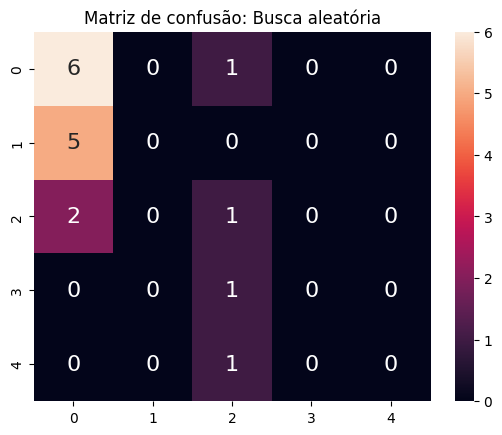

In [50]:
ordem_labels = [0,1,2,3,4]
matriz_conf = confusion_matrix(y_teste_tensor, y_pred_classes_aleatoria, labels=ordem_labels)
df_conf = pd.DataFrame(matriz_conf, ordem_labels, ordem_labels)
plt.title("Matriz de confusão: Busca aleatória")
sns.heatmap(df_conf, annot=True, annot_kws={"size": 16});

Conforme a matriz de confusão, observa-se valores majoritariamente fora da diagonal principal, o que demonstra uma certa discrepância entre os valores reais e os valores preditos.

Obteve-se a partir da busca em aleatória uma acurácia de cerca de 41.18%, sendo que os resultados obtidos sugerem que o desempenho do modelo se aproxima de um modelo baseline, prevendo apenas mais a classe 0 corretamente, sendo essa a classe mais frequente na distribuição dos dados, e na classe 2 que tem uma frequência média, teve ao menos 1 predição correta.

**Busca em grade**

Utilizando o mesmo pipeline, é possível treinar as redes utilizando os parâmetros obtidos pela busca em grade e pelo Optuna.

Assim, na busca em grade, temos que todas as camadas foram definidas com a mesma quantidade de neurônios.

In [51]:
gs.best_params_

{'lr': 0.001,
 'module__nonlin': ReLU(),
 'module__num_layers': 4,
 'module__num_units': 3}

In [52]:
unidades_por_camada_busca_em_grade = [gs.best_params_["module__num_units"] for i in range(gs.best_params_["module__num_layers"])]

In [53]:
unidades_por_camada_busca_em_grade

[3, 3, 3, 3]

In [54]:
mlp_busca_em_grade =  MLP(unidades_por_camada_busca_em_grade, funcao_ativacao="Sigmoid")

Intânciando o otimizador individualmente para o treinamento dessa rede.

In [55]:
otimizador2= optim.Adam(mlp_busca_em_grade.parameters(), lr=gs.best_params_["lr"])

Executando os ciclos de aprendizado durante 2000 épocas, novamente com o método de parada antecipada.

In [56]:
menor_perda = float('inf')
pesos_menor_perda = None
paciencia = 10 

loss_treino_lista = []
loss_validacao_lista = []

mlp_busca_em_grade.train() # Modo de treinamento

for epoca in range(2000):
    
    y_pred = mlp_busca_em_grade(X_treino_tensor) # forward pass
    
    otimizador2.zero_grad() # Zera os gradientes antes de calcular os novos

    loss_treino = fn_perda(y_pred, y_treino_tensor) # Cálculo da função de perda (MSE)
    loss_treino_lista.append(round(loss_treino.item(), 4)) # Adiciona a perda à lista
    loss_treino.backward() # Backpropagation
    
    otimizador2.step() # Atualização dos pesos

    mlp_busca_em_grade.eval()  # Modo de validação
    with torch.no_grad():  # Desativação do cálculo do gradiente
        y_pred_val = mlp_busca_em_grade(X_validacao_tensor)
        loss_validacao = fn_perda(y_pred_val, y_validacao_tensor)
        loss_validacao_lista.append(round(loss_validacao.item(), 4))

    # Early stopping
    if loss_validacao.item() < menor_perda:
        # Se a validação for menor do que a menor perda atual, definir como nova menor perda
        menor_perda = round(loss_validacao.item(), 4)
        pesos_menor_perda = copy.deepcopy(mlp_busca_em_grade.state_dict())  # E salvar os pesos do modelo       
        paciencia = 10
    else:
        paciencia -= 1
        if paciencia == 0:
            epoca_final = epoca
            print(f"Treinamento interrompido na época {epoca_final}")
            break
    print(f"Época {epoca}: loss treino = {loss_treino} | loss validação = {loss_validacao}")
# Define a rede com os parâmetros 
mlp_busca_em_grade.load_state_dict(pesos_menor_perda) # Carrega os pesos do modelo com menor perda

Época 0: loss treino = 1.7568423748016357 | loss validação = 1.7418609857559204
Época 1: loss treino = 1.7549340724945068 | loss validação = 1.7398865222930908
Época 2: loss treino = 1.753035306930542 | loss validação = 1.7379224300384521
Época 3: loss treino = 1.7511463165283203 | loss validação = 1.7359687089920044
Época 4: loss treino = 1.7492674589157104 | loss validação = 1.7340253591537476
Época 5: loss treino = 1.7473986148834229 | loss validação = 1.7320928573608398
Época 6: loss treino = 1.7455401420593262 | loss validação = 1.7301708459854126
Época 7: loss treino = 1.7436918020248413 | loss validação = 1.7282596826553345
Época 8: loss treino = 1.741853952407837 | loss validação = 1.7263598442077637
Época 9: loss treino = 1.7400262355804443 | loss validação = 1.724471092224121
Época 10: loss treino = 1.7382094860076904 | loss validação = 1.7225936651229858
Época 11: loss treino = 1.7364031076431274 | loss validação = 1.7207276821136475
Época 12: loss treino = 1.734607577323913

<All keys matched successfully>

In [57]:
with torch.no_grad(): # não calcula os gradientes locais
    y_pred_teste_busca_em_grade = mlp_busca_em_grade(X_teste_tensor)

In [58]:
y_pred_classes_grade = torch.argmax(y_pred_teste_busca_em_grade, dim=1)

acc_busca_em_grade = accuracy_score(y_teste_tensor.numpy(), y_pred_classes_grade.numpy())
print(f"A acurácia da rede foi de {acc_busca_em_grade * 100:.2f} %")

A acurácia da rede foi de 35.29 %


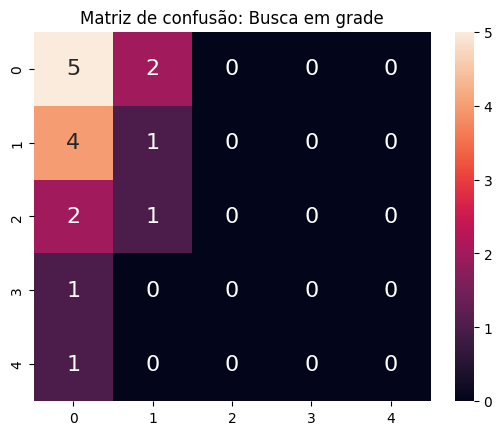

In [59]:
ordem_labels = [0,1,2,3,4]
matriz_conf = confusion_matrix(y_teste_tensor, y_pred_classes_grade, labels=ordem_labels)
df_conf = pd.DataFrame(matriz_conf, ordem_labels, ordem_labels)
plt.title("Matriz de confusão: Busca em grade")
sns.heatmap(df_conf, annot=True, annot_kws={"size": 16});

Nesse treino e teste com os parâmetros otimizados pela busca em grade, observa-se uma acurácia menor de 35.29%, todavia ainda observa-se mais de um valor na diagonal principal da matriz, sendo a maioria na classe 0, mas também presente na classe 1.

Apesar da busca em grade encontrar a melhor arquitetura dentro dos parâmetros dados, pode ter um resultado melhor visto que dependende de outros fatores do treinamento e teste da MLP, além de ter tido alguns valores diferentes em relação a arquitetura implementada com scikit-learn, em relação as feitas com Optuna. Ainda assim, apresentou uma acurácia próxima a da busca aleatória.

**Busca bayesiana**

Por fim, foi treinada a rede com os parâmetros da arquitetura encontrada na Busca Bayesiana.

In [60]:
parametros_melhor_trial_mlp_bayesiano

{'n_layers': 1,
 'n_units_0': 8,
 'funcao_de_ativacao': 'Sigmoide',
 'dropout_l0': 0.32731786960122744,
 'learning_rate': 0.004842959824223648}

In [61]:
unidades_por_camada_bayesiana = [
    parametros_melhor_trial_mlp_bayesiano[chave]
    for chave in parametros_melhor_trial_mlp_bayesiano
    if chave.startswith('n_units_')
]


In [62]:
mlp_bayesiana=  MLP(unidades_por_camada_bayesiana)

In [63]:
otimizador3= optim.Adam(mlp_bayesiana.parameters(), lr=parametros_melhor_trial_mlp_bayesiano["learning_rate"])

In [64]:
menor_perda = float('inf')
pesos_menor_perda = None
paciencia = 10 

loss_treino_lista = []
loss_validacao_lista = []

mlp_bayesiana.train() # Modo de treinamento

for epoca in range(2000):
    
    y_pred = mlp_bayesiana(X_treino_tensor) # forward pass
    
    otimizador3.zero_grad() # Zera os gradientes antes de calcular os novos

    loss_treino = fn_perda(y_pred, y_treino_tensor) # Cálculo da função de perda (MSE)
    loss_treino_lista.append(round(loss_treino.item(), 4)) # Adiciona a perda à lista
    loss_treino.backward() # Backpropagation
    
    otimizador3.step() # Atualização dos pesos

    mlp_bayesiana.eval()  # Modo de validação
    with torch.no_grad():  # Desativação do cálculo do gradiente
        y_pred_val = mlp_bayesiana(X_validacao_tensor)
        loss_validacao = fn_perda(y_pred_val, y_validacao_tensor)
        loss_validacao_lista.append(round(loss_validacao.item(), 4))

    # Early stopping
    if loss_validacao.item() < menor_perda:
        # Se a validação for menor do que a menor perda atual, definir como nova menor perda
        menor_perda = round(loss_validacao.item(), 4)
        pesos_menor_perda = copy.deepcopy(mlp_bayesiana.state_dict())  # E salvar os pesos do modelo       
        paciencia = 10
    else:
        paciencia -= 1
        if paciencia == 0:
            epoca_final = epoca
            print(f"Treinamento interrompido na época {epoca_final}")
            break
    print(f"Época {epoca}: loss treino = {loss_treino} | loss validação = {loss_validacao}")
# Define a rede com os parâmetros 
mlp_bayesiana.load_state_dict(pesos_menor_perda) # Carrega os pesos do modelo com menor perda

Época 0: loss treino = 1.7564456462860107 | loss validação = 1.7019057273864746
Época 1: loss treino = 1.7253938913345337 | loss validação = 1.684990406036377
Época 2: loss treino = 1.6961185932159424 | loss validação = 1.6689808368682861
Época 3: loss treino = 1.6681550741195679 | loss validação = 1.6537455320358276
Época 4: loss treino = 1.641139268875122 | loss validação = 1.639771819114685
Época 5: loss treino = 1.6152317523956299 | loss validação = 1.626546025276184
Época 6: loss treino = 1.5904268026351929 | loss validação = 1.6142733097076416
Época 7: loss treino = 1.5665912628173828 | loss validação = 1.60260808467865
Época 8: loss treino = 1.5436993837356567 | loss validação = 1.5914782285690308
Época 9: loss treino = 1.5214651823043823 | loss validação = 1.581214427947998
Época 10: loss treino = 1.500053882598877 | loss validação = 1.5711265802383423
Época 11: loss treino = 1.4797730445861816 | loss validação = 1.5604571104049683
Época 12: loss treino = 1.4603023529052734 | l

<All keys matched successfully>

In [65]:
with torch.no_grad(): # não calcula os gradientes locais
    y_pred_teste_bayesiana  = mlp_bayesiana(X_teste_tensor)

In [66]:
y_pred_classes_bayesiana = torch.argmax(y_pred_teste_bayesiana, dim=1)

acc_bayesiana = accuracy_score(y_teste_tensor.numpy(), y_pred_classes_bayesiana.numpy())
print(f"A acurácia da rede otimizada com busca bayesiana foi de {acc_bayesiana * 100:.2f} %")


A acurácia da rede otimizada com busca bayesiana foi de 41.18 %


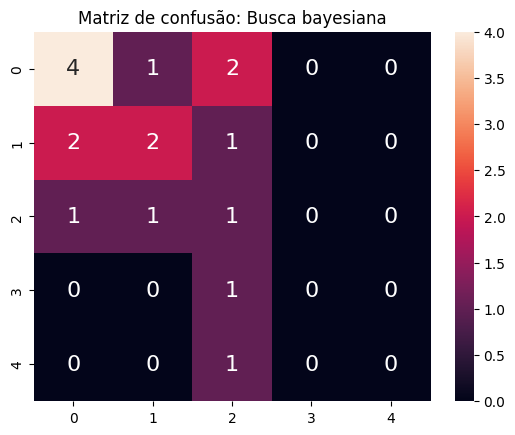

In [67]:
ordem_labels = [0,1,2,3,4]
matriz_conf = confusion_matrix(y_teste_tensor, y_pred_classes_bayesiana, labels=ordem_labels)
df_conf = pd.DataFrame(matriz_conf, ordem_labels, ordem_labels)
plt.title("Matriz de confusão: Busca bayesiana")
sns.heatmap(df_conf, annot=True, annot_kws={"size": 16});

A partir dessa arquitetura obteve-se uma acurácia igual ao da busca aleatória, observa-se que as matrizes de confusão formadas são diferentes, demonstrando que os modelos implementados não são iguais.Além disso, obserava-se mais valores na diagonal principal e próximos a ela, na matriz.

## 😁 **Conclusão**

<p align="justify">
Ao final do projeto, foi possível otimizar os parâmetros de uma rede MLP classificadora multiclasse, a qual visava a previsão da severidade de enfisemas pulmonares em pacientes com HIV. A partir dos três métodos de otimização apicados, foi possível obter três conjuntos de hiperparâmetros. Vale ressaltar que os hiperparâmetros dos métodos de busca em grade e busca bayesiana foram definidos dentro de um intervalo possível, enquanto a busca em grade foi feita com valores de hiperparâmetros definidos de forma discreta e sem dropout, sendo que, mesmo assim, a busca em grade apresentou o melhor resultado. A partir do treinamento e teste das redes MLP com cada uma das combinações de parâmetros, obteve-se diferentes valores de acurácia, sendo os dois maiores valores de 41.18% com a busca aleatória e bayesiana. Quanto ao menor resultado, foi a acurácia de 35.29%, com a busca em grade. Quanto a matriz de confusão tanto a busca em grade, quanto busca aleatória apresentam apenas dois valores na diagonal principal, enquanto a busca bayesiana apresenta três. Vale ressaltar também que em todas, a predições mais fidedignas foram em relação a classe 0, que apresenta maior frequência de dados. Apesar dos valores iguais entre a acurácia do modelo Bayesiano e de Busca aleatória, as matrizes de confusão foram diferentes o que demonstra modelos diferentes em suas predições. Além disso,a aplicação da ferramenta de parada antecipada é uma ferramenta que auxilixa na redução do custo computacional. Portanto, a acurácia próxima ao baseline, pode ter ocorrido devido ao desbalanceamento das classes. Desse modo, foi possível testar métodos diferentes de otimizadores e avaliar o desempenho de cada um deles para a predição desse modelo.
</p>

## 🗃️**Referências**

[1] What Is Optimization Modeling? | IBM. Disponível em: <https://www.ibm.com/think/topics/optimization-model>. Acesso em: 4 maio 2025.

[2] What Is Hyperparameter Tuning? | IBM. Disponível em: <https://www.ibm.com/think/topics/hyperparameter-tuning>. Acesso em: 7 maio 2025.

[3] SKORCH. Quickstart — Grid Search. Disponível em: https://skorch.readthedocs.io/en/stable/user/quickstart.html#grid-search. Acesso em: 3 jun. 2025.

[4] Quickstart — skorch 1.1.0 documentation. Disponível em: <https://skorch.readthedocs.io/en/stable/user/quickstart.html#grid-search>. Acesso em: 3 jun. 2025.

[5] Tuning MLP by using Optuna. Gist. Disponível em: <https://gist.github.com/toshihikoyanase/7e75b054395ec0a6dbb144a300862f60>. Acesso em: 28 mai. 2025.

[6] PANJEH. scikit learn hyperparameter optimization for MLPClassifier. Disponível em: <https://panjeh.medium.com/scikit-learn-hyperparameter-optimization-for-mlpclassifier-4d670413042b>. Acesso em: 21 mai. 2025.